Vorbemerkungen:

Mit der Datei "flights.parquet.gzip" läd man die Daten zu Beginn des Analyseprozesses (Kapitel 2) in das Programm.

Wenn man den Analyseprozess überspringen möchte, kann man den kann man mit der Datei "dataframe.parquet.gzip" den fertig bearbeiteten Dataframe laden, um sofort mit dem Modeltraining zu beginnen.

In den letzten beiden Zellen kann man dann noch die trainierten Modelle im Pickle-Format speichern und laden.

# !!! Bibliotheken !!!

In [96]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
import seaborn as sns
import io
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import pickle

time: 1 ms (started: 2023-08-02 12:37:29 +00:00)


In [97]:
!pip install ydata-profiling
!pip install ipython-autotime
%load_ext autotime

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 11.9 s (started: 2023-08-02 12:37:31 +00:00)


In [98]:
from ydata_profiling import ProfileReport

time: 582 µs (started: 2023-08-02 12:37:43 +00:00)


In [99]:
!python --version

Python 3.10.12
time: 108 ms (started: 2023-08-02 12:37:43 +00:00)


In [100]:
!pip install z3-solver
!pip list
import z3
z3.get_version_string()


Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.8.5
aiosignal                        1.3.1
alabaster                        0.7.13
albumentations                   1.2.1
altair                           4.2.2
anyio                            3.7.1
appdirs                          1.4.4
argon2-cffi                      21.3.0
argon2-cffi-bindings             21.2.0
array-record                     0.4.0
arviz                            0.15.1
astropy                          5.2.2
astunparse                       1.6.3
async-timeout                    4.0.2
attrs                            23.1.0
audioread                        3.0.0
autograd                         1.6.2
Babel                            2.12.1
backcall                         0.2.0
beautifulsoup4                   4.11.2
bleach                           6.0.0
blinker                          1.4
bl

'4.12.2'

time: 6.45 s (started: 2023-08-02 12:37:43 +00:00)


In [101]:
pd.options.mode.chained_assignment = None  # default='warn'
pd.set_option('display.max_columns', 70)


time: 877 µs (started: 2023-08-02 12:37:50 +00:00)


In [103]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import max_error
from sklearn.metrics import PredictionErrorDisplay

from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

time: 1.57 ms (started: 2023-08-02 12:37:50 +00:00)


In [102]:
#from google.colab import files
#uploaded = files.upload()

time: 446 µs (started: 2023-08-02 12:37:50 +00:00)


# 2. Import der Daten aus der Datenbank

Die Zwischenergebnisse des bearbeiteten Dataframes werden in externen Dateien zwischengespeichert um sich bei wiederholter Benutzung die redundanten Berechnungen zu ersparen.

In [ ]:
'''
1. Importieren der Daten aus der SQLite Datenbank und Speicherung in einem Pandas Dataframe. Die benutzen Tabellen heißen flights und flights_hourly
2. Das Dataframe wird in einem Parquet- File exportiert und extern gespeichert (deutlich kleiner)
3. Bei Gebrauch wird das Parquet File wieder hochgeladen und in einem Pandas Dataframe gespeichert
4. Die beiden gespeicherten Dataframes: flights.parquet.gzip, flights_hourly.parquet.gzip

from sqlalchemy import create_engine
# SQLAlchemy connectable
cnx = create_engine('sqlite:///ryanair_db.db').connect()

df = pd.read_sql_table('flights', cnx)
print(df)
'''

"\n1. Importieren der Daten aus der SQLite Datenbank und Speicherung in einem Pandas Dataframe. Die benutzen Tabellen heißen flights und flights_hourly\n2. Das Dataframe wird in einem Parquet- File exportiert und extern gespeichert (deutlich kleiner)\n3. Bei Gebrauch wird das Parquet File wieder hochgeladen und in einem Pandas Dataframe gespeichert\n4. Die beiden gespeicherten Dataframes: flights.parquet.gzip, flights_hourly.parquet.gzip\n\nfrom sqlalchemy import create_engine\n# SQLAlchemy connectable\ncnx = create_engine('sqlite:///ryanair_db.db').connect()\n\ndf = pd.read_sql_table('flights', cnx)\nprint(df)\n"

time: 6.77 ms (started: 2023-08-02 10:16:54 +00:00)


In [ ]:
# Speichern der Dataframes in einem Parquet File
# df.to_parquet('flights_hourly.parquet.gzip', compression='gzip')
# df.to_parquet('flights.parquet.gzip', compression='gzip')

time: 408 µs (started: 2023-08-02 10:16:54 +00:00)


In [ ]:
#hourly_df = pd.read_parquet('flights_hourly.parquet.gzip')
#hourly_df

time: 2.86 ms (started: 2023-08-02 10:17:06 +00:00)


In [ ]:
flights_df = pd.read_parquet('flights.parquet.gzip')
flights_df

,price,flight_date,departure_airport,arrival_airport,scrape_date
0,25.8000,2021-01-05,malaga,karlsruhe,2021-01-03
1,50.3300,2021-01-09,malaga,karlsruhe,2021-01-03
2,28.9900,2021-02-06,malaga,karlsruhe,2021-01-03
3,28.9900,2021-02-13,malaga,karlsruhe,2021-01-03
4,49.9900,2021-02-20,malaga,karlsruhe,2021-01-03
...,...,...,...,...,...
1129726,0.2899,2023-09-25,malta,karlsruhe,2023-06-30
1129727,0.3399,2023-10-02,malta,karlsruhe,2023-06-30
1129728,0.4499,2023-10-09,malta,karlsruhe,2023-06-30
1129729,0.3399,2023-10-16,malta,karlsruhe,2023-06-30


time: 628 ms (started: 2023-08-02 10:17:07 +00:00)


# 3. Analyse und Preprocessing

## 3.1 Genaue Analyse einer Woche (noch nicht fertig)


Überspringen, noch nicht richtig implementiert!!!

Es wurde eine zweite Tabelle erstellt, die eine Woche lang die Preisentwicklung der Flüge im 10 min Takt aufzeichnete.

In [ ]:
#hourly_df = pd.read_csv('flightdata_hourly.csv', header=None)

In [ ]:
hourly_df.columns = ["price", "flight_date", "departure_airport", "arrival_airport", "scrape_datetime"]

In [ ]:
hourly_df

,price,flight_date,departure_airport,arrival_airport,scrape_datetime
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095
1,173.99,2023-06-12,AGP,FKB,2023-06-05 17:06:09.705095
2,82.99,2023-06-14,AGP,FKB,2023-06-05 17:06:09.705095
3,76.74,2023-06-16,AGP,FKB,2023-06-05 17:06:09.705095
4,86.49,2023-06-19,AGP,FKB,2023-06-05 17:06:09.705095
...,...,...,...,...,...
3290889,60.99,2024-03-16,NAP,AGP,2023-06-13 04:07:30.470764
3290890,70.99,2024-03-18,NAP,AGP,2023-06-13 04:07:30.470764
3290891,60.99,2024-03-23,NAP,AGP,2023-06-13 04:07:30.470764
3290892,60.99,2024-03-25,NAP,AGP,2023-06-13 04:07:30.470764


In [ ]:
hourly_df.dtypes

price                       float64
flight_date          datetime64[ns]
departure_airport            object
arrival_airport              object
scrape_datetime      datetime64[ns]
dtype: object

In [ ]:
hourly_df["flight_date"] = pd.to_datetime(hourly_df["flight_date"])
hourly_df["scrape_datetime"] = pd.to_datetime(hourly_df["scrape_datetime"])
hourly_df['departure_airport'] = hourly_df['departure_airport'].astype('str')
hourly_df['arrival_airport'] = hourly_df['arrival_airport'].astype('str')

In [ ]:
hourly_df.head()

,price,flight_date,departure_airport,arrival_airport,scrape_datetime
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095
1,173.99,2023-06-12,AGP,FKB,2023-06-05 17:06:09.705095
2,82.99,2023-06-14,AGP,FKB,2023-06-05 17:06:09.705095
3,76.74,2023-06-16,AGP,FKB,2023-06-05 17:06:09.705095
4,86.49,2023-06-19,AGP,FKB,2023-06-05 17:06:09.705095


In [ ]:
hourly_df.sort_values(by=['scrape_datetime'], inplace=True)
hourly_df.tail()

,price,flight_date,departure_airport,arrival_airport,scrape_datetime
3290820,134.68,2023-08-18,NAP,AGP,2023-06-13 04:07:30.470764
3290819,191.73,2023-08-16,NAP,AGP,2023-06-13 04:07:30.470764
3290818,220.94,2023-08-14,NAP,AGP,2023-06-13 04:07:30.470764
3290828,38.99,2023-09-06,NAP,AGP,2023-06-13 04:07:30.470764
3290893,60.99,2024-03-30,NAP,AGP,2023-06-13 04:07:30.470764


In [ ]:
hourly_df['departure_airport'].unique()

array(['AGP', 'FKB', 'BRE', 'BRS', 'EDI', 'DUB', 'MLA', 'CGN', 'MAN',
       'FMM', 'NAP'], dtype=object)

In [ ]:
hourly_df['arrival_airport'].unique()

array(['FKB', 'AGP', 'BRE', 'BRS', 'EDI', 'DUB', 'MLA', 'MAN', 'CGN',
       'FMM'], dtype=object)

In [ ]:
change_df = hourly_df.drop_duplicates(subset = ["price",	"flight_date",	"departure_airport",	"arrival_airport"], keep="first" )
change_df

,price,flight_date,departure_airport,arrival_airport,scrape_datetime
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095
76,67.99,2023-12-22,AGP,FKB,2023-06-05 17:06:09.705095
75,44.99,2023-12-17,AGP,FKB,2023-06-05 17:06:09.705095
74,90.99,2023-12-15,AGP,FKB,2023-06-05 17:06:09.705095
73,104.99,2023-12-10,AGP,FKB,2023-06-05 17:06:09.705095
...,...,...,...,...,...
3249091,34.99,2023-10-11,BRS,AGP,2023-06-13 01:55:19.295175
3250013,265.03,2023-06-17,DUB,AGP,2023-06-13 01:55:35.269493
3275970,113.12,2023-06-13,BRE,AGP,2023-06-13 03:26:59.876066
3278806,62.12,2023-07-21,AGP,FKB,2023-06-13 03:36:53.288863


In [ ]:
change_df.query('flight_date=="2023-06-05"&departure_airport=="AGP"&arrival_airport=="BRS"')

,price,flight_date,departure_airport,arrival_airport,scrape_datetime
681,152.92,2023-06-05,AGP,BRS,2023-06-05 17:06:24.162244
29007,202.49,2023-06-05,AGP,BRS,2023-06-05 18:13:34.681605


In [ ]:
change_df["price_change"]= 0

In [ ]:
change_df["day"] = (change_df["flight_date"] - change_df["scrape_datetime"]).astype('timedelta64[D]')

In [ ]:
change_df["day"] = change_df["day"].astype(int)
change_df["price_change"] = change_df["price_change"].astype(float)
change_df

,price,flight_date,departure_airport,arrival_airport,scrape_datetime,price_change,day
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095,0.0,3
76,67.99,2023-12-22,AGP,FKB,2023-06-05 17:06:09.705095,0.0,199
75,44.99,2023-12-17,AGP,FKB,2023-06-05 17:06:09.705095,0.0,194
74,90.99,2023-12-15,AGP,FKB,2023-06-05 17:06:09.705095,0.0,192
73,104.99,2023-12-10,AGP,FKB,2023-06-05 17:06:09.705095,0.0,187
...,...,...,...,...,...,...,...
3249091,34.99,2023-10-11,BRS,AGP,2023-06-13 01:55:19.295175,0.0,119
3250013,265.03,2023-06-17,DUB,AGP,2023-06-13 01:55:35.269493,0.0,3
3275970,113.12,2023-06-13,BRE,AGP,2023-06-13 03:26:59.876066,0.0,-1
3278806,62.12,2023-07-21,AGP,FKB,2023-06-13 03:36:53.288863,0.0,37


In [ ]:
display(change_df.dtypes)

price                       float64
flight_date          datetime64[ns]
departure_airport            object
arrival_airport              object
scrape_datetime      datetime64[ns]
price_change                float64
day                           int64
dtype: object

In [ ]:
for count in range (0, len(change_df)-2):
  for index in range(count+1, len(change_df)-1):
    if (change_df.iloc[count]["price"]==change_df.iloc[count]["price"] and
        change_df.iloc[count]["flight_date"]==change_df.iloc[index][ "flight_date"] and
        change_df.iloc[count]["departure_airport"]==change_df.iloc[index]["departure_airport"] and
        change_df.iloc[count]["arrival_airport"]==change_df.iloc[index]["arrival_airport"]):
      #change_df.at[index,"price_change"] = 1
      print("Preis ", change_df.iloc[count]["price"]," € zwischen ", change_df.iloc[index]["departure_airport"], " und ", change_df.iloc[index]["arrival_airport"],
            " am ", change_df.iloc[index][ "flight_date"], " mit Preiseerhöhung ", (change_df.iloc[count]["price"]-change_df.iloc[count]["price"]),
            " um ", change_df.iloc[index][ "scrape_datetime"], " mit verbleibenden Tagen: ", change_df.iloc[count]["day"])
      break


Preis  200.99  € zwischen  AGP  und  FKB  am  2023-06-09 00:00:00  mit Preiseerhöhung  0.0  um  2023-06-06 09:04:26.757742  mit verbleibenden Tagen:  3
Preis  174.99  € zwischen  AGP  und  FKB  am  2023-11-05 00:00:00  mit Preiseerhöhung  0.0  um  2023-06-05 20:57:16.553777  mit verbleibenden Tagen:  152
Preis  139.99  € zwischen  AGP  und  FKB  am  2023-11-03 00:00:00  mit Preiseerhöhung  0.0  um  2023-06-08 12:21:38.898740  mit verbleibenden Tagen:  150
Preis  176.4  € zwischen  AGP  und  FKB  am  2023-10-29 00:00:00  mit Preiseerhöhung  0.0  um  2023-06-06 09:04:26.757742  mit verbleibenden Tagen:  145
Preis  99.8  € zwischen  AGP  und  FKB  am  2023-10-25 00:00:00  mit Preiseerhöhung  0.0  um  2023-06-08 09:19:03.118791  mit verbleibenden Tagen:  141


KeyboardInterrupt: ignored

In [ ]:
change_df.head(2)

,price,flight_date,departure_airport,arrival_airport,scrape_datetime,price_change,day
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095,0.0,3
76,67.99,2023-12-22,AGP,FKB,2023-06-05 17:06:09.705095,0.0,199


In [ ]:
change_df["weekday"] = pd.DatetimeIndex(change_df["scrape_datetime"]).weekday
change_df["hour"] = pd.DatetimeIndex(change_df["scrape_datetime"]).hour
change_df["change"] = 1

In [ ]:
change_df.reset_index(inplace=True)
change_df.drop(columns="index")

,price,flight_date,departure_airport,arrival_airport,scrape_datetime,price_change,day,weekday,hour,change
0,200.99,2023-06-09,AGP,FKB,2023-06-05 17:06:09.705095,0.0,3,0,17,1
1,67.99,2023-12-22,AGP,FKB,2023-06-05 17:06:09.705095,0.0,199,0,17,1
2,44.99,2023-12-17,AGP,FKB,2023-06-05 17:06:09.705095,0.0,194,0,17,1
3,90.99,2023-12-15,AGP,FKB,2023-06-05 17:06:09.705095,0.0,192,0,17,1
4,104.99,2023-12-10,AGP,FKB,2023-06-05 17:06:09.705095,0.0,187,0,17,1
...,...,...,...,...,...,...,...,...,...,...
11715,34.99,2023-10-11,BRS,AGP,2023-06-13 01:55:19.295175,0.0,119,1,1,1
11716,265.03,2023-06-17,DUB,AGP,2023-06-13 01:55:35.269493,0.0,3,1,1,1
11717,113.12,2023-06-13,BRE,AGP,2023-06-13 03:26:59.876066,0.0,-1,1,3,1
11718,62.12,2023-07-21,AGP,FKB,2023-06-13 03:36:53.288863,0.0,37,1,3,1


In [ ]:
change_df = change_df.iloc[3514:11662]

In [ ]:
change_df.drop(["level_0"], axis=1)

KeyError: ignored

In [ ]:
change_df.head(2)

,index,price,flight_date,departure_airport,arrival_airport,scrape_datetime,price_change,day,weekday,hour,change
3514,131480,102.29,2023-06-28,AGP,BRS,2023-06-06 00:06:30.425238,0.0,21,1,0,1
3515,132520,178.05,2023-06-06,AGP,DUB,2023-06-06 00:06:42.345266,0.0,-1,1,0,1


In [ ]:
change_df_com = pd.DataFrame(np.zeros((168,2)), columns = ["hour", "change"])

In [ ]:
change_df_com

,hour,change
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
163,0.0,0.0
164,0.0,0.0
165,0.0,0.0
166,0.0,0.0


In [ ]:
for index, row in change_df.iterrows():
  idx = ((row["scrape_datetime"].hour+1)*(row["scrape_datetime"].dayofweek+1))-1
  change_df_com.at[idx, "change"] += 1

<Axes: >

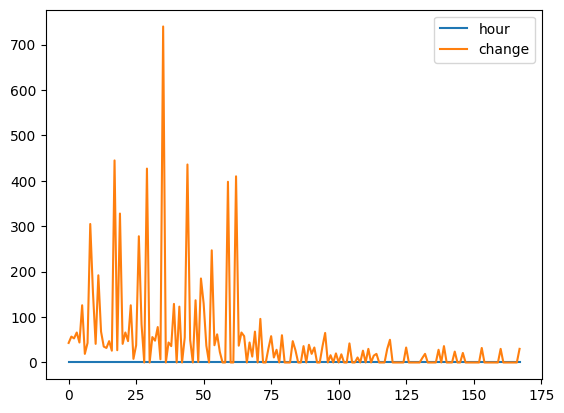

In [ ]:
change_df_com.plot()

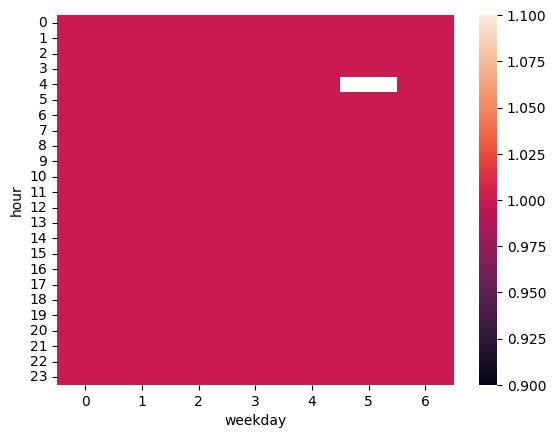

In [ ]:
out = change_df.groupby(['hour', 'weekday'])['change'].mean().unstack()
sns.heatmap(out)
plt.show()

## 3.3 Beschreibung des Dataframes

### 3.3.1 Automatische Beschreibung des Raw Dataframes mittels Ydata Profiling

In [ ]:
profile = ProfileReport(flights_df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

time: 34.5 s (started: 2023-08-02 10:17:20 +00:00)


### 3.3.2 Preprocessing des Dataframes

In [ ]:
flights_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1129731 entries, 0 to 1129730
Data columns (total 5 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   price              1129731 non-null  float64       
 1   flight_date        1129731 non-null  datetime64[ns]
 2   departure_airport  1129731 non-null  object        
 3   arrival_airport    1129731 non-null  object        
 4   scrape_date        1129731 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(2)
memory usage: 43.1+ MB
time: 445 ms (started: 2023-08-02 10:17:54 +00:00)


In [ ]:
flights_df.axes

[RangeIndex(start=0, stop=1129731, step=1),
 Index(['price', 'flight_date', 'departure_airport', 'arrival_airport',
        'scrape_date'],
       dtype='object')]

time: 6.21 ms (started: 2023-08-02 10:17:55 +00:00)


In [ ]:
flights_df.columns

Index(['price', 'flight_date', 'departure_airport', 'arrival_airport',
       'scrape_date'],
      dtype='object')

time: 4.44 ms (started: 2023-08-02 10:17:55 +00:00)


In [ ]:
flights_df.dtypes

price                       float64
flight_date          datetime64[ns]
departure_airport            object
arrival_airport              object
scrape_date          datetime64[ns]
dtype: object

time: 6.43 ms (started: 2023-08-02 10:17:55 +00:00)


In [ ]:
flights_df.index

RangeIndex(start=0, stop=1129731, step=1)

time: 3.22 ms (started: 2023-08-02 10:17:55 +00:00)


In [ ]:
flights_df.describe()

,price
count,1.129731e+06
mean,3.302171e+00
std,1.965799e+01
min,0.000000e+00
25%,4.099000e-01
50%,6.099000e-01
75%,9.199000e-01
max,9.010000e+02


time: 93.9 ms (started: 2023-08-02 10:17:55 +00:00)


array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'flight_date'}>],
       [<Axes: title={'center': 'scrape_date'}>, <Axes: >]], dtype=object)

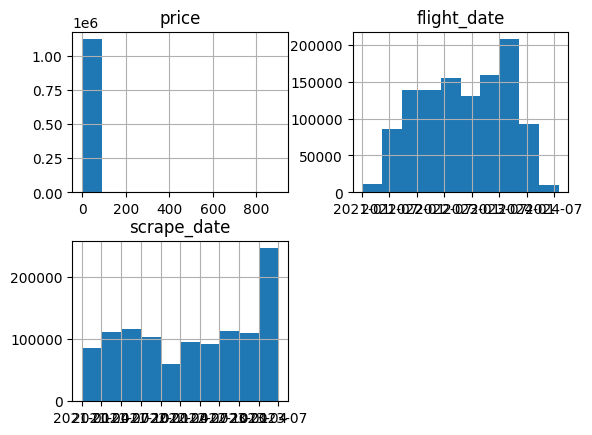

time: 1.21 s (started: 2023-08-02 10:17:55 +00:00)


In [ ]:
flights_df.hist()

In [ ]:
len(flights_df)

1129731

time: 6.13 ms (started: 2023-08-02 10:17:56 +00:00)


In [ ]:
# There are many duplicates, because two flights are scraped two times
len(flights_df)-len(flights_df.drop_duplicates())

165811

time: 350 ms (started: 2023-08-02 10:17:56 +00:00)


In [ ]:
# Bei einigen Tagen gibt es mehrere Preise zum gleichen Flug, es wird der erste aufgezeichnete Preis in der Tabelle beibehalten
df = flights_df.drop_duplicates(subset=['flight_date', 'departure_airport','arrival_airport',	'scrape_date'], keep='last')
df.reset_index(drop = True, inplace= True)
df

,price,flight_date,departure_airport,arrival_airport,scrape_date
0,25.8000,2021-01-05,malaga,karlsruhe,2021-01-03
1,50.3300,2021-01-09,malaga,karlsruhe,2021-01-03
2,28.9900,2021-02-06,malaga,karlsruhe,2021-01-03
3,28.9900,2021-02-13,malaga,karlsruhe,2021-01-03
4,49.9900,2021-02-20,malaga,karlsruhe,2021-01-03
...,...,...,...,...,...
959972,0.2899,2023-09-25,malta,karlsruhe,2023-06-30
959973,0.3399,2023-10-02,malta,karlsruhe,2023-06-30
959974,0.4499,2023-10-09,malta,karlsruhe,2023-06-30
959975,0.3399,2023-10-16,malta,karlsruhe,2023-06-30


time: 335 ms (started: 2023-08-02 10:17:56 +00:00)


In [ ]:
flights_df.columns

Index(['price', 'flight_date', 'departure_airport', 'arrival_airport',
       'scrape_date'],
      dtype='object')

time: 3.45 ms (started: 2023-08-02 10:17:57 +00:00)


Set Column to Datetime

In [ ]:
df['flight_date'] =  pd.to_datetime(df['flight_date'], infer_datetime_format=True)
df['scrape_date'] =  pd.to_datetime(df['scrape_date'], infer_datetime_format=True)

time: 93.9 ms (started: 2023-08-02 10:17:57 +00:00)


Correct Price Values because of Data Format Change at 21.02.2021->22.02.2022!

In [ ]:
df[df["scrape_date"]=='2021-02-22'].head(3)

,price,flight_date,departure_airport,arrival_airport,scrape_date
37345,0.2099,2021-03-30,edinburgh,malaga,2021-02-22
37346,0.4599,2021-04-03,edinburgh,malaga,2021-02-22
37347,0.4099,2021-04-06,edinburgh,malaga,2021-02-22


time: 34.9 ms (started: 2023-08-02 10:17:57 +00:00)


In [ ]:
df[df["scrape_date"]=='2021-02-21'].head(3)

,price,flight_date,departure_airport,arrival_airport,scrape_date
36238,237.0,2021-03-30,warschau,malaga,2021-02-21
36239,203.0,2021-04-03,warschau,malaga,2021-02-21
36240,237.0,2021-04-06,warschau,malaga,2021-02-21


time: 17.3 ms (started: 2023-08-02 10:17:57 +00:00)


array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'flight_date'}>],
       [<Axes: title={'center': 'scrape_date'}>, <Axes: >]], dtype=object)

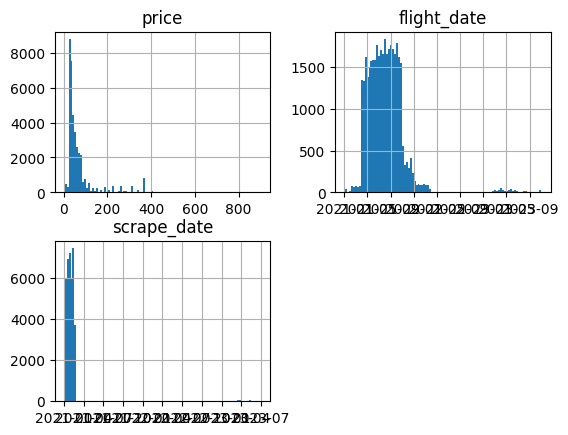

time: 2.31 s (started: 2023-08-02 10:17:57 +00:00)


In [ ]:
df[df["price"]>4].hist(bins=100)

In [ ]:
df.iloc[[37344,37345]]

,price,flight_date,departure_airport,arrival_airport,scrape_date
37344,96.9900,2022-03-25,memmingen,malaga,2021-02-21
37345,0.2099,2021-03-30,edinburgh,malaga,2021-02-22


time: 19.9 ms (started: 2023-08-02 10:17:59 +00:00)


Ab Position 37345 gab es einen Datenfehler, da am 22.2.2021 die Webseite das Anzeigeformat für die Preise änderte.

time: 37.1 ms (started: 2023-08-02 10:17:59 +00:00)


In [ ]:
# change prices from 0.1999 to 19.99
df.iloc[37345:,0]=df.iloc[37345:,0]*100

time: 21.4 ms (started: 2023-08-02 10:17:59 +00:00)


In [ ]:
df.iloc[37342:44847]

,price,flight_date,departure_airport,arrival_airport,scrape_date
37342,96.99,2022-03-18,memmingen,malaga,2021-02-21
37343,66.99,2022-03-21,memmingen,malaga,2021-02-21
37344,96.99,2022-03-25,memmingen,malaga,2021-02-21
37345,20.99,2021-03-30,edinburgh,malaga,2021-02-22
37346,45.99,2021-04-03,edinburgh,malaga,2021-02-22
...,...,...,...,...,...
44842,82.99,2022-02-07,edinburgh,malaga,2021-03-01
44843,82.99,2022-02-09,edinburgh,malaga,2021-03-01
44844,116.99,2022-02-11,edinburgh,malaga,2021-03-01
44845,116.99,2022-02-12,edinburgh,malaga,2021-03-01


time: 21.5 ms (started: 2023-08-02 10:17:59 +00:00)


<Axes: >

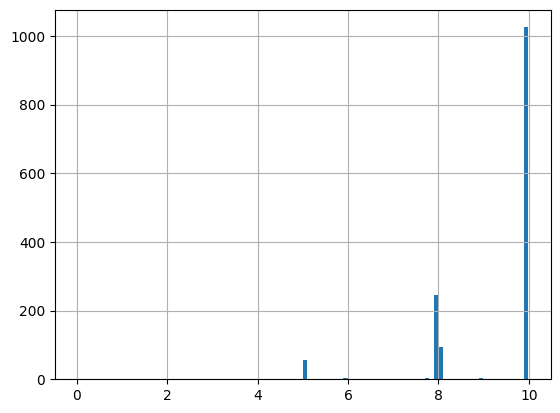

time: 462 ms (started: 2023-08-02 10:17:59 +00:00)


In [ ]:
df[(df["price"]<10)&(df["price"]>0)]["price"].hist(bins=100)

Die billigsten Flüge fangen bei 5€ an.

In [ ]:
# Anzahl der Preise, die gleich null sind
len(df[df.price==0])

8674

time: 22.7 ms (started: 2023-08-02 10:18:00 +00:00)


Es werden nun alle Zeilen entfernt, deren Preise gleich Null sind.

In [ ]:
# entferne alle Zeilen, in denen der Preis = 0 ist
df = df[df.price>1]
df.reset_index(drop = True, inplace= True)
df.shape

(951302, 5)

time: 165 ms (started: 2023-08-02 10:18:00 +00:00)


In [ ]:
df[(df["price"]>0) & (df["price"]<1)]

,price,flight_date,departure_airport,arrival_airport,scrape_date


time: 20.9 ms (started: 2023-08-02 10:18:00 +00:00)


### 3.3.3 Automatische Beschreibung mittels Ydata Profiling nach dem Preprocessing (pandas profiling)

In [ ]:
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

time: 17.1 s (started: 2023-08-02 10:18:00 +00:00)


### 3.3.4 Suchen von fehlenden Tagen bei der Datenerhebung

In [ ]:
days_covered = df["scrape_date"]
days_covered = pd.DataFrame(days_covered.unique(), columns=["days"])

time: 13.9 ms (started: 2023-08-02 10:18:17 +00:00)


In [ ]:
all_dates = pd.date_range(start="2021-01-03", end="2023-06-14", freq="B")

time: 16.9 ms (started: 2023-08-02 10:18:17 +00:00)


In [ ]:
print(all_dates.difference(days_covered["days"]))

DatetimeIndex(['2021-01-07', '2021-01-12', '2021-03-02', '2021-03-15',
               '2021-03-16', '2021-03-17', '2021-03-18', '2021-04-02',
               '2021-04-30', '2021-05-10', '2021-05-17', '2021-05-25',
               '2021-05-27', '2021-05-31', '2021-06-15', '2021-07-27',
               '2021-08-11', '2021-09-20', '2021-09-30', '2021-10-25',
               '2021-10-26', '2021-11-05', '2021-11-10', '2021-11-11',
               '2021-11-19', '2021-11-22', '2021-12-08', '2021-12-20',
               '2021-12-28', '2021-12-30', '2022-01-10', '2022-01-14',
               '2022-01-17', '2022-01-18', '2022-01-27', '2022-01-28',
               '2022-01-31', '2022-02-01', '2022-02-02', '2022-02-03',
               '2022-02-04', '2022-02-07', '2022-02-08', '2022-02-09',
               '2022-02-10', '2022-02-11', '2022-02-14', '2022-02-15',
               '2022-02-16', '2022-02-21', '2022-02-24', '2022-03-02',
               '2022-03-14', '2022-04-06', '2022-05-20', '2022-06-01',
      

In [ ]:
print(len(all_dates.difference(days_covered["days"])))

89
time: 7.31 ms (started: 2023-08-02 10:18:17 +00:00)


Es wurden an 89 Tagen keine Daten erhoben.

time: 19.4 ms (started: 2023-08-02 10:18:17 +00:00)


## 3.4 Feature Engineering



Hinzugfügen einer Spalte, die die verbleibenden Tage bis zum Abflug beschreibt

In [ ]:
df["day"] = df["flight_date"] - df["scrape_date"]
df["day"] = df["day"].dt.days

time: 59.1 ms (started: 2023-08-02 10:18:17 +00:00)


In [ ]:
df["fd_year"] = pd.DatetimeIndex(df["flight_date"]).year
df["fd_quarter"] = pd.DatetimeIndex(df["flight_date"]).quarter
df["fd_month"] = pd.DatetimeIndex(df["flight_date"]).month
df["fd_week"] = pd.DatetimeIndex(df["flight_date"]).week
df["fd_weekday"] = pd.DatetimeIndex(df["flight_date"]).weekday
df["sc_weekday"] = pd.DatetimeIndex(df["scrape_date"]).weekday
df["fd_dayofyear"] = pd.DatetimeIndex(df["flight_date"]).dayofyear

<ipython-input-43-14d7eb23f9be>:4: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  df["fd_week"] = pd.DatetimeIndex(df["flight_date"]).week


time: 1.56 s (started: 2023-08-02 10:18:17 +00:00)


In [ ]:
df.head(2)

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear
0,25.80,2021-01-05,malaga,karlsruhe,2021-01-03,2,2021,1,1,1,1,6,5
1,50.33,2021-01-09,malaga,karlsruhe,2021-01-03,6,2021,1,1,1,5,6,9


time: 23.3 ms (started: 2023-08-02 10:18:19 +00:00)


Eine Pandas Series Object, das den Durchschnitt der letzten 49 Tage ohne den Abflugtag enthält vor dem 1.4.2023 für jeden Tag im Jahr (dayofyear).

In [ ]:
average = pd.Series(np.zeros(367))
for index in range(1,366):
  h_df = df[(df["fd_dayofyear"]==(index)) & (df["day"]<50) & (df["day"]>1) & (df["scrape_date"]<"2023-01-04")]
  av = h_df["price"].mean()
  average.iloc[index]=av

time: 5.59 s (started: 2023-08-02 10:18:19 +00:00)


In [ ]:
average[55:65]

55     50.911905
56     74.365392
57     18.292778
58     54.636415
59    115.787222
60           NaN
61     89.483500
62     62.418500
63     69.650088
64     26.298500
dtype: float64

time: 5.25 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
 df[(df["fd_dayofyear"]==(61)) & (df["day"]<50) & (df["day"]>1) & (df["scrape_date"]<"2023-01-04")]

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear
345034,33.69,2022-03-02,manchester,malaga,2022-01-12,49,2022,1,3,9,2,2,61
345287,22.79,2022-03-02,neapel,malaga,2022-01-12,49,2022,1,3,9,2,2,61
345381,20.89,2022-03-02,edinburgh,malaga,2022-01-12,49,2022,1,3,9,2,2,61
345572,37.29,2022-03-02,malaga,memmingen,2022-01-12,49,2022,1,3,9,2,2,61
345740,49.99,2022-03-02,memmingen,malaga,2022-01-12,49,2022,1,3,9,2,2,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...
362200,139.00,2022-03-02,manchester,malaga,2022-02-28,2,2022,1,3,9,2,0,61
362585,247.00,2022-03-02,memmingen,malaga,2022-02-28,2,2022,1,3,9,2,0,61
362658,172.99,2022-03-02,malaga,memmingen,2022-02-28,2,2022,1,3,9,2,0,61
362731,323.50,2022-03-02,neapel,malaga,2022-02-28,2,2022,1,3,9,2,0,61


time: 40 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
average.isna().sum()

5

time: 5 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
df[df["day"]==60]["price"].min()

7.99

time: 11.3 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
average[350:]

350     54.252880
351     62.281012
352     62.926716
353     60.506000
354     63.744320
355     60.266721
356    103.657880
357     93.243409
358    113.421504
359           NaN
360    150.976900
361    133.818695
362    102.573043
363    131.572998
364    130.885837
365     84.004603
366      0.000000
dtype: float64

time: 5.8 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
average[average.isna()==True]

60    NaN
67    NaN
74    NaN
81    NaN
359   NaN
dtype: float64

time: 8.93 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
df["9dayavg"]= np.nan

time: 4.4 ms (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
for index, row in df.iterrows():
    df["9dayavg"].iat[index] = average.iloc[(int)(row["fd_dayofyear"])]

time: 4min 3s (started: 2023-08-02 10:18:25 +00:00)


In [ ]:
df

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg
0,25.80,2021-01-05,malaga,karlsruhe,2021-01-03,2,2021,1,1,1,1,6,5,64.022845
1,50.33,2021-01-09,malaga,karlsruhe,2021-01-03,6,2021,1,1,1,5,6,9,53.948162
2,28.99,2021-02-06,malaga,karlsruhe,2021-01-03,34,2021,1,2,5,5,6,37,25.263688
3,28.99,2021-02-13,malaga,karlsruhe,2021-01-03,41,2021,1,2,6,5,6,44,29.910420
4,49.99,2021-02-20,malaga,karlsruhe,2021-01-03,48,2021,1,2,7,5,6,51,39.625976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951297,28.99,2023-09-25,malta,karlsruhe,2023-06-30,87,2023,3,9,39,0,4,268,34.932537
951298,33.99,2023-10-02,malta,karlsruhe,2023-06-30,94,2023,4,10,40,0,4,275,39.933129
951299,44.99,2023-10-09,malta,karlsruhe,2023-06-30,101,2023,4,10,41,0,4,282,69.861471
951300,33.99,2023-10-16,malta,karlsruhe,2023-06-30,108,2023,4,10,42,0,4,289,56.213106


time: 25.2 ms (started: 2023-08-02 10:22:28 +00:00)


In [ ]:
df["fd_dayofyear"].describe()

count    951302.000000
mean        188.094231
std         102.026844
min           1.000000
25%          98.000000
50%         198.000000
75%         272.000000
max         365.000000
Name: fd_dayofyear, dtype: float64

time: 51.1 ms (started: 2023-08-02 10:22:28 +00:00)


In [ ]:
df

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg
0,25.80,2021-01-05,malaga,karlsruhe,2021-01-03,2,2021,1,1,1,1,6,5,64.022845
1,50.33,2021-01-09,malaga,karlsruhe,2021-01-03,6,2021,1,1,1,5,6,9,53.948162
2,28.99,2021-02-06,malaga,karlsruhe,2021-01-03,34,2021,1,2,5,5,6,37,25.263688
3,28.99,2021-02-13,malaga,karlsruhe,2021-01-03,41,2021,1,2,6,5,6,44,29.910420
4,49.99,2021-02-20,malaga,karlsruhe,2021-01-03,48,2021,1,2,7,5,6,51,39.625976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951297,28.99,2023-09-25,malta,karlsruhe,2023-06-30,87,2023,3,9,39,0,4,268,34.932537
951298,33.99,2023-10-02,malta,karlsruhe,2023-06-30,94,2023,4,10,40,0,4,275,39.933129
951299,44.99,2023-10-09,malta,karlsruhe,2023-06-30,101,2023,4,10,41,0,4,282,69.861471
951300,33.99,2023-10-16,malta,karlsruhe,2023-06-30,108,2023,4,10,42,0,4,289,56.213106


time: 21.2 ms (started: 2023-08-02 10:22:28 +00:00)


In [ ]:
# id- column gibt jeden Flug eine eigene Id
# die sich aus dem Abflugdatum, dem departure_airport und dem	arrival_airport zusammensetzt
df["id"]= pd.DatetimeIndex(df["flight_date"]).year

time: 105 ms (started: 2023-08-02 10:22:28 +00:00)


In [ ]:
airports = pd.unique(df[['departure_airport', 'arrival_airport']].values.ravel('K')).tolist()
print(airports)

['malaga', 'karlsruhe', 'memmingen', 'manchester', 'edinburgh', 'neapel', 'warschau', 'bremen', 'malta', 'dublin', 'bristol', 'köln']
time: 238 ms (started: 2023-08-02 10:22:28 +00:00)


In [ ]:
airport_dict = {}
for index in range(0,len(airports)):
  airport_dict[airports[index]]= index+100

time: 678 µs (started: 2023-08-02 10:22:29 +00:00)


In [ ]:
print(airport_dict)

{'malaga': 100, 'karlsruhe': 101, 'memmingen': 102, 'manchester': 103, 'edinburgh': 104, 'neapel': 105, 'warschau': 106, 'bremen': 107, 'malta': 108, 'dublin': 109, 'bristol': 110, 'köln': 111}
time: 1.58 ms (started: 2023-08-02 10:22:29 +00:00)


In [ ]:
df["id"] = (pd.DatetimeIndex(df["flight_date"]).year) * 10000000000 + pd.DatetimeIndex(df["flight_date"]).month * 100000000 + pd.DatetimeIndex(df["flight_date"]).day * 1000000
df["connection"] = np.nan


for idx, row in df.iterrows():
  df.loc[idx,'id'] = int(df.loc[idx,'id']) + int(airport_dict[df.loc[idx,'departure_airport']])*1000 +  int(airport_dict[df.loc[idx,'arrival_airport']])
  df.loc[idx,"connection"] = 1000000 + int(airport_dict[df.loc[idx,'departure_airport']])*1000 +  int(airport_dict[df.loc[idx,'arrival_airport']])
  #print(df.loc[idx,'id'])

time: 9min 28s (started: 2023-08-02 10:22:29 +00:00)


In [ ]:
df[df["scrape_date"]=='2021-02-11'].head(3)

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
27653,41.73,2021-03-28,manchester,malaga,2021-02-11,45,2021,1,3,12,6,3,87,58.983841,20210328103100,1103100.0
27654,59.99,2021-03-29,manchester,malaga,2021-02-11,46,2021,1,3,13,0,3,88,29.168778,20210329103100,1103100.0
27655,82.99,2021-03-31,manchester,malaga,2021-02-11,48,2021,1,3,13,2,3,90,37.749419,20210331103100,1103100.0


time: 40.1 ms (started: 2023-08-02 10:31:57 +00:00)


In [ ]:
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
df[df['price']<1]

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection


time: 14.8 ms (started: 2023-08-02 10:33:30 +00:00)


In [ ]:
unique_flights = df.drop_duplicates(["flight_date", "departure_airport", "arrival_airport"])[["flight_date", "departure_airport", "arrival_airport"]]
len(unique_flights)
unique_flights.reset_index(drop = True, inplace= True)
unique_flights

,flight_date,departure_airport,arrival_airport
0,2021-01-05,malaga,karlsruhe
1,2021-01-09,malaga,karlsruhe
2,2021-02-06,malaga,karlsruhe
3,2021-02-13,malaga,karlsruhe
4,2021-02-20,malaga,karlsruhe
...,...,...,...
8065,2024-07-07,dublin,malaga
8066,2024-07-08,dublin,malaga
8067,2024-07-10,dublin,malaga
8068,2024-07-12,dublin,malaga


time: 284 ms (started: 2023-08-02 10:33:30 +00:00)


In [ ]:
unique_flights_code = df.drop_duplicates(["id"])[["id"]]
unique_flights_code.sort_values(by=['id'])
unique_flights_code.reset_index(drop = True, inplace= True)
unique_flights_code

,id
0,20210105100101
1,20210109100101
2,20210206100101
3,20210213100101
4,20210220100101
...,...
8065,20240707109100
8066,20240708109100
8067,20240710109100
8068,20240712109100


time: 61.8 ms (started: 2023-08-02 10:33:30 +00:00)


In [ ]:
def create_list_of_flights(unique_flights, df):
  flights_list = list()
  for flight in unique_flights_code.itertuples():
    df_temp = df[(df["id"]==flight[1])]
    #print(df_temp)
    flights_list.append(df_temp)
    #print(flight.Index)
    if(flight.Index % 1000 == 0):
      print(flight.Index)

  return flights_list

flights_list = create_list_of_flights(unique_flights, df)

0
1000
2000
3000
4000
5000
6000
7000
8000
time: 16.7 s (started: 2023-08-02 10:33:30 +00:00)


In [ ]:
flights_list[2000]

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
187945,91.99,2022-09-15,edinburgh,malaga,2021-08-01,410,2022,3,9,37,3,6,258,37.936533,20220915104100,1104100.0
189013,91.99,2022-09-15,edinburgh,malaga,2021-08-02,409,2022,3,9,37,3,0,258,37.936533,20220915104100,1104100.0
190374,91.99,2022-09-15,edinburgh,malaga,2021-08-03,408,2022,3,9,37,3,1,258,37.936533,20220915104100,1104100.0
191265,91.99,2022-09-15,edinburgh,malaga,2021-08-04,407,2022,3,9,37,3,2,258,37.936533,20220915104100,1104100.0
192945,91.99,2022-09-15,edinburgh,malaga,2021-08-05,406,2022,3,9,37,3,3,258,37.936533,20220915104100,1104100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252290,91.99,2022-09-15,edinburgh,malaga,2021-10-01,349,2022,3,9,37,3,4,258,37.936533,20220915104100,1104100.0
253728,91.99,2022-09-15,edinburgh,malaga,2021-10-02,348,2022,3,9,37,3,5,258,37.936533,20220915104100,1104100.0
254936,91.99,2022-09-15,edinburgh,malaga,2021-10-03,347,2022,3,9,37,3,6,258,37.936533,20220915104100,1104100.0
256739,91.99,2022-09-15,edinburgh,malaga,2021-10-04,346,2022,3,9,37,3,0,258,37.936533,20220915104100,1104100.0


time: 39 ms (started: 2023-08-02 10:33:47 +00:00)


In [ ]:
# Speichern der flights_list als Pickle File
'''
with open('flights_list.pkl', 'wb') as f:  # open a text file
    pickle.dump(flights_list, f) # serialize the list
f.close()
'''

"\nwith open('flights_list.pkl', 'wb') as f:  # open a text file\n    pickle.dump(flights_list, f) # serialize the list\nf.close()\n"

time: 3.08 ms (started: 2023-08-02 10:33:47 +00:00)


In [ ]:
# # Laden der flights_list als Pickle File

#with open('flights_list.pkl', 'rb') as f:
#    flights_list = pickle.load(f) # deserialize using load()

time: 408 µs (started: 2023-08-02 10:33:47 +00:00)


## 3.5 Plotting

Die längste Flugzeitreihe dauert 426 Tage.

In [ ]:
maxClm = 0
for flight_df in flights_list:
  temp_max = flight_df['day'].max()
  if (temp_max > maxClm):
    maxClm = temp_max
print(maxClm)


426
time: 1.2 s (started: 2023-08-02 10:33:47 +00:00)


Der letzte Tag, von dem ein Datenpunkt existiert. (der letzte Kauftag)

In [ ]:
flight_min = np.zeros(427, dtype=int)

time: 789 µs (started: 2023-08-02 10:33:48 +00:00)


In [ ]:
for flight_df in flights_list:
  if ((flight_df.iloc[0]["flight_date"]>datetime(2022,1,1)) & (flight_df.iloc[0]["flight_date"]<datetime(2023,5,1))):
    flight_min[flight_df['day'].min()] += 1

time: 2.85 s (started: 2023-08-02 10:33:48 +00:00)


Es werden nur Flüge betrachtet, die zwischen den 1.1.2022 und dem 5.1.2023 enden, damit der ganze Verkaufszeitraum erfasst werden kann.

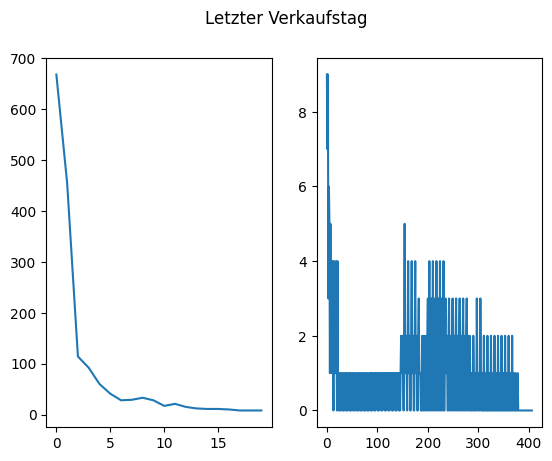

time: 323 ms (started: 2023-08-02 10:33:51 +00:00)


In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('Letzter Verkaufstag')
ax1.plot(flight_min[:20])
ax2.plot(flight_min[20:])
plt.plot()
plt.show()

In [ ]:
flight_min

array([668, 455, 114,  92,  60,  41,  28,  29,  33,  28,  17,  21,  15,
        12,  11,  11,  10,   8,   8,   8,   9,   7,   9,   3,   6,   5,
         1,   5,   2,   4,   1,   4,   2,   0,   4,   1,   3,   1,   4,
         2,   0,   4,   1,   1,   0,   1,   0,   0,   1,   1,   1,   0,
         1,   0,   0,   1,   1,   1,   0,   1,   0,   0,   1,   1,   1,
         0,   1,   0,   0,   1,   1,   1,   0,   1,   0,   0,   1,   1,
         1,   0,   1,   0,   0,   1,   1,   1,   0,   1,   0,   0,   1,
         1,   1,   0,   1,   0,   0,   1,   1,   1,   0,   1,   0,   0,
         1,   1,   1,   0,   1,   0,   1,   1,   1,   1,   0,   1,   0,
         1,   1,   1,   1,   0,   1,   0,   1,   1,   1,   1,   0,   1,
         0,   1,   1,   1,   1,   0,   1,   0,   1,   1,   1,   1,   0,
         1,   0,   1,   1,   1,   1,   0,   1,   0,   1,   1,   1,   1,
         0,   1,   0,   1,   1,   1,   1,   0,   1,   0,   1,   2,   1,
         2,   1,   1,   0,   2,   5,   1,   2,   2,   1,   0,   

time: 6.31 ms (started: 2023-08-02 10:33:52 +00:00)


Anzahl der Datenpunkte an dem jeweiligen verbleibenden Tag:

In [ ]:
flight_frq = np.zeros(427, dtype=int)

time: 729 µs (started: 2023-08-02 10:33:52 +00:00)


In [ ]:
for flight_df in flights_list:
  if ((flight_df.iloc[0]["flight_date"]>datetime(2022,1,1)) & (flight_df.iloc[0]["flight_date"]<datetime(2023,5,1))):
    for row in flight_df.itertuples():
      flight_frq[row[6]] += 1

time: 7.39 s (started: 2023-08-02 10:33:52 +00:00)


An den ersten 200 Tagen gibt es für fast alle Flüge Verkaufszeitpunkte. Am letzten Tag sind deutlich weniger Flüge gelistet.

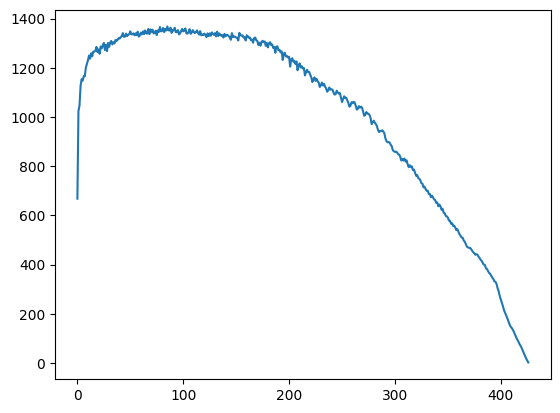

time: 317 ms (started: 2023-08-02 10:33:59 +00:00)


In [ ]:
plt.plot(flight_frq)
plt.show()

Anzahl der Flüge, die an dem jeweiligen Tag enden: da 2023 viele Flüge nach dem Erhebungszeitraum enden, sind viele Flüge nur in Teilen aufgezeichnet

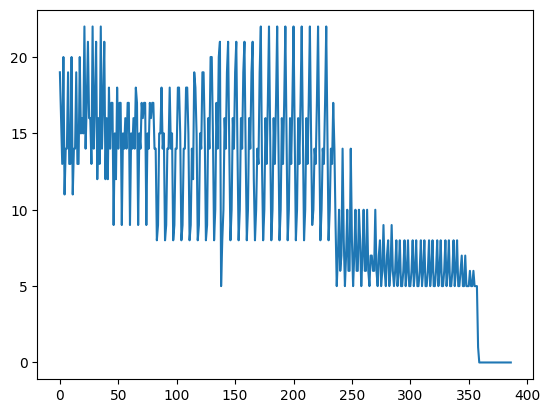

time: 963 ms (started: 2023-08-02 10:33:59 +00:00)


In [ ]:
flight_frq_end = np.zeros(427, dtype=int)

for flight_df in flights_list:
  flight_frq_end[flight_df["day"].min()] += 1

plt.plot(flight_frq_end[40:])
plt.show()

An den letzten beiden Tagen werden noch bei jeweils 1000 Flügen der letzte Verkaufstag, bei 200 Flügen ist der 3. Tag der letzte Verkaufstag. Danach fällt der Wert auf ungefähr 15-20, am 250. Tag gibt es einen weitern Abfall auf ungefähr 3.

In [ ]:
print(flight_frq)

[ 668 1024 1047 1126 1154 1148 1166 1166 1201 1216 1231 1250 1237 1259
 1247 1266 1266 1269 1285 1264 1275 1257 1287 1279 1291 1301 1272 1294
 1268 1301 1285 1303 1309 1295 1304 1299 1313 1309 1314 1321 1319 1325
 1329 1341 1326 1327 1339 1329 1334 1337 1348 1336 1336 1340 1332 1340
 1333 1347 1327 1331 1343 1336 1348 1337 1352 1340 1339 1358 1337 1356
 1346 1355 1340 1341 1351 1333 1352 1346 1366 1348 1350 1362 1345 1358
 1352 1368 1352 1352 1363 1342 1353 1352 1363 1345 1345 1353 1336 1340
 1350 1358 1348 1351 1360 1340 1339 1345 1357 1338 1344 1353 1345 1341
 1346 1352 1342 1335 1349 1332 1336 1333 1339 1333 1325 1340 1329 1340
 1330 1344 1337 1334 1341 1328 1347 1329 1340 1334 1330 1333 1323 1338
 1328 1334 1333 1329 1323 1314 1341 1325 1328 1326 1323 1322 1311 1342
 1332 1331 1332 1323 1324 1311 1332 1328 1322 1323 1312 1315 1302 1321
 1323 1312 1309 1293 1302 1290 1305 1310 1304 1307 1289 1301 1283 1300
 1304 1293 1295 1281 1285 1261 1286 1287 1271 1273 1263 1267 1232 1258
 1261 

In [ ]:
flights_list_rw = []
for flight_df in flights_list:
  if(flight_df['day'].min() > 100):
    flights_list_rw.append(flight_df)

time: 641 ms (started: 2023-08-02 10:34:00 +00:00)


In [ ]:
len(flights_list_rw)

3282

time: 5.7 ms (started: 2023-08-02 10:34:01 +00:00)


In [ ]:
len(flights_list)

8070

time: 6.23 ms (started: 2023-08-02 10:34:01 +00:00)


In [ ]:
flights_list_rw[400]

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
237159,28.99,2022-10-16,neapel,malaga,2021-09-17,394,2022,4,10,41,6,4,289,56.213106,20221016105100,1105100.0
237397,28.99,2022-10-16,neapel,malaga,2021-09-18,393,2022,4,10,41,6,5,289,56.213106,20221016105100,1105100.0
239759,28.99,2022-10-16,neapel,malaga,2021-09-19,392,2022,4,10,41,6,6,289,56.213106,20221016105100,1105100.0
240360,28.99,2022-10-16,neapel,malaga,2021-09-21,390,2022,4,10,41,6,1,289,56.213106,20221016105100,1105100.0
242239,28.99,2022-10-16,neapel,malaga,2021-09-22,389,2022,4,10,41,6,2,289,56.213106,20221016105100,1105100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312688,28.99,2022-10-16,neapel,malaga,2021-12-02,318,2022,4,10,41,6,3,289,56.213106,20221016105100,1105100.0
313756,28.99,2022-10-16,neapel,malaga,2021-12-03,317,2022,4,10,41,6,4,289,56.213106,20221016105100,1105100.0
314819,28.99,2022-10-16,neapel,malaga,2021-12-05,315,2022,4,10,41,6,6,289,56.213106,20221016105100,1105100.0
315878,28.99,2022-10-16,neapel,malaga,2021-12-06,314,2022,4,10,41,6,0,289,56.213106,20221016105100,1105100.0


time: 41.2 ms (started: 2023-08-02 10:34:01 +00:00)


Anzeigen des ältesten Datenpunktes jedes Fluges aus der Liste

In [1]:
#for flight_df in flights_list_rw:
#  print(str(flight_df["flight_date"].iloc[0])+ "  " + str(flight_df["scrape_date"].iloc[0])+"   "+str(flight_df["day"].iloc[0]) +"  "+ str(flight_df["departure_airport"].iloc[0])+"   "+ str(flight_df["arrival_airport"].iloc[0]))

In [2]:
#for flight_df in flights_list_rw:
#  print(str(flight_df["flight_date"].iloc[-1])+ "  " + str(flight_df["scrape_date"].iloc[-1])+"   "+str(flight_df["day"].iloc[-1]) +"  "+ str(flight_df["departure_airport"].iloc[-1])+"   "+ str(flight_df["arrival_airport"].iloc[-1]))

In [ ]:
# Beispiel für einen Flug aus der Liste
flights_list[100]

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
100,80.99,2021-10-26,malaga,karlsruhe,2021-01-03,296,2021,4,10,43,1,6,299,53.593549,20211026100101,1100101.0
1083,80.99,2021-10-26,malaga,karlsruhe,2021-01-04,295,2021,4,10,43,1,0,299,53.593549,20211026100101,1100101.0
2034,80.99,2021-10-26,malaga,karlsruhe,2021-01-05,294,2021,4,10,43,1,1,299,53.593549,20211026100101,1100101.0
3995,68.99,2021-10-26,malaga,karlsruhe,2021-01-08,291,2021,4,10,43,1,4,299,53.593549,20211026100101,1100101.0
4793,68.99,2021-10-26,malaga,karlsruhe,2021-01-09,290,2021,4,10,43,1,5,299,53.593549,20211026100101,1100101.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272761,135.99,2021-10-26,malaga,karlsruhe,2021-10-18,8,2021,4,10,43,1,0,299,53.593549,20211026100101,1100101.0
274126,109.00,2021-10-26,malaga,karlsruhe,2021-10-19,7,2021,4,10,43,1,1,299,53.593549,20211026100101,1100101.0
274935,144.00,2021-10-26,malaga,karlsruhe,2021-10-20,6,2021,4,10,43,1,2,299,53.593549,20211026100101,1100101.0
276612,165.00,2021-10-26,malaga,karlsruhe,2021-10-21,5,2021,4,10,43,1,3,299,53.593549,20211026100101,1100101.0


time: 25.8 ms (started: 2023-08-02 10:34:07 +00:00)


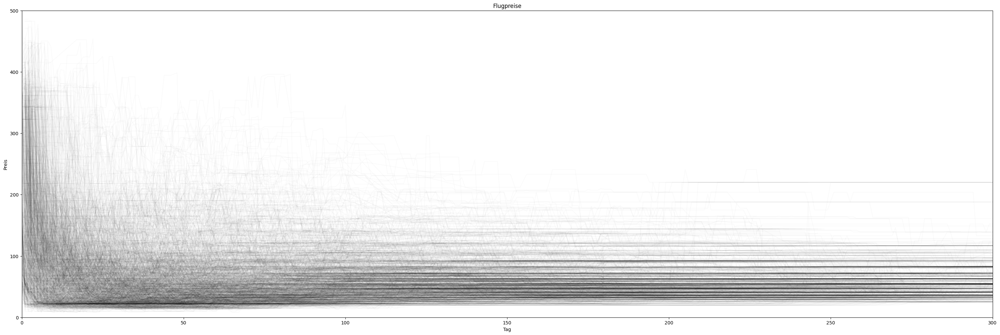

time: 7.12 s (started: 2023-08-02 10:34:07 +00:00)


In [ ]:
fig, ax = plt.subplots(figsize=(30, 10), layout='constrained')
for flight in flights_list:
  if ((flight.iloc[0]["flight_date"]>datetime(2022,1,1)) & (flight.iloc[0]["flight_date"]<datetime(2023,5,1))):
    ax.plot(flight["day"], flight["price"], alpha=0.02,  color='k')
ax.set_xlabel('Tag')  # Add an x-label to the axes.
ax.set_ylabel('Preis')  # Add a y-label to the axes.
ax.set_title("Flugpreise")  # Add a title to the axes.
plt.xlim([0,300])
plt.ylim([0,500])
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(30, 10), layout='constrained')
for flight in flights_list:
  if ((flight.iloc[0]["flight_date"]>datetime(2022,1,1)) & (flight.iloc[0]["flight_date"]<datetime(2023,5,1))):
    if(flight["price"].min()<10):
      ax.plot(flight["day"], flight["price"], alpha=0.03,  color='k')
    elif(flight["price"].min()<15):
      ax.plot(flight["day"], flight["price"], alpha=0.03,  color='b')
    elif(flight["price"].min()<30):
      ax.plot(flight["day"], flight["price"], alpha=0.03,  color='g')
    elif(flight["price"].min()<50):
      ax.plot(flight["day"], flight["price"], alpha=0.03,  color='r')
    else:
      ax.plot(flight["day"], flight["price"], alpha=0.03,  color='c')
ax.set_xlabel('Tag')  # Add an x-label to the axes.
ax.set_ylabel('Preis')  # Add a y-label to the axes.
ax.set_title("Flugpreise")  # Add a title to the axes.
plt.xlim([0,100])
plt.ylim([0,200])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

Die Zeitreihen sind nach Farben codiert. Die Farben wurden nach dem Minimalen Flugpreis verteilt.

### 3.5.1 Analyse einiger Flüge

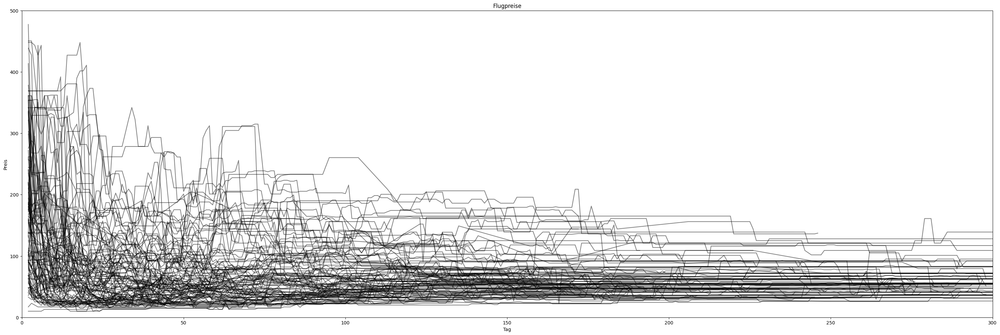

time: 5.47 s (started: 2023-08-02 10:34:24 +00:00)


In [ ]:
temp_flight_list = []
minimum = 2
for flight in flights_list:
  if ((flight.iloc[0]["flight_date"]>datetime(2022,1,1)) & (flight.iloc[0]["flight_date"]<datetime(2023,5,1))):
    if (flight["day"].min()==minimum):
      temp_flight_list.append(flight)

fig, ax = plt.subplots(figsize=(30, 10), layout='constrained')
for flight in temp_flight_list:
  ax.plot(flight["day"], flight["price"], alpha=0.5,  color='k')
ax.set_xlabel('Tag')  # Add an x-label to the axes.
ax.set_ylabel('Preis')  # Add a y-label to the axes.
ax.set_title("Flugpreise")  # Add a title to the axes.
plt.xlim([0,300])
plt.ylim([0,500])
plt.show()

Graphische Darstellung der Preisentwicklung von Flügen, die zwei Tage vor Abflug enden und die 2022 starteten

time: 5.48 s (started: 2023-08-02 10:34:24 +00:00)


time: 5.49 s (started: 2023-08-02 10:34:24 +00:00)


In [ ]:
'''%matplotlib inline
for flight in flights_list:
  fig, ax = plt.subplots(figsize=(30, 10), layout='constrained')
  ax.plot(flight["day"], flight["price"], color='k')
  ax.set_xlabel('Tag')  # Add an x-label to the axes.
  ax.set_ylabel('Preis')  # Add a y-label to the axes.
  ax.set_title("Flugpreise")  # Add a title to the axes.
  my_file = ""
  my_file =  str(flight["id"])+".png"
  plt.savefig(my_file)'''


'%matplotlib inline\nfor flight in flights_list:\n  fig, ax = plt.subplots(figsize=(30, 10), layout=\'constrained\')\n  ax.plot(flight["day"], flight["price"], color=\'k\')\n  ax.set_xlabel(\'Tag\')  # Add an x-label to the axes.\n  ax.set_ylabel(\'Preis\')  # Add a y-label to the axes.\n  ax.set_title("Flugpreise")  # Add a title to the axes.\n  my_file = ""\n  my_file =  str(flight["id"])+".png"\n  plt.savefig(my_file)'

time: 3.89 ms (started: 2023-08-02 10:34:29 +00:00)


Darstellung einiger zufällig ausgewählter Flüge:

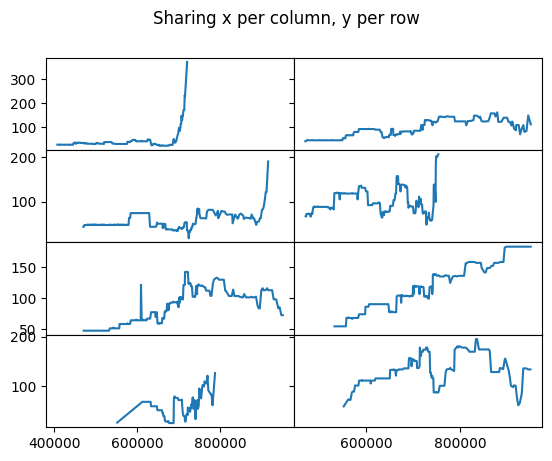

time: 1.35 s (started: 2023-08-02 10:34:29 +00:00)


In [ ]:
fig = plt.figure()
gs = fig.add_gridspec(4, 2, hspace=0, wspace=0)
(ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8) = gs.subplots(sharex='col', sharey='row')
fig.suptitle('Sharing x per column, y per row')
ax1.plot(flights_list[3000]["price"])
ax2.plot(flights_list[3210]["price"])
ax3.plot(flights_list[3200]["price"])
ax4.plot(flights_list[3300]["price"])
ax5.plot(flights_list[3400]["price"])
ax6.plot(flights_list[3500]["price"])
ax7.plot(flights_list[3600]["price"])
ax8.plot(flights_list[3701]["price"])

for ax in fig.get_axes():
    ax.label_outer()

Einige Zeitreihen

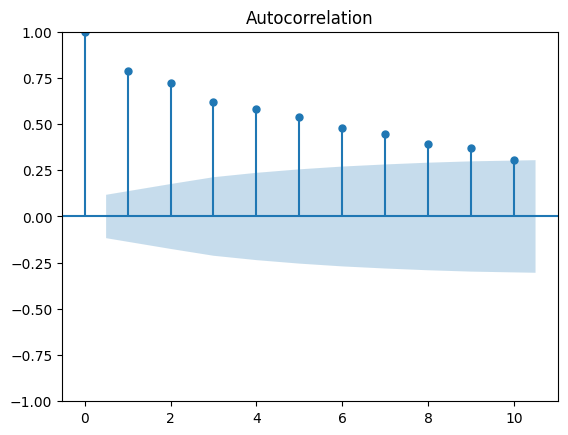

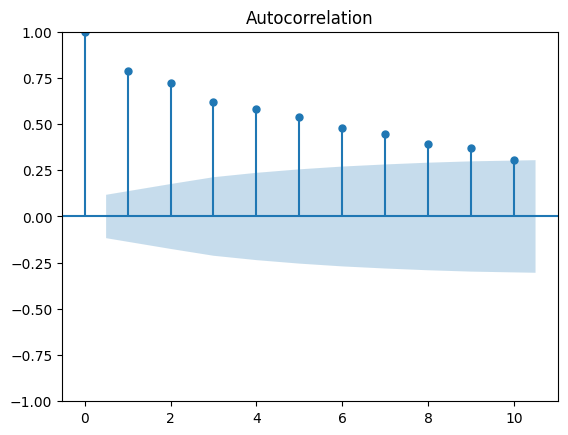

time: 490 ms (started: 2023-08-02 10:34:31 +00:00)


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(flights_list[3000]["price"], lags=10)

Die Flüge weisen eine starke Autokorrelation auf. Besonders das Lag 1 sticht bei dem PACF Plot heraus.

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


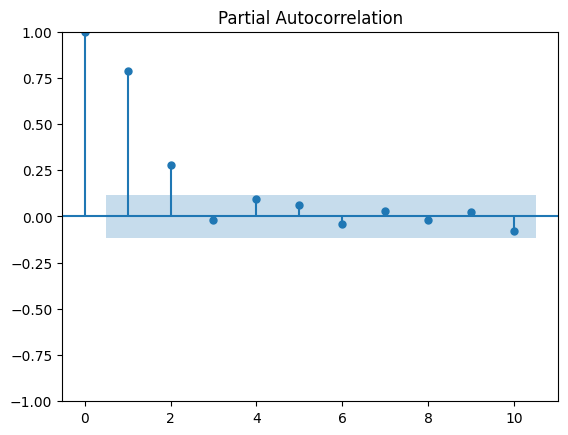

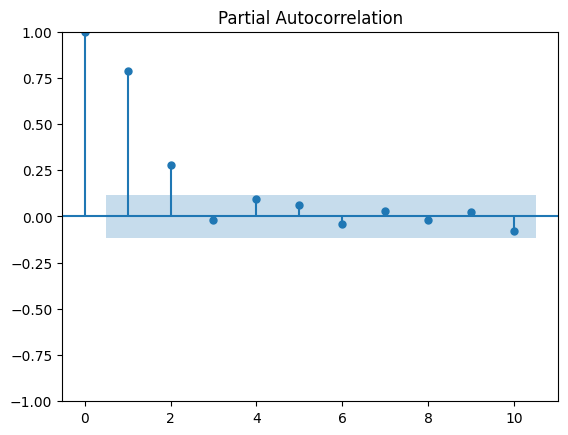

time: 470 ms (started: 2023-08-02 10:34:31 +00:00)


In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(flights_list[3000]["price"], lags=10)

In [ ]:
flights_list[100]["scrape_date"]

100      2021-01-03
1083     2021-01-04
2034     2021-01-05
3995     2021-01-08
4793     2021-01-09
            ...    
272761   2021-10-18
274126   2021-10-19
274935   2021-10-20
276612   2021-10-21
278296   2021-10-22
Name: scrape_date, Length: 259, dtype: datetime64[ns]

time: 7.61 ms (started: 2023-08-02 10:34:32 +00:00)


In [ ]:
flights_list[100].head(2)

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
100,80.99,2021-10-26,malaga,karlsruhe,2021-01-03,296,2021,4,10,43,1,6,299,53.593549,20211026100101,1100101.0
1083,80.99,2021-10-26,malaga,karlsruhe,2021-01-04,295,2021,4,10,43,1,0,299,53.593549,20211026100101,1100101.0


time: 20 ms (started: 2023-08-02 10:34:32 +00:00)


### 3.5.2 Plot all flights (noch nicht implementiert)

Bokeh Plot

In [ ]:
!pip install jupyter_bokeh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.1 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 62.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.4
    Uninstalling widgetsnbextension-3.6.4:
      Successfully uninstalled widgetsnbextension-3.6.4
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


time: 6.56 s (started: 2023-08-02 10:34:32 +00:00)


In [ ]:
all_dates

DatetimeIndex(['2021-01-04', '2021-01-05', '2021-01-06', '2021-01-07',
               '2021-01-08', '2021-01-11', '2021-01-12', '2021-01-13',
               '2021-01-14', '2021-01-15',
               ...
               '2023-06-01', '2023-06-02', '2023-06-05', '2023-06-06',
               '2023-06-07', '2023-06-08', '2023-06-09', '2023-06-12',
               '2023-06-13', '2023-06-14'],
              dtype='datetime64[ns]', length=638, freq='B')

time: 6.5 ms (started: 2023-08-02 10:34:38 +00:00)


In [ ]:
import warnings
warnings.filterwarnings(action='once')

time: 821 µs (started: 2023-08-02 10:34:38 +00:00)


In [ ]:
from bokeh.io.output import output_notebook
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, RangeTool
from bokeh.plotting import figure, show

dates = all_dates
#dates = np.array(flights_list[100]["scrape_date"], dtype=np.datetime64)
source = ColumnDataSource(data=dict(date=dates, price=flights_list[100]["price"]))

p = figure(height=300, width=800, tools="xpan", toolbar_location=None,
           x_axis_type="datetime", x_axis_location="above",
           background_fill_color="#efefef", x_range=(dates[0], dates[637]))

output_notebook()

p.line('date', 'price', source=source)
p.yaxis.axis_label = 'Price'

for flight in flights_list[100:111]:
  s = ColumnDataSource(data=dict(date=dates, price=flight["price"]))
  p.line('date', 'price', source=s)

select = figure(title="Drag the middle and edges of the selection box to change the range above",
                height=130, width=800, y_range=p.y_range,
                x_axis_type="datetime", y_axis_type=None,
                tools="", toolbar_location=None, background_fill_color="#efefef")

range_tool = RangeTool(x_range=p.x_range)
range_tool.overlay.fill_color = "navy"
range_tool.overlay.fill_alpha = 0.2

select.line('date', 'price', source=source)
select.ygrid.grid_line_color = None
select.add_tools(range_tool)

show(column(p, select))

<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen imp

time: 1.46 s (started: 2023-08-02 10:34:38 +00:00)


In [ ]:


from bokeh.plotting import figure, show

p = figure(width=1000, height=400)

for flight in flights_list[5000:5100]:
  p.line(flight['day'], flight['price'])

output_notebook()

show(p)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


time: 3.51 s (started: 2023-08-02 10:34:40 +00:00)


In [ ]:
flights_list[100].head(2)

,price,flight_date,departure_airport,arrival_airport,scrape_date,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection
100,80.99,2021-10-26,malaga,karlsruhe,2021-01-03,296,2021,4,10,43,1,6,299,53.593549,20211026100101,1100101.0
1083,80.99,2021-10-26,malaga,karlsruhe,2021-01-04,295,2021,4,10,43,1,0,299,53.593549,20211026100101,1100101.0


time: 19 ms (started: 2023-08-02 10:34:43 +00:00)


## 3.6 Erstellung einer Liste mit Zeitreihen aller Flüge

In [ ]:
flight_list = []
for flx in flights_list:
  if(len(flx)>1):
    flx.set_index('scrape_date', inplace=True)
    flx_lst = pd.date_range(start=flx.index.min(), end=flx.index.max()).difference(flx.index)
    row = flx.iloc[0]
    for date in flx_lst:
      row[0]=np.nan
      row[10] =  date.dayofweek
      row[12] = average.iloc[(int)(row[11])]
      flx.loc[date]=row
    flx.sort_index(inplace=True)
    flx["price"] = flx["price"].interpolate(method="linear")
    flight_list.append(flx)
    if(len(flight_list)%1000==0):
      print(len(flight_list))

1000
2000
3000
4000
5000
6000
7000
time: 15min (started: 2023-08-02 10:36:49 +00:00)


In [ ]:
flight_listx = []
len_list = []
for flx in flight_list:
  flx["target"] = flx["price"].shift(periods=-7)
  flx["target-perc"] = ((flx["target"]/flx["price"]) - 1)
  flx["diff-1"] = -flx["price"].diff(periods=1)
  flx["diff-7"] = -flx["price"].diff(periods=7)
  flx["t-1"]    = flx["price"].shift(periods=1)
  flx["t-2"]    = flx["price"].shift(periods=2)
  flx["t-3"]    = flx["price"].shift(periods=3)
  flx["t-4"]    = flx["price"].shift(periods=4)
  flx["t-5"]    = flx["price"].shift(periods=5)
  flx["t-6"]    = flx["price"].shift(periods=6)
  flx["t-7"]    = flx["price"].shift(periods=7)
  flx.dropna(inplace=True)
  if(len(flx)>0):
    flight_listx.append(flx)
    len_list.append(len(flx))
    if(len(flight_listx)%1000==0):
      print(len(flight_listx))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1000
2000
3000
4000
5000
6000
time: 1min 21s (started: 2023-08-02 10:51:50 +00:00)


In [ ]:
len(len_list)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


6779

time: 6.37 ms (started: 2023-08-02 10:53:11 +00:00)


6349 Flüge sind noch in dem Dataframe enthalten

(array([ 145.,  280.,  137.,   98.,  515.,  871., 1239.,    6.,   92.,
          55.,   71.,   24.,   33.,   16.,   13.,   14.,   50.,   45.,
          71.,   52.,   75.,   88.,  180.,   85.,   73.,  114.,   86.,
          89.,   76.,  246.,  158.,  113.,   96.,  121.,  140.,   92.,
          92.,   73.,  100.,   99.,   80.,   36.,  142.,   39.,   64.,
          58.,  120.,   88.,   64.,   65.]),
 array([  1.  ,   9.22,  17.44,  25.66,  33.88,  42.1 ,  50.32,  58.54,
         66.76,  74.98,  83.2 ,  91.42,  99.64, 107.86, 116.08, 124.3 ,
        132.52, 140.74, 148.96, 157.18, 165.4 , 173.62, 181.84, 190.06,
        198.28, 206.5 , 214.72, 222.94, 231.16, 239.38, 247.6 , 255.82,
        264.04, 272.26, 280.48, 288.7 , 296.92, 305.14, 313.36, 321.58,
        329.8 , 338.02, 346.24, 354.46, 362.68, 370.9 , 379.12, 387.34,
        395.56, 403.78, 412.  ]),
 <BarContainer object of 50 artists>)

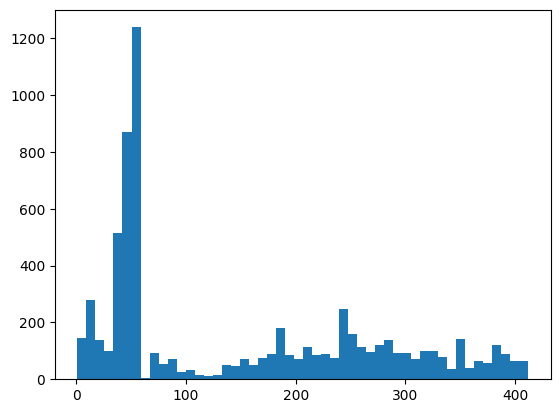

time: 525 ms (started: 2023-08-02 10:53:11 +00:00)


In [ ]:
plt.hist(len_list, bins=50)

Die meisten Flüge besitzen unter 100 Datenpunkten. Eine mögliche Erklärung liegt darin, dass ab dem 1.5. deutlich mehr Flugverbindungen miteinbezogen wurden und diese erst wenige Datenpunkte enthalten.

In [ ]:
df = pd.DataFrame()
for dframe in flight_listx:
  df = pd.concat([df, dframe])
df.sort_index(inplace=True)

time: 5min 54s (started: 2023-08-02 10:53:12 +00:00)


time: 5min 54s (started: 2023-08-02 10:53:12 +00:00)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.reset_index(inplace=True)
df

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7
0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.079390,2.5,2.50,33.99,33.99,33.99,33.990,33.99,33.99,33.99
1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.99,0.000000,-0.0,-0.00,116.99,116.99,116.99,116.990,116.99,116.99,116.99
2,2021-01-10,82.99,2021-07-04,edinburgh,malaga,182,2021,3,7,26,6,6,185,77.321627,20210704104100,1104100.0,70.99,-0.144596,-0.0,-0.00,82.99,82.99,82.99,82.990,82.99,82.99,82.99
3,2021-01-10,70.99,2021-07-05,edinburgh,malaga,183,2021,3,7,27,0,6,186,54.099296,20210705104100,1104100.0,70.99,0.000000,-0.0,-0.00,70.99,70.99,70.99,70.990,70.99,70.99,70.99
4,2021-01-10,82.99,2021-07-06,edinburgh,malaga,184,2021,3,7,27,1,6,187,67.078689,20210706104100,1104100.0,59.99,-0.277142,-0.0,-0.00,82.99,82.99,82.99,82.990,82.99,82.99,82.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017835,2023-06-23,51.37,2023-09-29,köln,manchester,98,2023,3,9,39,4,4,272,34.610882,20230929111103,1111103.0,37.73,-0.265525,-0.0,-15.15,51.37,51.37,51.37,46.575,41.78,41.78,36.22
1017836,2023-06-23,24.99,2023-09-28,köln,manchester,97,2023,3,9,39,3,4,271,45.092364,20230928111103,1111103.0,19.99,-0.200080,-1.0,-1.00,23.99,23.99,23.99,23.990,23.99,23.99,23.99
1017837,2023-06-23,58.99,2024-01-16,memmingen,malaga,207,2024,1,1,3,1,4,16,22.112226,20240116102100,1102100.0,58.99,0.000000,-0.0,-0.00,58.99,58.99,58.99,58.990,58.99,58.99,58.99
1017838,2023-06-23,23.99,2023-10-11,köln,manchester,110,2023,4,10,41,2,4,284,58.143084,20231011111103,1111103.0,23.99,0.000000,-0.0,5.98,23.99,23.99,23.99,25.990,27.99,27.99,29.97


time: 44.6 ms (started: 2023-08-02 10:59:07 +00:00)


In [ ]:
df[df["scrape_date"]<datetime(2023,1,4)]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7
0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.990000,-0.079390,2.5,2.50,33.99,33.99,33.99,33.99,33.990,33.99,33.99
1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.990000,0.000000,-0.0,-0.00,116.99,116.99,116.99,116.99,116.990,116.99,116.99
2,2021-01-10,82.99,2021-07-04,edinburgh,malaga,182,2021,3,7,26,6,6,185,77.321627,20210704104100,1104100.0,70.990000,-0.144596,-0.0,-0.00,82.99,82.99,82.99,82.99,82.990,82.99,82.99
3,2021-01-10,70.99,2021-07-05,edinburgh,malaga,183,2021,3,7,27,0,6,186,54.099296,20210705104100,1104100.0,70.990000,0.000000,-0.0,-0.00,70.99,70.99,70.99,70.99,70.990,70.99,70.99
4,2021-01-10,82.99,2021-07-06,edinburgh,malaga,184,2021,3,7,27,1,6,187,67.078689,20210706104100,1104100.0,59.990000,-0.277142,-0.0,-0.00,82.99,82.99,82.99,82.99,82.990,82.99,82.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
734923,2023-01-03,35.99,2023-02-20,edinburgh,malaga,48,2023,1,2,8,0,1,51,39.625976,20230220104100,1104100.0,25.990000,-0.277855,-2.0,-4.00,33.99,37.99,36.99,36.99,36.990,36.99,31.99
734924,2023-01-03,156.60,2023-07-09,edinburgh,malaga,187,2023,3,7,27,6,1,190,75.692274,20230709104100,1104100.0,89.990000,-0.425351,-0.0,-0.00,156.60,156.60,156.60,156.60,148.795,140.99,156.60
734925,2023-01-03,122.69,2023-08-16,neapel,malaga,225,2023,3,8,33,2,1,228,42.627149,20230816105100,1105100.0,122.056667,-0.005162,-1.0,-1.00,121.69,121.69,121.69,121.69,115.840,109.99,121.69
734926,2023-01-03,88.24,2023-09-06,edinburgh,malaga,246,2023,3,9,36,2,1,249,49.037000,20230906104100,1104100.0,87.406667,-0.009444,-0.0,0.75,88.24,88.24,88.99,88.99,88.990,88.99,88.99


time: 257 ms (started: 2023-08-02 10:59:07 +00:00)


In [ ]:
df[df["target-perc"]<-.5]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7
54,2021-01-10,135.99,2021-09-02,malaga,karlsruhe,242,2021,3,9,35,3,6,245,83.250196,20210902100101,1100101.0,45.12,-0.668211,-0.00,25.00,135.99,135.99,144.323333,152.656667,160.99,160.99,160.99
76,2021-01-10,68.99,2021-09-09,malaga,karlsruhe,249,2021,3,9,36,3,6,252,64.572900,20210909100101,1100101.0,30.72,-0.554718,-0.00,-0.00,68.99,68.99,68.990000,68.990000,68.99,68.99,68.99
299,2021-01-10,96.99,2021-06-15,malaga,karlsruhe,163,2021,2,6,24,1,6,166,47.752764,20210615100101,1100101.0,45.12,-0.534797,-0.00,18.00,96.99,96.99,102.990000,108.990000,114.99,114.99,114.99
433,2021-01-10,164.99,2021-09-06,malaga,memmingen,246,2021,3,9,36,0,6,249,49.037000,20210906100102,1100102.0,77.99,-0.527305,-0.00,28.00,164.99,164.99,178.990000,192.990000,192.99,192.99,192.99
436,2021-01-10,164.99,2021-09-13,malaga,memmingen,253,2021,3,9,37,0,6,256,37.351667,20210913100102,1100102.0,65.99,-0.600036,-0.00,59.00,164.99,164.99,194.490000,223.990000,223.99,223.99,223.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015602,2023-06-23,130.45,2023-08-22,malaga,memmingen,60,2023,3,8,34,1,4,234,74.559333,20230822100102,1100102.0,53.99,-0.586125,-0.00,-32.66,130.45,127.29,113.090000,98.040000,82.99,84.59,97.79
1015637,2023-06-23,95.79,2023-08-08,malaga,memmingen,46,2023,3,8,32,1,4,220,82.698963,20230808100102,1100102.0,47.84,-0.500574,-23.60,-47.55,72.19,74.29,55.940000,55.115000,54.29,55.94,48.24
1017745,2023-06-23,101.25,2023-07-03,malaga,dublin,10,2023,3,7,27,0,4,184,51.669186,20230703100109,1100109.0,48.59,-0.520099,-12.55,11.74,88.70,87.89,89.510000,103.410000,117.31,112.99,112.99
1017746,2023-06-23,138.43,2023-07-02,malaga,dublin,9,2023,3,7,26,6,4,183,72.601770,20230702100109,1100109.0,44.40,-0.679260,-0.00,-13.44,138.43,140.35,135.290000,126.300000,117.31,124.99,124.99


time: 50.5 ms (started: 2023-08-02 10:59:07 +00:00)


In [ ]:
profile = ProfileReport(df[df["scrape_date"]<datetime(2023,1,4)], title="Profiling Report")
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
df[df["day"]<6]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7


time: 25 ms (started: 2023-08-02 11:04:06 +00:00)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: xlabel='day'>

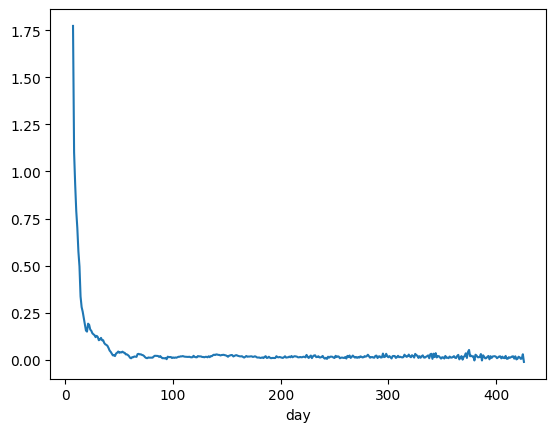

time: 459 ms (started: 2023-08-02 11:04:06 +00:00)


In [ ]:
df.groupby("day")["target-perc"].mean().plot()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: title={'center': 'target-perc'}, xlabel='day'>

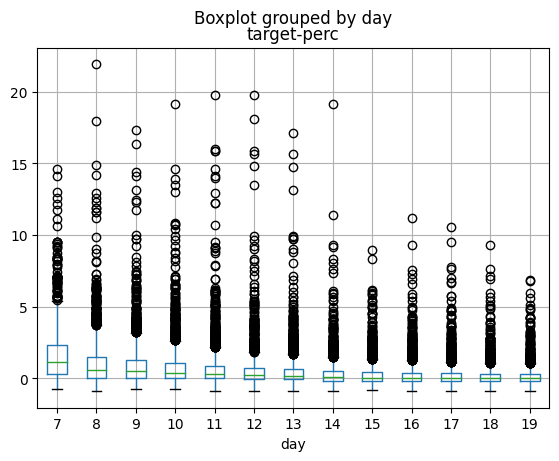

time: 725 ms (started: 2023-08-02 11:04:06 +00:00)


In [ ]:
df[df["day"]<20].boxplot('target-perc', by='day')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: title={'center': 'diff-1'}, xlabel='day'>

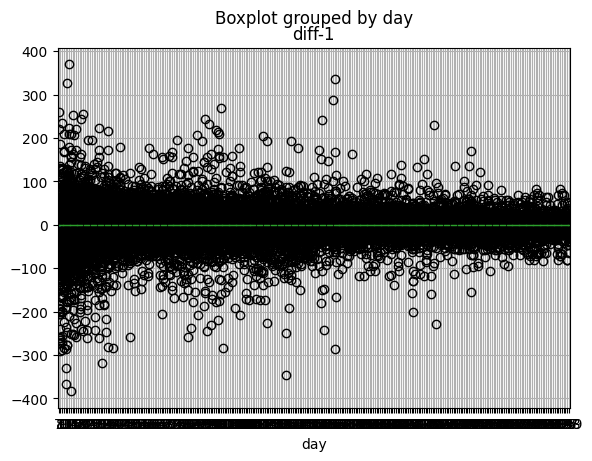

time: 10.9 s (started: 2023-08-02 11:04:07 +00:00)


In [ ]:
df[df["day"]<300].boxplot('diff-1', by='day')

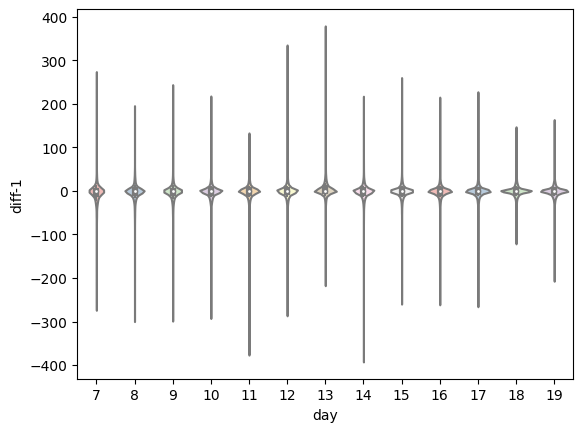

time: 729 ms (started: 2023-08-02 11:04:18 +00:00)


In [ ]:
sns.violinplot(x="day", y="diff-1",  data=df[df["day"]<20], palette="Pastel1")
plt.show()

In [ ]:
#df.to_parquet('dataframe.parquet.gzip', compression='gzip')

#df = pd.read_parquet('dataframe.parquet.gzip')

time: 449 µs (started: 2023-08-02 11:04:19 +00:00)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# 4. Training der Algorithmen

## 4.0 !!! Generierung der Training und Testdaten in einem gemeinsamen Dataframes !!!

In [104]:
df = pd.read_parquet('dataframe.parquet.gzip')

time: 884 ms (started: 2023-08-02 12:37:59 +00:00)


In [105]:
df.dtypes

scrape_date          datetime64[ns]
price                       float64
flight_date          datetime64[ns]
departure_airport            object
arrival_airport              object
day                           int64
fd_year                       int64
fd_quarter                    int64
fd_month                      int64
fd_week                       int64
fd_weekday                    int64
sc_weekday                    int64
fd_dayofyear                  int64
9dayavg                     float64
id                            int64
connection                  float64
target                      float64
target-perc                 float64
diff-1                      float64
diff-7                      float64
t-1                         float64
t-2                         float64
t-3                         float64
t-4                         float64
t-5                         float64
t-6                         float64
t-7                         float64
dtype: object

time: 6.38 ms (started: 2023-08-02 12:38:00 +00:00)


In [106]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import max_error
from sklearn.metrics import PredictionErrorDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import fbeta_score
from sklearn.metrics import make_scorer
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

time: 1.47 ms (started: 2023-08-02 12:38:00 +00:00)


In [107]:
ohe = OneHotEncoder()

transformed = ohe.fit_transform(df[["departure_airport"]])
ohe.categories_[0] = np.add(ohe.categories_[0], "_departure_airport")
df[ohe.categories_[0]] = transformed.toarray()
transformed = ohe.fit_transform(df[["arrival_airport"]])
ohe.categories_[0] = np.add(ohe.categories_[0], "_arrival_airport")
df[ohe.categories_[0]] = transformed.toarray()
transformed = ohe.fit_transform(df[["connection"]])
df[ohe.categories_[0]] = transformed.toarray()

time: 2.09 s (started: 2023-08-02 12:38:00 +00:00)


In [108]:
df.tail(20)

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0
1017820,2023-06-23,62.99,2023-10-17,köln,manchester,116,2023,4,10,42,1,4,290,66.556150,20231017111103,1111103.0,52.99,-0.158755,-0.0,-0.00,62.99,62.99,62.99,62.990,62.99,62.99,62.99,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017821,2023-06-23,84.13,2023-10-16,köln,manchester,115,2023,4,10,42,0,4,289,56.213106,20231016111103,1111103.0,98.56,0.171520,-0.0,-0.00,84.13,84.13,84.13,84.130,84.13,84.13,84.13,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017822,2023-06-23,27.73,2023-10-14,köln,manchester,113,2023,4,10,41,5,4,287,57.707500,20231014111103,1111103.0,32.34,0.166246,-0.0,4.61,27.73,27.73,32.34,32.340,32.34,32.34,32.34,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017823,2023-06-23,19.99,2023-10-13,köln,manchester,112,2023,4,10,41,4,4,286,45.919695,20231013111103,1111103.0,23.99,0.200100,-0.0,-3.00,19.99,16.99,16.99,16.990,16.99,16.99,16.99,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017824,2023-06-23,85.13,2023-09-25,köln,manchester,94,2023,3,9,39,0,4,268,34.932537,20230925111103,1111103.0,83.35,-0.020909,-1.0,-0.00,84.13,84.13,84.13,84.130,84.13,84.13,85.13,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017825,2023-06-23,27.99,2023-10-12,köln,manchester,111,2023,4,10,41,3,4,285,59.489416,20231012111103,1111103.0,27.99,0.000000,-0.0,-0.00,27.99,27.99,27.99,27.990,27.99,27.99,27.99,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017826,2023-06-23,51.95,2023-10-10,köln,manchester,109,2023,4,10,41,1,4,283,64.726949,20231010111103,1111103.0,60.55,0.165544,-0.0,-0.00,51.95,51.37,51.37,51.370,51.37,51.95,51.95,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017827,2023-06-23,71.83,2023-10-09,köln,manchester,108,2023,4,10,41,0,4,282,69.861471,20231009111103,1111103.0,52.53,-0.268690,-0.0,-10.65,71.83,71.83,71.83,66.505,61.18,61.18,61.18,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017828,2023-06-23,30.96,2023-10-07,köln,manchester,106,2023,4,10,40,5,4,280,52.742151,20231007111103,1111103.0,21.79,-0.296189,-0.0,-0.00,30.96,30.96,30.96,30.960,30.96,30.96,30.96,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.

time: 131 ms (started: 2023-08-02 12:38:02 +00:00)


In [109]:
df.columns = df.columns.astype(str)
df.columns

Index(['scrape_date', 'price', 'flight_date', 'departure_airport',
       'arrival_airport', 'day', 'fd_year', 'fd_quarter', 'fd_month',
       'fd_week', 'fd_weekday', 'sc_weekday', 'fd_dayofyear', '9dayavg', 'id',
       'connection', 'target', 'target-perc', 'diff-1', 'diff-7', 't-1', 't-2',
       't-3', 't-4', 't-5', 't-6', 't-7', 'bremen_departure_airport',
       'bristol_departure_airport', 'dublin_departure_airport',
       'edinburgh_departure_airport', 'karlsruhe_departure_airport',
       'köln_departure_airport', 'malaga_departure_airport',
       'malta_departure_airport', 'manchester_departure_airport',
       'memmingen_departure_airport', 'neapel_departure_airport',
       'warschau_departure_airport', 'bremen_arrival_airport',
       'bristol_arrival_airport', 'dublin_arrival_airport',
       'edinburgh_arrival_airport', 'karlsruhe_arrival_airport',
       'köln_arrival_airport', 'malaga_arrival_airport',
       'malta_arrival_airport', 'manchester_arrival_airport',
 

time: 8.11 ms (started: 2023-08-02 12:38:02 +00:00)


In [110]:
df.dtypes

scrape_date          datetime64[ns]
price                       float64
flight_date          datetime64[ns]
departure_airport            object
arrival_airport              object
                          ...      
1107100.0                   float64
1108101.0                   float64
1109100.0                   float64
1110100.0                   float64
1111103.0                   float64
Length: 68, dtype: object

time: 8.85 ms (started: 2023-08-02 12:38:02 +00:00)


## 4.1 Regression (nicht benutzt)

In [ ]:
df.head(2)

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0
0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.07939,2.5,2.5,33.99,33.99,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.99,0.00000,-0.0,-0.0,116.99,116.99,116.99,116.99,116.99,116.99,116.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 73.6 ms (started: 2023-08-02 11:51:28 +00:00)


In [ ]:
tscv = TimeSeriesSplit(n_splits=12)

for train_index, valid_index in tscv.split(df):
  train, valid = df.iloc[train_index], df.iloc[valid_index]

In [ ]:
train = df[df["scrape_date"]<datetime(2023,5,1)]
#valid = df[(df["scrape_date"]>datetime(2023,2,1)) & (df["scrape_date"]<datetime(2023,5,1))]
test = df[df["scrape_date"]>=datetime(2023,5,1)]


In [ ]:
# Wenn man nur die letzten Tage vor dem Abflug testen möchte:
#test = test[test["day"]<15]

### Anpassung der Trainings- und Testdaten

In [ ]:
used_columns = [                            'day',
                            'fd_year',                   'fd_quarter',
                           'fd_month',                      'fd_week',
                         'fd_weekday',                   'sc_weekday',
                       'fd_dayofyear',                      '9dayavg',
                                 'id',                   'connection',
                       'diff-1',
                             'diff-7', 't-1', 't-2', 't-3', 't-4',
       't-5', 't-6', 't-7',  'price',
           'bremen_departure_airport',    'bristol_departure_airport',
           'dublin_departure_airport',  'edinburgh_departure_airport',
        'karlsruhe_departure_airport',       'köln_departure_airport',
           'malaga_departure_airport',      'malta_departure_airport',
       'manchester_departure_airport',  'memmingen_departure_airport',
           'neapel_departure_airport',   'warschau_departure_airport',
             'bremen_arrival_airport',      'bristol_arrival_airport',
             'dublin_arrival_airport',    'edinburgh_arrival_airport',
          'karlsruhe_arrival_airport',         'köln_arrival_airport',
             'malaga_arrival_airport',        'malta_arrival_airport',
         'manchester_arrival_airport',    'memmingen_arrival_airport',
          '1100101.0', '1100102.0', '1100104.0',
       '1100107.0', '1100109.0', '1100110.0', '1101100.0', '1101108.0',
       '1102100.0', '1103100.0', '1103111.0', '1104100.0', '1105100.0',
       '1106100.0', '1107100.0', '1108101.0', '1109100.0', '1110100.0',
       '1111103.0']

time: 577 µs (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
X_train = train[used_columns]
X_valid = valid[used_columns]
X_test = test[used_columns]

time: 210 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
y_train = train["target"]
y_valid = valid["target"]
y_test  = test["target"]

time: 1.11 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
# Erstelle Dataframe mit Ergebnissen
results_reg = pd.DataFrame(columns=['Regression Model', 'RMSD', 'R2 Score'])

time: 8.42 ms (started: 2023-07-25 06:04:29 +00:00)


### Naive Lösung

In [ ]:
test

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0
855036,2023-05-01,78.99,2023-10-18,malaga,memmingen,170,2023,4,10,42,2,0,291,60.384136,20231018100102,1100102.0,67.99,-0.139258,-0.00,-2.60,78.99,87.24,81.470,75.700,75.70,77.39,76.39,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
855037,2023-05-01,91.57,2023-07-19,neapel,malaga,79,2023,3,7,29,2,0,200,56.609904,20230719105100,1105100.0,121.87,0.330894,10.84,13.68,102.41,104.40,103.405,102.410,101.41,101.41,105.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
855038,2023-05-01,144.77,2023-07-15,manchester,malaga,75,2023,3,7,28,5,0,196,93.753237,20230715103100,1103100.0,143.94,-0.005733,-1.00,-16.80,143.77,143.77,135.000,126.230,126.23,127.97,127.97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
855039,2023-05-01,102.28,2023-06-02,edinburgh,malaga,32,2023,2,6,22,4,0,153,62.661737,20230602104100,1104100.0,147.17,0.438893,-3.71,33.11,98.57,98.57,100.425,102.280,103.21,135.39,135.39,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
855040,2023-05-01,101.39,2023-10-14,malaga,memmingen,166,2023,4,10,41,5,0,287,57.707500,20231014100102,1100102.0,117.69,0.160765,-0.00,0.20,101.39,101.39,101.890,102.390,101.59,100.59,101.59,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017835,2023-06-23,51.37,2023-09-29,köln,manchester,98,2023,3,9,39,4,4,272,34.610882,20230929111103,1111103.0,37.73,-0.265525,-0.00,-15.15,51.37,51.37,51.370,46.575,41.78,41.78,36.22,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017836,2023-06-23,24.99,2023-09-28,köln,manchester,97,2023,3,9,39,3,4,271,45.092364,20230928111103,1111103.0,19.99,-0.200080,-1.00,-1.00,23.99,23.99,23.990,23.990,23.99,23.99,23.99,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1017837,2023-06-23,58.99,2024-01-16,memmingen,malaga,207,2024,1,1,3,1,4,16,22.112226,20240116102100,1102100.0,58.99,0.000000,-0.00,-0.00,58.99,58.99,58.990,58.990,58.99,58.99,58.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1

time: 125 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
mean_squared_error(test["price"], test["target"])**.5

23.738902826216197

time: 7.56 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
r2_score(test["price"], test["target"])

0.7810947534919259

time: 6.09 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
results_reg.loc[len(results_reg.index)] = ['Naive Lösung',
                                           mean_squared_error(test["price"], test["target"])**.5,
                                           r2_score(test["price"], test["target"])
                                           ]

time: 7.28 ms (started: 2023-07-25 06:04:29 +00:00)


### Entscheidungsbaum

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
from sklearn import tree


time: 336 ms (started: 2023-07-25 06:04:29 +00:00)


In [ ]:
tree_reg = DecisionTreeRegressor(max_depth=2)
tree_reg.fit(X_train,y_train).score(X_test, y_test)

0.49956505354964653

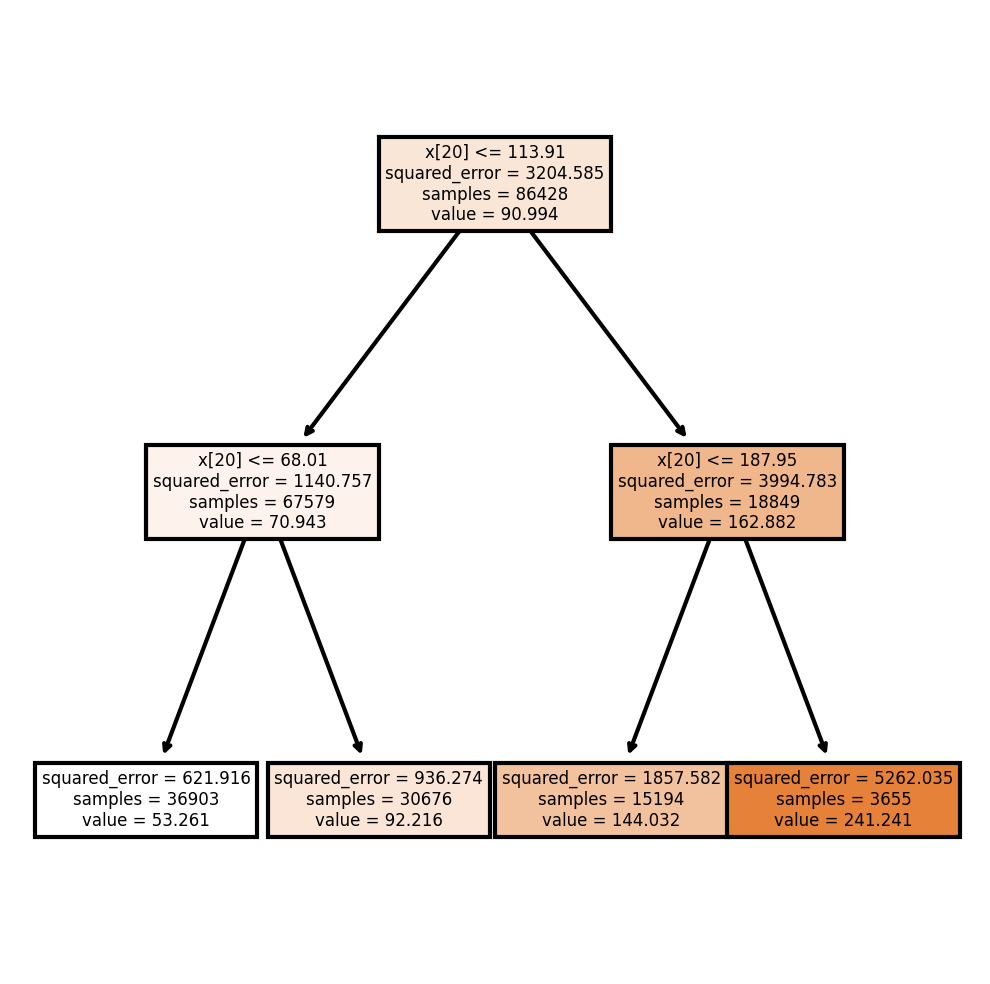

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(tree_reg,
               filled = True);

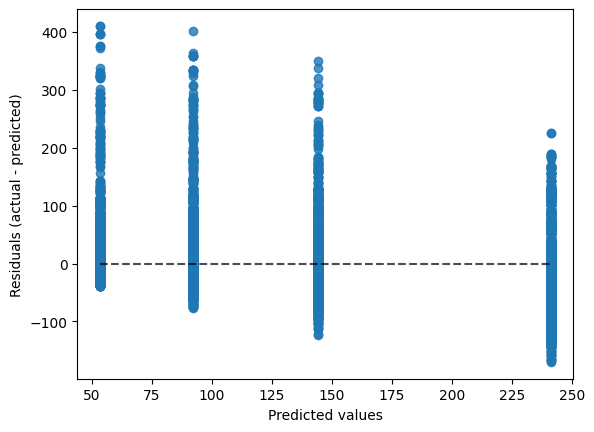

In [ ]:
# Anzeigen des PredictionErrorDisplay
y_pred = tree_reg.predict(X_test)
display = PredictionErrorDisplay(y_true=y_test, y_pred=y_pred)
display.plot()
plt.show()

In [ ]:
mean_squared_error(y_test, tree_reg.predict(X_test))**.5

46.368846346058255

In [ ]:
results_reg.loc[len(results_reg.index)] = ['Entscheidungsbaum',
                                           mean_squared_error(y_test, tree_reg.predict(X_test))**.5,
                                           tree_reg.score(X_test, y_test)
                                           ]

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
parameters = {"n_estimators":[30,50], "max_leaf_nodes": [4]}
rnd_reg = RandomForestRegressor(n_estimators=50, max_leaf_nodes=8, n_jobs=-1)
#gv_reg = GridSearchCV(rnd_reg, parameters)
rnd_reg.fit(X_train, y_train).score(X_test, y_test)

0.5742891324134212

In [ ]:
mean_squared_error(y_test, rnd_reg.predict(X_test))**.5

42.767104165783735

In [ ]:
results_reg.loc[len(results_reg.index)] = ['Random Forest',
                                           mean_squared_error(y_test, rnd_reg.predict(X_test))**.5,
                                           rnd_reg.score(X_test, y_test)
                                           ]

#### Feature Importance

In [ ]:
rnd_reg.feature_importances_

array([0.00717817, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.99282183, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        ])

### Adaboost

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor

In [ ]:
ada_reg = AdaBoostRegressor(
    DecisionTreeRegressor(max_depth=3),
    random_state=0,
    n_estimators=100,
    learning_rate = 0.5,
    loss = "square"
)
ada_reg.fit(X_train, y_train).score(X_test, y_test)

-2.008713276914948

In [ ]:
mean_squared_error(y_test, ada_reg.predict(X_test))**.5

113.69539560982916

In [ ]:
results_reg.loc[len(results_reg.index)] = ['Adaboost',
                                           mean_squared_error(y_test, ada_reg.predict(X_test))**.5,
                                           r2_score(y_test, ada_reg.predict(X_test))
                                           ]

### XGBoost

In [ ]:
import xgboost as xgb

In [ ]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train).score(X_test, y_test)

0.050595889353283297

In [ ]:
mean_squared_error(y_test, xgb_reg.predict(X_test))**.5

63.86722251567883

In [ ]:
np.stack((y_test, xgb_reg.predict(X_test)), axis=1)

array([[ 87.66      , 144.9281311 ],
       [ 89.49      ,  88.24402618],
       [147.99      , 180.46546936],
       ...,
       [257.35      , 391.50119019],
       [ 88.81      ,  88.18013763],
       [ 70.47      ,  70.68984222]])

In [ ]:
results_reg.loc[len(results_reg.index)] = ['XGBoost',
                                           mean_squared_error(y_test, xgb_reg.predict(X_test))**.5,
                                           r2_score(y_test, xgb_reg.predict(X_test))
                                           ]

### LightGBM

In [ ]:
import lightgbm as lgb

In [ ]:
gbm_reg = lgb.LGBMRegressor(num_leaves=16,
                        learning_rate=0.05,
                        n_estimators=20)
gbm_reg.fit(X_train, y_train,
        eval_set=[(X_test, y_test)],
        eval_metric='l1',
        callbacks=[lgb.early_stopping(5)]).score(X_test, y_test)

Training until validation scores don't improve for 5 rounds
Did not meet early stopping. Best iteration is:
[20]	valid_0's l1: 31.1855	valid_0's l2: 1974.64


0.5403979881109671

In [ ]:
mean_squared_error(y_test, gbm_reg.predict(X_test))**.5

44.43686749633026

In [ ]:
# predict
y_pred = gbm_reg.predict(X_test, num_iteration=gbm_reg.best_iteration_)
# eval
rmse_test = mean_squared_error(y_test, y_pred) ** 0.5
print(f'The RMSE of prediction is: {rmse_test}')

The RMSE of prediction is: 44.43686749633026


In [ ]:
# feature importances
print(f'Feature importances: {list(gbm_reg.feature_importances_)}')

Feature importances: [108, 0, 2, 3, 0, 0, 0, 17, 0, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0, 1, 161, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [ ]:
results_reg.loc[len(results_reg.index)] = ['LightGBM',
                                           mean_squared_error(y_test, gbm_reg.predict(X_test))**.5,
                                           gbm_reg.score(X_test, y_test)
                                           ]

### Stacking von allen Algorithmen

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
stacking_reg = StackingRegressor(
    estimators=[
        ('dt', DecisionTreeRegressor()),
        ('rf', RandomForestRegressor()),
        ('ada', AdaBoostRegressor()),
        ('xgb', xgb.XGBRegressor()),
        ('lgbm',lgb.LGBMRegressor()),
    ],
    final_estimator = RandomForestRegressor(n_estimators=10,
                                            random_state=42)
    )
stacking_reg.fit(X_train, y_train).score(X_test, y_test)

0.6210832243955547

In [ ]:
mean_squared_error(y_test, stacking_reg.predict(X_test))**.5

40.34010614635677

In [ ]:
results_reg.loc[len(results_reg.index)] = ['Stacking Ensemble',
                                           mean_squared_error(y_test, stacking_reg.predict(X_test))**.5,
                                           stacking_reg.score(X_test, y_test)
                                           ]

### Evaluierung

Preis ist der beste Predictor für den zukünftigen Preis. Der aktuelle Preis beinhaltet außerdem die Informationen, die auch die anderen Features liefern. Vielleicht performen die Algorithmen besser, wenn man nur die letzten Tage anschaut, an denen ja der Preis meistens steigt.

In [ ]:
# Ergebnisse mit normalen Testset
results_reg

,Regression Model,RMSD,R2 Score
0,Naive Lösung,22.628341,0.792039
1,Entscheidungsbaum,27.558766,0.718345
2,Random Forest,23.224659,0.799969
3,Adaboost,110.183251,-3.502252
4,XGBoost,34.793517,0.551053
5,LightGBM,27.852883,0.712301


In [ ]:
# Ergebnisse mit Testset (days<60)
results_reg

,Regression Model,RMSD,R2 Score
0,Naive Lösung,44.031756,0.436774
1,Entscheidungsbaum,46.368846,0.499565
2,Random Forest,42.767104,0.574289
3,Adaboost,113.695396,-2.008713
4,XGBoost,63.867223,0.050596
5,LightGBM,44.436867,0.540398


In [ ]:
# Ergebnisse mit Testset (days<15)
results_reg

,Regression Model,RMSD,R2 Score
0,Naive Lösung,86.477090,-0.354302
1,Entscheidungsbaum,86.254353,0.140019
2,Random Forest,81.345973,0.235110
3,Adaboost,118.470161,-0.622350
4,XGBoost,117.929596,-0.607579
5,LightGBM,79.136727,0.276093


## 4.2 !!! Klassifizierung !!!

In [111]:
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import StackingClassifier, VotingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

time: 1.05 ms (started: 2023-08-02 12:38:08 +00:00)


### !!! Vorbereitung der Daten !!!

Klassifizierung beruht auf der Target- Column "Buy". Wenn der Preis in 7 Tagen um mehr als 15 Euro oder 25% ansteigt, dann hätte gekauft werden müssen. Daher ein TRUE für Buy.

In [112]:
df.head(2)

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0
0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.07939,2.5,2.5,33.99,33.99,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.99,0.00000,-0.0,-0.0,116.99,116.99,116.99,116.99,116.99,116.99,116.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 73.2 ms (started: 2023-08-02 12:38:12 +00:00)


Ab dem 1.5.2023 wurden mehr Verbindungen aufgezeichnet. Diese sollten erst einmal dem Test - Set entnommen werden. Später werden dann diese Verbindungen seperat getestet um auf eine Generalisierbarkeit des Models schließen zu können.

In [113]:
df["buy"] = np.where(((df['target']-df['price']) > 15)&((((df['target']-df['price'])/df['price']) > 1.25)), True, False)

time: 30.1 ms (started: 2023-08-02 12:38:12 +00:00)


In [114]:
unique_train = set(pd.unique(df[df["scrape_date"]<"05.01.2023"]["connection"]))
unique_train

{1100101.0,
 1100102.0,
 1101100.0,
 1102100.0,
 1103100.0,
 1104100.0,
 1105100.0,
 1106100.0}

time: 799 ms (started: 2023-08-02 12:38:12 +00:00)


In [115]:
unique_test = set(pd.unique(df[df["scrape_date"]>="05.01.2023"]["connection"]))- unique_train
unique_test

{1100104.0,
 1100107.0,
 1100109.0,
 1100110.0,
 1101108.0,
 1103111.0,
 1107100.0,
 1108101.0,
 1109100.0,
 1110100.0,
 1111103.0}

time: 65 ms (started: 2023-08-02 12:38:13 +00:00)


In [116]:
test_2 = df[df["connection"].isin(unique_test)]


time: 1.22 s (started: 2023-08-02 12:38:13 +00:00)


In [117]:
# Ausschluss von Verbindungen, die im Testset, aber nicht im Trainingsset existieren
df = df[df["connection"].isin(unique_train)]

time: 1.13 s (started: 2023-08-02 12:38:14 +00:00)


In [118]:
#df["buy"] = np.where((df['target']-df['price']) > 10)

time: 403 µs (started: 2023-08-02 12:38:15 +00:00)


In [119]:
# Anzahl der True Values in "Buy"
df["buy"].values.sum()

7383

time: 5.26 ms (started: 2023-08-02 12:38:15 +00:00)


In [120]:
# Anzahl der False Values in "Buy"
(~df["buy"]).values.sum()

903567

time: 6.53 ms (started: 2023-08-02 12:38:15 +00:00)


In [121]:
df.head(2)

,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0,buy
0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.07939,2.5,2.5,33.99,33.99,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.99,0.00000,-0.0,-0.0,116.99,116.99,116.99,116.99,116.99,116.99,116.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False


time: 99 ms (started: 2023-08-02 12:38:15 +00:00)


In [122]:
df.columns

Index(['scrape_date', 'price', 'flight_date', 'departure_airport',
       'arrival_airport', 'day', 'fd_year', 'fd_quarter', 'fd_month',
       'fd_week', 'fd_weekday', 'sc_weekday', 'fd_dayofyear', '9dayavg', 'id',
       'connection', 'target', 'target-perc', 'diff-1', 'diff-7', 't-1', 't-2',
       't-3', 't-4', 't-5', 't-6', 't-7', 'bremen_departure_airport',
       'bristol_departure_airport', 'dublin_departure_airport',
       'edinburgh_departure_airport', 'karlsruhe_departure_airport',
       'köln_departure_airport', 'malaga_departure_airport',
       'malta_departure_airport', 'manchester_departure_airport',
       'memmingen_departure_airport', 'neapel_departure_airport',
       'warschau_departure_airport', 'bremen_arrival_airport',
       'bristol_arrival_airport', 'dublin_arrival_airport',
       'edinburgh_arrival_airport', 'karlsruhe_arrival_airport',
       'köln_arrival_airport', 'malaga_arrival_airport',
       'malta_arrival_airport', 'manchester_arrival_airport',
 

time: 6.71 ms (started: 2023-08-02 12:38:15 +00:00)


In [123]:
#test = test[test["day"]<8]

time: 411 µs (started: 2023-08-02 12:38:15 +00:00)


In [124]:
#train = df[df["scrape_date"]<datetime(2023,5,1)].sample(frac=0.25, replace=False, random_state=42)
train = df[df["scrape_date"]<datetime(2023,5,1)]
train.sort_values(by=["scrape_date"], inplace=True)
#valid = df[(df["scrape_date"]>=datetime(2023,2,1)) & (df["scrape_date"]<datetime(2023,5,1))]
train_full = df[df["scrape_date"]<datetime(2023,5,1)]
test = df[df["scrape_date"]>=datetime(2023,5,7)]

time: 1.07 s (started: 2023-08-02 12:38:15 +00:00)


In [125]:
train.reset_index(inplace=True)
train_full.reset_index(inplace=True)
test.reset_index(inplace=True)

time: 7.04 ms (started: 2023-08-02 12:38:17 +00:00)


In [126]:
train

,index,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0,buy
0,0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.079390,2.5,2.50,33.99,33.990,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,572,2021-01-10,44.99,2021-07-05,memmingen,malaga,183,2021,3,7,27,0,6,186,54.099296,20210705102100,1102100.0,24.42,-0.457213,-0.0,-9.00,44.99,44.990,40.49,35.99,35.99,35.99,35.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,573,2021-01-10,44.99,2021-07-09,memmingen,malaga,187,2021,3,7,27,4,6,190,75.692274,20210709102100,1102100.0,24.42,-0.457213,-0.0,-9.00,44.99,44.990,40.49,35.99,35.99,35.99,35.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,574,2021-01-10,44.99,2021-07-12,memmingen,malaga,190,2021,3,7,28,0,6,193,48.901739,20210712102100,1102100.0,24.42,-0.457213,-0.0,-9.00,44.99,44.990,40.49,35.99,35.99,35.99,35.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
4,575,2021-01-10,96.99,2021-10-04,memmingen,malaga,274,2021,4,10,40,0,6,277,52.107202,20211004102100,1102100.0,55.99,-0.422724,-0.0,-0.00,96.99,96.990,96.99,96.99,96.99,96.99,96.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
855031,854491,2023-04-30,32.99,2023-10-01,manchester,malaga,154,2023,4,10,39,6,6,274,67.905351,20231001103100,1103100.0,36.99,0.121249,-0.0,-1.00,32.99,32.490,31.99,31.99,31.99,31.99,31.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
855032,854492,2023-04-30,169.22,2023-07-29,manchester,malaga,90,2023,3,7,30,5,6,210,108.341489,20230729103100,1103100.0,166.94,-0.013474,-0.0,26.26,169.22,180.925,192.63,192.63,195.48,195.48,195.48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
855033,854493,2023-04-30,98.99,2023-12-31,manchester,malaga,245,2023,4,12,52,6,6,365,84.004603,20231231103100,1103100.0,64.99,-0.343469,-1.0,-1.00,97.99,97.990,97.99,97.99,97.99,97.99,97.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0

time: 109 ms (started: 2023-08-02 12:38:17 +00:00)


In [127]:
train_full

,index,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0,buy
0,0,2021-01-10,31.49,2021-03-30,malaga,karlsruhe,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,28.99,-0.079390,2.50,2.50,33.99,33.990,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,1,2021-01-10,116.99,2021-07-03,edinburgh,malaga,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,116.99,0.000000,-0.00,-0.00,116.99,116.990,116.99,116.99,116.99,116.99,116.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,2,2021-01-10,82.99,2021-07-04,edinburgh,malaga,182,2021,3,7,26,6,6,185,77.321627,20210704104100,1104100.0,70.99,-0.144596,-0.00,-0.00,82.99,82.990,82.99,82.99,82.99,82.99,82.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,3,2021-01-10,70.99,2021-07-05,edinburgh,malaga,183,2021,3,7,27,0,6,186,54.099296,20210705104100,1104100.0,70.99,0.000000,-0.00,-0.00,70.99,70.990,70.99,70.99,70.99,70.99,70.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
4,4,2021-01-10,82.99,2021-07-06,edinburgh,malaga,184,2021,3,7,27,1,6,187,67.078689,20210706104100,1104100.0,59.99,-0.277142,-0.00,-0.00,82.99,82.990,82.99,82.99,82.99,82.99,82.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
855031,855031,2023-04-30,95.97,2023-09-20,edinburgh,malaga,143,2023,3,9,38,2,6,263,35.388391,20230920104100,1104100.0,96.96,0.010316,-3.98,-3.98,91.99,91.990,91.99,91.99,91.99,91.99,91.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
855032,855032,2023-04-30,122.99,2023-09-09,edinburgh,malaga,132,2023,3,9,36,5,6,252,64.572900,20230909104100,1104100.0,150.25,0.221644,1.00,6.88,123.99,123.490,122.99,122.99,123.99,128.87,129.87,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
855033,855033,2023-04-30,48.99,2023-09-11,manchester,malaga,134,2023,3,9,37,0,6,254,45.581031,20230911103100,1103100.0,42.99,-0.122474,-0.00,-0.00,48.99,48.990,48.99,48.99,48.99,48.99,48.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.

time: 125 ms (started: 2023-08-02 12:38:17 +00:00)


In [128]:
test

,index,scrape_date,price,flight_date,departure_airport,arrival_airport,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,target,target-perc,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport,1100101.0,1100102.0,1100104.0,1100107.0,1100109.0,1100110.0,1101100.0,1101108.0,1102100.0,1103100.0,1103111.0,1104100.0,1105100.0,1106100.0,1107100.0,1108101.0,1109100.0,1110100.0,1111103.0,buy
0,866242,2023-05-07,116.18,2023-06-07,edinburgh,malaga,31,2023,2,6,23,2,6,158,34.973365,20230607104100,1104100.0,154.58,0.330522,-5.56,-14.65,110.62,112.94,112.945,112.95,95.97,101.53,101.53,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,866244,2023-05-07,47.27,2023-11-30,manchester,malaga,207,2023,4,11,48,3,6,334,21.160583,20231130103100,1103100.0,47.27,0.000000,-0.00,-4.28,47.27,47.27,45.130,42.99,42.99,42.99,42.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,866245,2023-05-07,55.99,2023-12-14,manchester,malaga,221,2023,4,12,50,3,6,348,29.318803,20231214103100,1103100.0,55.99,0.000000,-0.00,5.66,55.99,55.99,55.990,55.99,61.65,61.65,61.65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,866248,2023-05-07,42.99,2023-11-21,manchester,malaga,198,2023,4,11,47,1,6,325,42.982590,20231121103100,1103100.0,42.99,0.000000,1.00,-0.00,43.99,43.99,43.490,42.99,42.99,43.99,42.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
4,866249,2023-05-07,76.46,2023-08-11,edinburgh,malaga,96,2023,3,8,32,4,6,223,109.979833,20230811104100,1104100.0,74.34,-0.027727,-0.00,-10.78,76.46,74.34,74.335,74.33,74.33,77.16,65.68,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51081,1017721,2023-06-23,58.99,2024-01-23,memmingen,malaga,214,2024,1,1,4,1,4,23,22.722500,20240123102100,1102100.0,58.99,0.000000,1.00,-0.00,59.99,58.99,58.990,58.99,58.99,58.99,58.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
51082,1017727,2023-06-23,78.99,2024-01-04,memmingen,malaga,195,2024,1,1,1,3,4,4,32.328553,20240104102100,1102100.0,78.99,0.000000,-0.00,-0.00,78.99,78.99,78.990,78.99,78.99,78.99,78.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,False
51083,1017747,2023-06-23,78.99,2024-01-07,memmingen,malaga,198,2024,1,1,1,6,4,7,76.567343,20240107102100,1102100.0,78.99,0.000000,-0.00,-0.00,78.99,78.99,78.990,78.99,78.99,78.99,78.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0

time: 114 ms (started: 2023-08-02 12:38:17 +00:00)


In [129]:
used_columns = [ 'price',  'day', 'fd_year', 'fd_quarter', 'fd_month',
       'fd_week', 'fd_weekday', 'sc_weekday', 'fd_dayofyear', '9dayavg',
        'id', 'connection', 'diff-1', 'diff-7', 't-1', 't-2',
       't-3', 't-4', 't-5', 't-6', 't-7', 'bremen_departure_airport',
       'bristol_departure_airport', 'dublin_departure_airport',
       'edinburgh_departure_airport', 'karlsruhe_departure_airport',
       'köln_departure_airport', 'malaga_departure_airport',
       'malta_departure_airport', 'manchester_departure_airport',
       'memmingen_departure_airport', 'neapel_departure_airport',
       'warschau_departure_airport', 'bremen_arrival_airport',
       'bristol_arrival_airport', 'dublin_arrival_airport',
       'edinburgh_arrival_airport', 'karlsruhe_arrival_airport',
       'köln_arrival_airport', 'malaga_arrival_airport',
       'malta_arrival_airport', 'manchester_arrival_airport',
       'memmingen_arrival_airport']

time: 951 µs (started: 2023-08-02 12:38:17 +00:00)


In [130]:
X_train = train[used_columns]
X_train_full = train_full[used_columns]
#X_valid = valid[used_columns]
X_test = test[used_columns]
X_test_2 = test_2[used_columns]

time: 825 ms (started: 2023-08-02 12:38:17 +00:00)


In [131]:
y_train = train["buy"]
y_train_full = train_full["buy"]
#y_valid = valid["buy"]
y_test  = test["buy"]
y_test_2  = test_2["buy"]

time: 1.51 ms (started: 2023-08-02 12:38:19 +00:00)


In [132]:
# Anzahl der True Values in "Buy"
y_test.values.sum()

263

time: 4.17 ms (started: 2023-08-02 12:38:19 +00:00)


In [133]:
# Anzahl der False Values in "Buy"
(~y_test).values.sum()

50823

time: 5.66 ms (started: 2023-08-02 12:38:20 +00:00)


In [165]:
# Erstelle Dataframe mit Ergebnissen
results_clf = pd.DataFrame(columns=['Classifier',
                                    'Precision',
                                    'Recall',
                                    'F1-Score',
                                    'Matthews Correlation',
                                    'F0.5-Score_train',
                                    'F0.5-Score_test',
                                    'F0.5-Score_opti',
                                    'Accuracy'
                                    ])

time: 14.5 ms (started: 2023-08-02 12:55:15 +00:00)


In [166]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy


time: 13.7 ms (started: 2023-08-02 12:55:16 +00:00)


Die Modelle werden nach Precision, Recall und F1- Score bewertet. Zuerst werden aber die Klassifizierungsergebnisse in einer Confusion- Matrix dargestellt.

Precision: tp / (tp + fp)

Wie oft ist "buy == TRUE " die falsche Prognose?

auch: positive Vorhersagewert, Relevanz, Wirksamkeit, Genauigkeit, positiver prädiktiver Wert, positive predictive value

Recall: tp / (tp + fn)

Wie oft prognostizieren wir mit "buy == TRUE" den Preisanstieg?

 auch: Richtig-positiv-Rate, Empfindlichkeit, Trefferquote, sensitivity, true positive rate, recall oder hit rate

F1- Score: 2 * (precision * recall) / (precision + recall)

 harmonic mean of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0

 auch: F-Maß

F-beta

Metrik um verschiedene Modele bezüglich der Hyperparameteroptimierung zu vergleichen. Fbeta Score mit Beta = 0,5

In [136]:
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)

time: 571 µs (started: 2023-08-02 12:38:24 +00:00)


Erstellung des Trainings- und Validierungsset für die Hyperparameteroptimierung. Zwischen den Sets gibt es eine Lücke von 15000 Instanzen (ungefähr zwei Wochen).

In [137]:
tscv = TimeSeriesSplit(n_splits=3, test_size=30000, gap=8000)
all_splits = list(tscv.split(X_train, y_train))
all_splits

[(array([     0,      1,      2, ..., 757033, 757034, 757035]),
  array([765036, 765037, 765038, ..., 795033, 795034, 795035])),
 (array([     0,      1,      2, ..., 787033, 787034, 787035]),
  array([795036, 795037, 795038, ..., 825033, 825034, 825035])),
 (array([     0,      1,      2, ..., 817033, 817034, 817035]),
  array([825036, 825037, 825038, ..., 855033, 855034, 855035]))]

time: 7.8 ms (started: 2023-08-02 12:38:25 +00:00)


In [138]:
X_train.head(3)

,price,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport
0,31.49,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,2.5,2.5,33.99,33.99,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,44.99,183,2021,3,7,27,0,6,186,54.099296,20210705102100,1102100.0,-0.0,-9.0,44.99,44.99,40.49,35.99,35.99,35.99,35.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,44.99,187,2021,3,7,27,4,6,190,75.692274,20210709102100,1102100.0,-0.0,-9.0,44.99,44.99,40.49,35.99,35.99,35.99,35.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


time: 60.1 ms (started: 2023-08-02 12:38:27 +00:00)


#### Analysis of training set, test set, test set 2

In [139]:
X_train_full

,price,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport
0,31.49,86,2021,1,3,13,1,6,89,55.578308,20210330100101,1100101.0,2.50,2.50,33.99,33.990,33.99,33.99,33.99,33.99,33.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,116.99,181,2021,3,7,26,5,6,184,51.669186,20210703104100,1104100.0,-0.00,-0.00,116.99,116.990,116.99,116.99,116.99,116.99,116.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,82.99,182,2021,3,7,26,6,6,185,77.321627,20210704104100,1104100.0,-0.00,-0.00,82.99,82.990,82.99,82.99,82.99,82.99,82.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,70.99,183,2021,3,7,27,0,6,186,54.099296,20210705104100,1104100.0,-0.00,-0.00,70.99,70.990,70.99,70.99,70.99,70.99,70.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,82.99,184,2021,3,7,27,1,6,187,67.078689,20210706104100,1104100.0,-0.00,-0.00,82.99,82.990,82.99,82.99,82.99,82.99,82.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
855031,95.97,143,2023,3,9,38,2,6,263,35.388391,20230920104100,1104100.0,-3.98,-3.98,91.99,91.990,91.99,91.99,91.99,91.99,91.99,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
855032,122.99,132,2023,3,9,36,5,6,252,64.572900,20230909104100,1104100.0,1.00,6.88,123.99,123.490,122.99,122.99,123.99,128.87,129.87,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
855033,48.99,134,2023,3,9,37,0,6,254,45.581031,20230911103100,1103100.0,-0.00,-0.00,48.99,48.990,48.99,48.99,48.99,48.99,48.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
855034,42.99,397,2024,1,3,10,0,6,64,26.298500,20240304103100,1103100.0,-0.00,-0.00,42.99,42.990,42.99,42.99,42.99,42.99,42.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


time: 66.2 ms (started: 2023-08-02 12:38:27 +00:00)


In [140]:
profile = ProfileReport(X_train_full, title="Profiling Report Train set")
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

In [141]:
profile = ProfileReport(X_test, title="Profiling Report Test set")
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

In [142]:
profile = ProfileReport(X_test_2, title="Profiling Report Test set 2")
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

### Dummy- Classifier

In [167]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import precision_score, recall_score, f1_score

time: 625 µs (started: 2023-08-02 12:55:21 +00:00)


In [168]:
dummy_clf_most_freq = DummyClassifier(strategy="most_frequent")
dummy_clf_most_freq.fit(X_train, y_train)

DummyClassifier(strategy='most_frequent')

time: 38.2 ms (started: 2023-08-02 12:55:25 +00:00)


In [169]:
confusion_matrix(y_test, dummy_clf_most_freq.predict(X_test))

array([[50823,     0],
       [  263,     0]])

time: 22.9 ms (started: 2023-08-02 12:55:25 +00:00)


In [170]:
f"""Precision: {precision_score(y_test, dummy_clf_most_freq.predict(X_test))},
Recall: {recall_score(y_test, dummy_clf_most_freq.predict(X_test))},
F1-Score: {f1_score(y_test, dummy_clf_most_freq.predict(X_test))},
F0.5-Score: {fbeta_score(y_test, dummy_clf_most_freq.predict(X_test), beta=0.5)},
MCC: {matthews_corrcoef(y_test, dummy_clf_most_freq.predict(X_test))}"""

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


'Precision: 0.0,\nRecall: 0.0,\nF1-Score: 0.0,\nF0.5-Score: 0.0,\nMCC: 0.0'

time: 115 ms (started: 2023-08-02 12:55:25 +00:00)


In [171]:
results_clf.loc[len(results_clf.index)] = ['Dummy- Classifier 1',
                                           precision_score(y_test, dummy_clf_most_freq.predict(X_test)),
                                           recall_score(y_test, dummy_clf_most_freq.predict(X_test)),
                                           f1_score(y_test, dummy_clf_most_freq.predict(X_test)),
                                           matthews_corrcoef(y_test, dummy_clf_most_freq.predict(X_test)),
                                           fbeta_score(y_train_full, dummy_clf_most_freq.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, dummy_clf_most_freq.predict(X_test), beta=0.5),
                                           fbeta_score(y_test, dummy_clf_most_freq.predict(X_test), beta=0.5),
                                           accuracy_score(y_test, dummy_clf_most_freq.predict(X_test))
                                           ]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time: 370 ms (started: 2023-08-02 12:55:25 +00:00)


In [172]:
dummy_clf = DummyClassifier(strategy="stratified")
dummy_clf.fit(X_train,y_train)


DummyClassifier(strategy='stratified')

time: 42.7 ms (started: 2023-08-02 12:55:25 +00:00)


In [173]:
confusion_matrix(y_train, dummy_clf.predict(X_train))

array([[840870,   7097],
       [  7012,     57]])

time: 167 ms (started: 2023-08-02 12:55:25 +00:00)


In [174]:
confusion_matrix(y_test, dummy_clf.predict(X_test))

array([[50403,   420],
       [  263,     0]])

time: 25.3 ms (started: 2023-08-02 12:55:25 +00:00)


In [175]:
# Precision
f"Precision: {precision_score(y_test, dummy_clf.predict(X_test))}"

'Precision: 0.002325581395348837'

time: 41.1 ms (started: 2023-08-02 12:55:25 +00:00)


In [176]:
# Recall
f"Recall: {recall_score(y_test, dummy_clf.predict(X_test))}"

'Recall: 0.0076045627376425855'

time: 36.1 ms (started: 2023-08-02 12:55:26 +00:00)


In [177]:
# F1 Score
f"F1-Score: {f1_score(y_test, dummy_clf.predict(X_test))}"

'F1-Score: 0.006015037593984962'

time: 32 ms (started: 2023-08-02 12:55:26 +00:00)


In [178]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, dummy_clf.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.0024378352023403218'

time: 30.8 ms (started: 2023-08-02 12:55:26 +00:00)


In [179]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, dummy_clf.predict(X_test))}"

'MCC: -0.0007562257523838104'

time: 28 ms (started: 2023-08-02 12:55:26 +00:00)


In [180]:
results_clf.loc[len(results_clf.index)] = ['Dummy-Classifier-Stratified',
                                           precision_score(y_test, dummy_clf.predict(X_test)),
                                           recall_score(y_test, dummy_clf.predict(X_test)),
                                           f1_score(y_test, dummy_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, dummy_clf.predict(X_test)),
                                           fbeta_score(y_train_full, dummy_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, dummy_clf.predict(X_test), beta=0.5),
                                           fbeta_score(y_test, dummy_clf.predict(X_test), beta=0.5),
                                           accuracy_score(y_test, dummy_clf.predict(X_test))
                                           ]


time: 476 ms (started: 2023-08-02 12:55:26 +00:00)


In [181]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy
0,Dummy- Classifier 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy-Classifier-Stratified,0.007109,0.003802,0.008671,0.002282,0.008492,0.007784,0.002472,0.986258


time: 16.2 ms (started: 2023-08-02 12:55:26 +00:00)


### Entscheidungsbaum

In [182]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree

time: 641 µs (started: 2023-08-02 12:55:30 +00:00)


#### Optimierung der Hyperparameter

In [183]:
parameters = {'max_depth':(2,4,6),
              'min_samples_leaf':(10,200,1000)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42), parameters, cv = tscv, scoring = fbeta_scorer)

time: 994 µs (started: 2023-08-02 12:55:30 +00:00)


In [184]:
grid_search_dt.fit(X_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=8000, max_train_size=None, n_splits=3, test_size=30000),
             estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': (2, 4, 6),
                         'min_samples_leaf': (10, 200, 1000)},
             scoring=make_scorer(fbeta_score, beta=0.5))

time: 2min 40s (started: 2023-08-02 12:55:30 +00:00)


In [185]:
#grid_search_dt.cv_results_

time: 439 µs (started: 2023-08-02 12:58:10 +00:00)


In [186]:
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.016 {'max_depth': 2, 'min_samples_leaf': 10}
0.016 {'max_depth': 2, 'min_samples_leaf': 200}
0.0 {'max_depth': 2, 'min_samples_leaf': 1000}
0.135 {'max_depth': 4, 'min_samples_leaf': 10}
0.135 {'max_depth': 4, 'min_samples_leaf': 200}
0.035 {'max_depth': 4, 'min_samples_leaf': 1000}
0.18 {'max_depth': 6, 'min_samples_leaf': 10}
0.146 {'max_depth': 6, 'min_samples_leaf': 200}
0.035 {'max_depth': 6, 'min_samples_leaf': 1000}
time: 5.46 ms (started: 2023-08-02 12:58:10 +00:00)


In [187]:
grid_search_dt.best_estimator_

DecisionTreeClassifier(max_depth=6, min_samples_leaf=10, random_state=42)

time: 9.35 ms (started: 2023-08-02 12:58:10 +00:00)


In [188]:
parameters = {'max_depth':(range(3, 20))
             }
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42,
                                                      min_samples_leaf=15),
                              parameters,
                              cv = tscv,
                              scoring = fbeta_scorer)
grid_search_dt.fit(X_train, y_train)
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.07 {'max_depth': 3}
0.135 {'max_depth': 4}
0.167 {'max_depth': 5}
0.18 {'max_depth': 6}
0.236 {'max_depth': 7}
0.243 {'max_depth': 8}
0.265 {'max_depth': 9}
0.259 {'max_depth': 10}
0.274 {'max_depth': 11}
0.264 {'max_depth': 12}
0.255 {'max_depth': 13}
0.266 {'max_depth': 14}
0.262 {'max_depth': 15}
0.261 {'max_depth': 16}
0.265 {'max_depth': 17}
0.262 {'max_depth': 18}
0.249 {'max_depth': 19}
time: 12min 12s (started: 2023-08-02 12:58:10 +00:00)


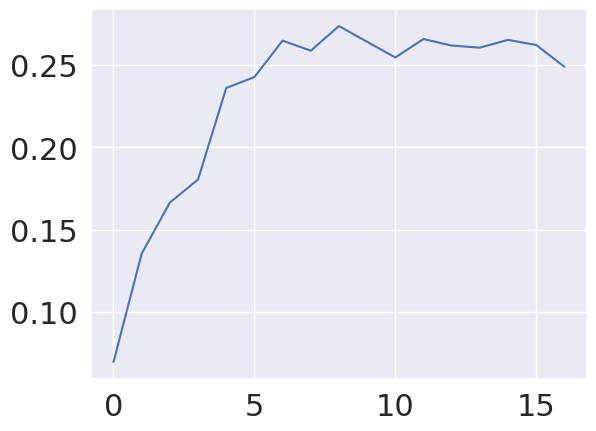

time: 257 ms (started: 2023-08-02 13:10:22 +00:00)


In [189]:
plt.plot(cvres['mean_test_score'])
plt.show()

max_depth bei 9 gut, bei 11 sehr gut

In [190]:
parameters = {'min_samples_leaf':(20,25,30,35,40,45,50,55,60,65,70,75)
             }
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42,
                                                     max_depth=11),
                              parameters,
                              cv = tscv,
                              scoring = fbeta_scorer)
grid_search_dt.fit(X_train, y_train)
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.27 {'min_samples_leaf': 20}
0.261 {'min_samples_leaf': 25}
0.258 {'min_samples_leaf': 30}
0.259 {'min_samples_leaf': 35}
0.233 {'min_samples_leaf': 40}
0.245 {'min_samples_leaf': 45}
0.268 {'min_samples_leaf': 50}
0.286 {'min_samples_leaf': 55}
0.286 {'min_samples_leaf': 60}
0.286 {'min_samples_leaf': 65}
0.275 {'min_samples_leaf': 70}
0.275 {'min_samples_leaf': 75}
time: 8min 48s (started: 2023-08-02 13:10:23 +00:00)


In [ ]:
plt.plot(cvres['mean_test_score'])
plt.show()

Maximalwert min_samples_leaf zwischen 55 und 65

In [ ]:
parameters = {'max_leaf_nodes':(range(40, 80, 3))
             }
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42,
                                                     #max_depth=11,
                                                     min_samples_leaf=60),
                              parameters,
                              cv = tscv,
                              scoring = fbeta_scorer)
grid_search_dt.fit(X_train, y_train)
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

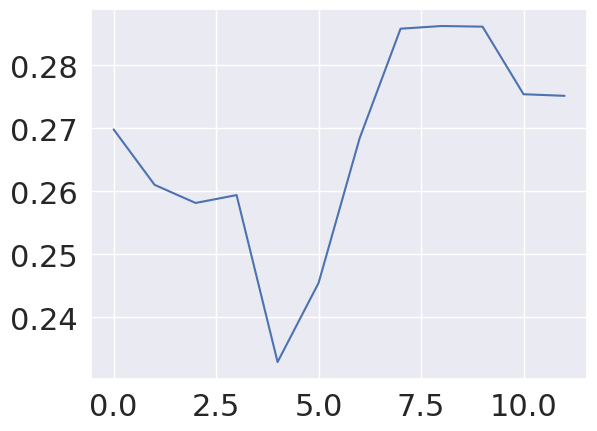

time: 268 ms (started: 2023-08-02 13:19:11 +00:00)


In [191]:
plt.plot(cvres['mean_test_score'])
plt.show()

In [ ]:
parameters = {'max_leaf_nodes':(50,2000),
              'max_depth':(9,11,15)
             }
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42,
                                                     min_samples_leaf=60),
                              parameters,
                              cv = tscv,
                              scoring = fbeta_scorer)
grid_search_dt.fit(X_train, y_train)
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

In [ ]:
parameters = {'max_depth':(6,7,8,9,10,11)
             }
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_dt = GridSearchCV(DecisionTreeClassifier(random_state = 42,
                                                      min_samples_leaf=60),
                              parameters,
                              cv = tscv,
                              scoring = fbeta_scorer)
grid_search_dt.fit(X_train, y_train)
cvres = grid_search_dt.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

#### Training des finalen Models

In [192]:
tree_clf = DecisionTreeClassifier(max_depth=8,
                                  min_samples_leaf=60)
tree_clf.fit(X_train_full,y_train_full).score(X_test, y_test)

0.9948518185021337

time: 11.6 s (started: 2023-08-02 13:19:11 +00:00)


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, tree_clf.predict(X_test))

In [ ]:
# Precision
f"Precision: {precision_score(y_test, tree_clf.predict(X_test))}"

In [193]:
# Recall
f"Recall: {recall_score(y_test, tree_clf.predict(X_test))}"

'Recall: 0.09885931558935361'

time: 47.6 ms (started: 2023-08-02 13:19:23 +00:00)


In [194]:
# F1 Score
f"F1-Score: {f1_score(y_test, tree_clf.predict(X_test))}"

'F1-Score: 0.16507936507936508'

time: 53.5 ms (started: 2023-08-02 13:19:23 +00:00)


In [195]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, tree_clf.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.2760084925690021'

time: 50.6 ms (started: 2023-08-02 13:19:23 +00:00)


In [196]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, tree_clf.predict(X_test))}"

'MCC: 0.22071960687736888'

time: 45.4 ms (started: 2023-08-02 13:19:23 +00:00)


In [197]:
precision, recall, thresholds = precision_recall_curve(y_test, tree_clf.predict_proba(X_test)[:,1])
f05_scores_dt = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
ix = np.argmax(f05_scores_dt)
print('Best threshold: ', thresholds[np.argmax(f05_scores_dt)])
print('Best F05-Score: ', np.max(f05_scores_dt))

Best threshold:  0.5
Best F05-Score:  0.28628495339547266
time: 38.9 ms (started: 2023-08-02 13:19:23 +00:00)


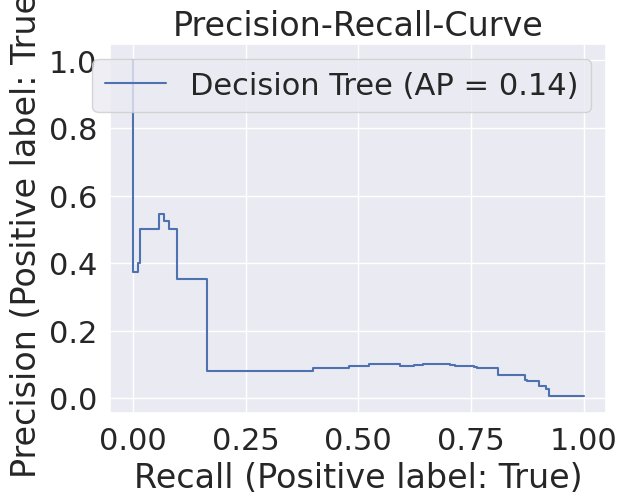

time: 596 ms (started: 2023-08-02 13:19:23 +00:00)


In [198]:
# Precision/ Recall Trade-Off
fig, ax = plt.subplots()
PrecisionRecallDisplay.from_estimator(
    tree_clf, X_test, y_test, name="Decision Tree", ax=ax)
ax.set_title("Precision-Recall-Curve")
plt.legend(loc='upper right')
plt.show()

In [199]:
from sklearn.tree import export_text
tree_rules = export_text(tree_clf, feature_names=list(X_train))
print(tree_rules)

|--- day <= 13.50
|   |--- day <= 8.50
|   |   |--- price <= 53.54
|   |   |   |--- day <= 7.50
|   |   |   |   |--- price <= 20.79
|   |   |   |   |   |--- id <= 20211220611072.00
|   |   |   |   |   |   |--- id <= 20210923864064.00
|   |   |   |   |   |   |   |--- class: True
|   |   |   |   |   |   |--- id >  20210923864064.00
|   |   |   |   |   |   |   |--- class: True
|   |   |   |   |   |--- id >  20211220611072.00
|   |   |   |   |   |   |--- class: True
|   |   |   |   |--- price >  20.79
|   |   |   |   |   |--- manchester_departure_airport <= 0.50
|   |   |   |   |   |   |--- class: True
|   |   |   |   |   |--- manchester_departure_airport >  0.50
|   |   |   |   |   |   |--- class: True
|   |   |   |--- day >  7.50
|   |   |   |   |--- 9dayavg <= 77.96
|   |   |   |   |   |--- id <= 20220113584128.00
|   |   |   |   |   |   |--- t-3 <= 14.39
|   |   |   |   |   |   |   |--- class: False
|   |   |   |   |   |   |--- t-3 >  14.39
|   |   |   |   |   |   |   |--- t-1 <= 18.57

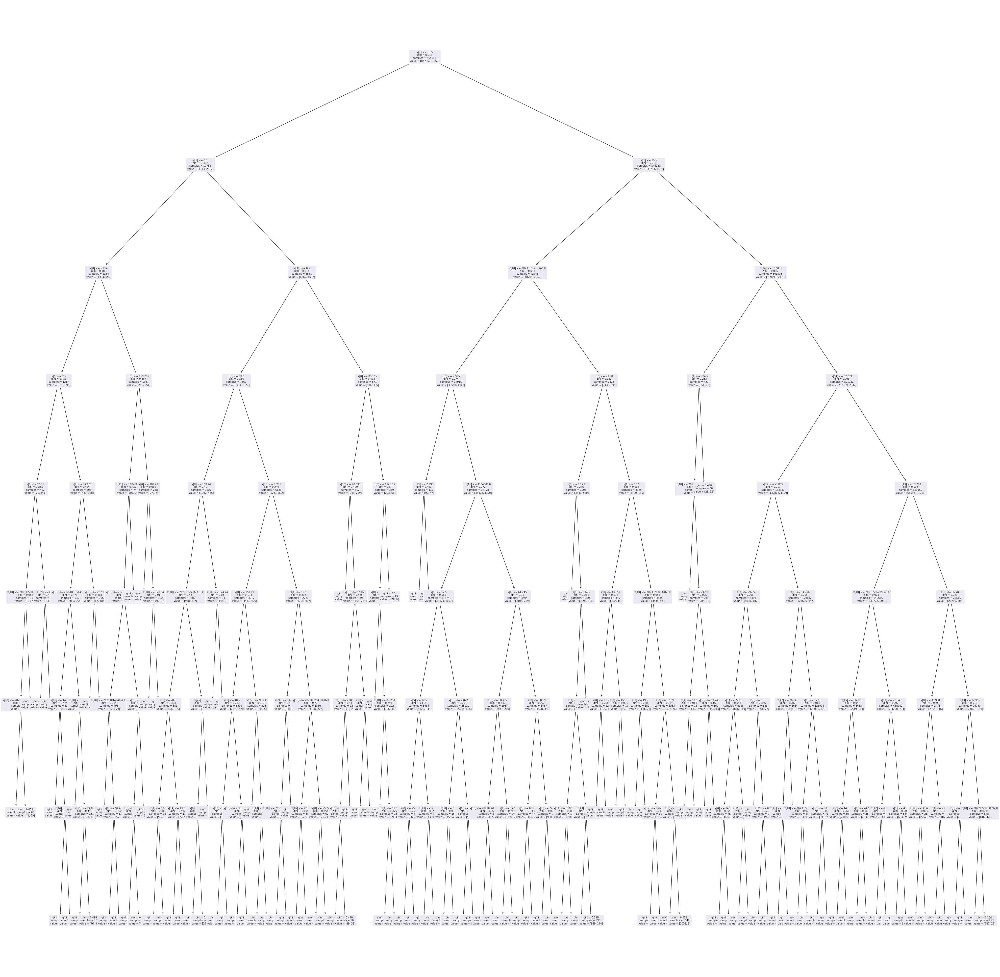

time: 11.3 s (started: 2023-08-02 13:19:24 +00:00)


In [200]:
# plot tree
plt.figure(figsize=(50,50))
tree.plot_tree(tree_clf, fontsize=7)
plt.show()

In [ ]:
np.round(tree_clf.feature_importances_,3)

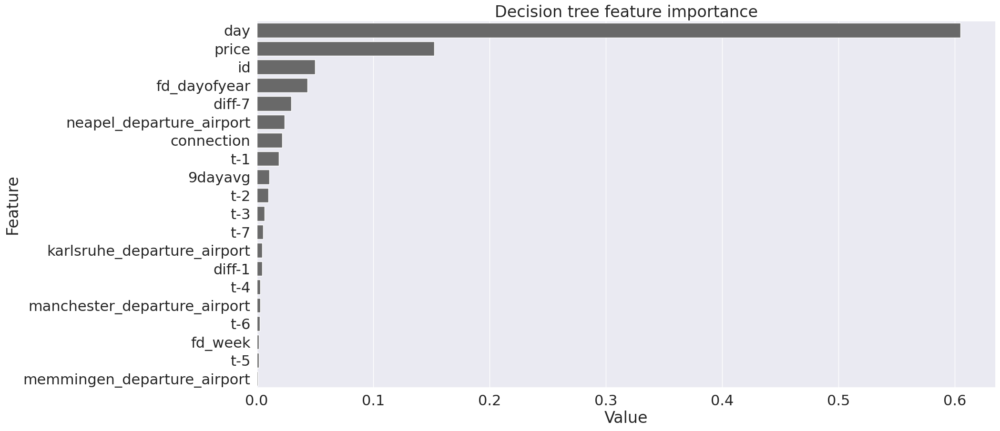

time: 1 s (started: 2023-08-02 13:19:36 +00:00)


In [201]:
feature_imp = pd.DataFrame(sorted(zip(tree_clf.feature_importances_, used_columns), reverse=True),
                           columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.set(font_scale=2)
sns.barplot(x="Value",
            y="Feature",
            data=feature_imp[feature_imp["Value"]>0].sort_values(by="Value", ascending=False),
            color="dimgray"
            )
plt.title('Decision tree feature importance')
plt.show()

In [202]:
results_clf.loc[len(results_clf.index)] = ['Decision Tree',
                                           precision_score(y_test, tree_clf.predict(X_test)),
                                           recall_score(y_test, tree_clf.predict(X_test)),
                                           f1_score(y_test, tree_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, tree_clf.predict(X_test)),
                                           fbeta_score(y_train_full, tree_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, tree_clf.predict(X_test), beta=0.5),
                                           np.max(f05_scores_dt),
                                           accuracy_score(y_test, tree_clf.predict(X_test))
                                           ]

time: 929 ms (started: 2023-08-02 13:19:38 +00:00)


In [203]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy
0,Dummy- Classifier 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy-Classifier-Stratified,0.007109,0.003802,0.008671,0.002282,0.008492,0.007784,0.002472,0.986258
2,Decision Tree,0.500000,0.098859,0.165079,0.220720,0.394971,0.276008,0.286285,0.994852


time: 29.8 ms (started: 2023-08-02 13:19:38 +00:00)


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#### Optimierung der Hyperparameter für Random Forest

1. Iteration: 3h min

In [ ]:
parameters = {"n_estimators":(1,3,5),
              "max_features":("sqrt",None)}
              #"max_depth":(3,5)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf = GridSearchCV(RandomForestClassifier(random_state = 42,max_depth=8), parameters, cv = tscv, scoring = fbeta_scorer)
grid_search_rf.fit(X_train, y_train)
cvres = grid_search_rf.cv_results_
for mean_score, params in zip(cvres['mean_test_score'], cvres['params']):
  print(mean_score, params)

0.028301520794537554 {'max_features': 'sqrt', 'n_estimators': 1}
0.06573860545823162 {'max_features': 'sqrt', 'n_estimators': 3}
0.022154266262671602 {'max_features': 'sqrt', 'n_estimators': 5}
0.19709894859709495 {'max_features': None, 'n_estimators': 1}
0.26705927422453324 {'max_features': None, 'n_estimators': 3}
0.274531556226495 {'max_features': None, 'n_estimators': 5}
time: 4min 36s (started: 2023-08-01 02:05:08 +00:00)


In [ ]:
#grid_search_rf.cv_results_

In [ ]:
grid_search_rf.best_estimator_

2. Iteration: 8 min

In [ ]:
parameters = {"n_estimators":(3,5,10,15,20,25,30)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      #max_depth=8,
                                                      max_features= "sqrt"
                                                      #min_samples_leaf=60
                                                      ),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.268 {'n_estimators': 3}
0.266 {'n_estimators': 5}
0.185 {'n_estimators': 10}
0.246 {'n_estimators': 15}
0.206 {'n_estimators': 20}
0.226 {'n_estimators': 25}
0.209 {'n_estimators': 30}
time: 15min 13s (started: 2023-07-15 07:01:39 +00:00)


In [ ]:
#grid_search_rf1.cv_results_

In [ ]:
parameters = {"n_estimators":(5,10,15,20,25,35,45,60,80,100)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_leaf_nodes=150
                                                      ),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.309 {'n_estimators': 5}
0.304 {'n_estimators': 10}
0.291 {'n_estimators': 15}
0.3 {'n_estimators': 20}
0.3 {'n_estimators': 25}
0.304 {'n_estimators': 35}
0.309 {'n_estimators': 45}
0.299 {'n_estimators': 60}
0.312 {'n_estimators': 80}
0.308 {'n_estimators': 100}
time: 2h 26min 36s (started: 2023-08-01 06:51:35 +00:00)


3. Iteration: 3 min

In [ ]:
parameters = {"n_estimators": (25,45,65)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_leaf_nodes=150,
                                                      max_depth=8,
                                                      class_weight=None),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.282 {'n_estimators': 25}
0.294 {'n_estimators': 45}
0.285 {'n_estimators': 65}
time: 52min 37s (started: 2023-07-16 01:16:52 +00:00)


In [ ]:
parameters = {"min_samples_leaf": (15,22,25,30,100)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      max_features= None,
                                                      max_depth=8,
                                                      max_leaf_nodes=150,
                                                      n_estimators=45,
                                                      class_weight=None),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.303 {'min_samples_leaf': 15}
0.294 {'min_samples_leaf': 22}
0.293 {'min_samples_leaf': 25}
0.276 {'min_samples_leaf': 30}
0.129 {'min_samples_leaf': 100}
time: 1h 23min 43s (started: 2023-07-30 14:47:49 +00:00)


4. Iteration: 7 min

In [ ]:
parameters = {"max_depth": (2,5,7,8,9,10,15,20)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_leaf_nodes=150,
                                                      n_estimators=45,
                                                      class_weight=None),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.011 {'max_depth': 2}
0.1 {'max_depth': 5}
0.241 {'max_depth': 7}
0.294 {'max_depth': 8}
0.294 {'max_depth': 9}
0.306 {'max_depth': 10}
0.31 {'max_depth': 15}
0.309 {'max_depth': 20}
time: 1h 48min 16s (started: 2023-07-30 16:11:33 +00:00)


In [ ]:
#grid_search_rf2.cv_results_

time: 521 µs (started: 2023-07-16 04:20:44 +00:00)


5.Iteration: 18 min

In [ ]:
parameters = {"max_leaf_nodes": (50,150,450)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_depth=8,
                                                      n_estimators=45,
                                                      class_weight=None),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.257 {'max_leaf_nodes': 50}
0.294 {'max_leaf_nodes': 150}
0.294 {'max_leaf_nodes': 450}
time: 38min 19s (started: 2023-07-16 16:12:12 +00:00)


6. Iteration: 13 min

In [ ]:
parameters = {"class_weight": ("balanced", None)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(random_state = 42,
                                                      n_estimators = 45,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_leaf_nodes=150,
                                                      max_depth=8),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.165 {'class_weight': 'balanced'}
0.294 {'class_weight': None}
time: 33min 35s (started: 2023-07-16 22:32:16 +00:00)


In [ ]:
parameters = {"random_state":(100,101,102,103,104,105,106,107)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_rf1 = GridSearchCV(RandomForestClassifier(n_estimators = 45,
                                                      max_features= None,
                                                      min_samples_leaf=22,
                                                      max_leaf_nodes=150
                                                      ),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_rf1.fit(X_train, y_train)
cvres = grid_search_rf1.cv_results_

score_lst1=[]
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  score_lst1.append(mean_score)
  print(mean_score, params)
print(np.average(score_lst1)) # average score
print(np.std(score_lst1))     # standard deviation of score

0.301 {'random_state': 100}
0.297 {'random_state': 101}
0.303 {'random_state': 102}
0.285 {'random_state': 103}
0.3 {'random_state': 104}
0.294 {'random_state': 105}
0.306 {'random_state': 106}
0.301 {'random_state': 107}
0.298375
0.006081478027585076
time: 2h 13min 38s (started: 2023-08-01 18:00:39 +00:00)


#### Training des finalen Models für Random Forest

In [204]:
rnd_clf = RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)
rnd_clf.fit(X_train_full, y_train_full).score(X_test, y_test)
f"F0.5-Score: {fbeta_score(y_test, rnd_clf.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.29411764705882354'

time: 8min 25s (started: 2023-08-02 13:19:39 +00:00)


In [205]:
print(fbeta_score(y_train_full, rnd_clf.predict(X_train_full), beta=0.5))

0.396009410124597
time: 4.19 s (started: 2023-08-02 13:28:04 +00:00)


In [206]:
np.round(rnd_clf.feature_importances_,2)

array([0.14, 0.56, 0.  , 0.  , 0.01, 0.01, 0.  , 0.  , 0.03, 0.01, 0.06,
       0.03, 0.01, 0.02, 0.02, 0.01, 0.01, 0.01, 0.01, 0.  , 0.01, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.02, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ])

time: 13.7 ms (started: 2023-08-02 13:28:09 +00:00)


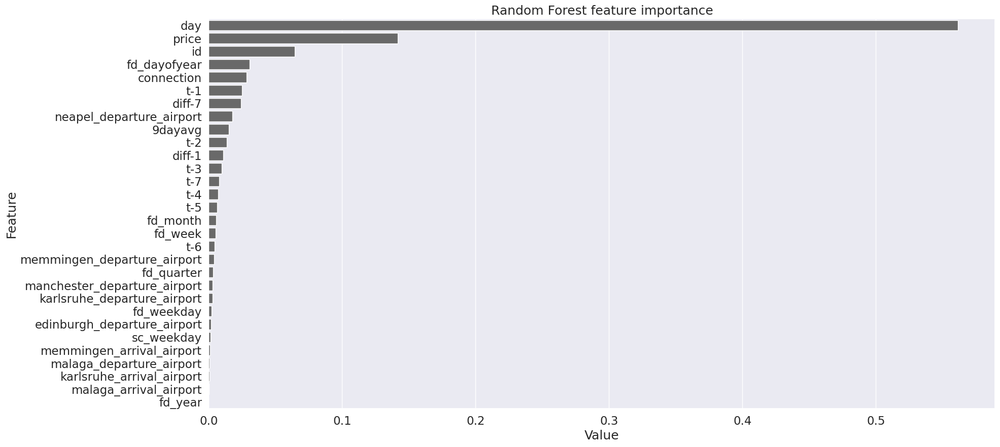

time: 710 ms (started: 2023-08-02 13:28:09 +00:00)


In [207]:
feature_imp = pd.DataFrame(sorted(zip(rnd_clf.feature_importances_, used_columns), reverse=True),
                           columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.set(font_scale=1.5)
sns.barplot(x="Value", y="Feature",
            data=feature_imp[feature_imp["Value"]>0].sort_values(by="Value", ascending=False),
            color="dimgray")
plt.title('Random Forest feature importance')
#plt.tight_layout()
plt.show()

In [208]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, rnd_clf.predict(X_test))

array([[50788,    35],
       [  232,    31]])

time: 256 ms (started: 2023-08-02 13:28:09 +00:00)


In [209]:
# Precision
f"Precision: {precision_score(y_test, rnd_clf.predict(X_test))}"

'Precision: 0.4696969696969697'

time: 234 ms (started: 2023-08-02 13:28:10 +00:00)


In [210]:
# Recall
f"Recall: {recall_score(y_test, rnd_clf.predict(X_test))}"

'Recall: 0.11787072243346007'

time: 200 ms (started: 2023-08-02 13:28:10 +00:00)


In [211]:
# F1 Score
f"F1-Score: {f1_score(y_test, rnd_clf.predict(X_test))}"

'F1-Score: 0.18844984802431608'

time: 196 ms (started: 2023-08-02 13:28:10 +00:00)


In [212]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, rnd_clf.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.29411764705882354'

time: 200 ms (started: 2023-08-02 13:28:10 +00:00)


In [213]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, rnd_clf.predict(X_test))}"

'MCC: 0.23346777713392086'

time: 202 ms (started: 2023-08-02 13:28:11 +00:00)


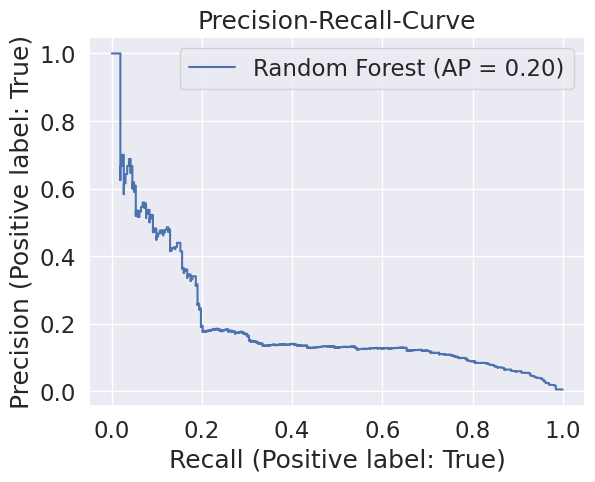

time: 550 ms (started: 2023-08-02 13:28:11 +00:00)


In [214]:
# Precision/ Recall Trade-Off
fig, ax = plt.subplots()
PrecisionRecallDisplay.from_estimator(
    rnd_clf, X_test, y_test, name="Random Forest", ax=ax)
ax.set_title("Precision-Recall-Curve")
plt.legend(loc='upper right')
plt.show()

In [215]:
precision, recall, thresholds = precision_recall_curve(y_test, rnd_clf.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
print('Best threshold: ', thresholds[np.argmax(f05_scores)])
print('Best F05-Score: ', np.max(f05_scores))

Best threshold:  0.4899656955390453
Best F05-Score:  0.31897926634768736
time: 196 ms (started: 2023-08-02 13:28:11 +00:00)


In [216]:
results_clf.loc[len(results_clf.index)] = ['Random Forest',
                                           precision_score(y_test, rnd_clf.predict(X_test)),
                                           recall_score(y_test, rnd_clf.predict(X_test)),
                                           f1_score(y_test, rnd_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, rnd_clf.predict(X_test)),
                                           fbeta_score(y_train_full, rnd_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, rnd_clf.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, rnd_clf.predict(X_test))
                                           ]

time: 4.23 s (started: 2023-08-02 13:28:12 +00:00)


In [217]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy
0,Dummy- Classifier 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy-Classifier-Stratified,0.007109,0.003802,0.008671,0.002282,0.008492,0.007784,0.002472,0.986258
2,Decision Tree,0.500000,0.098859,0.165079,0.220720,0.394971,0.276008,0.286285,0.994852
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.318979,0.994774


time: 16.1 ms (started: 2023-08-02 13:28:16 +00:00)


### Adaboost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

time: 352 µs (started: 2023-07-28 21:36:01 +00:00)


#### Optimierung der Hyperparameter für Adaboost


In [ ]:
parameters = {"n_estimators":(45,50,55,60)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_ada = GridSearchCV(AdaBoostClassifier(random_state = 42),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_ada.fit(X_train, y_train)

cvres = grid_search_ada.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.266 {'n_estimators': 45}
0.27 {'n_estimators': 50}
0.277 {'n_estimators': 55}
0.275 {'n_estimators': 60}
time: 14min 15s (started: 2023-07-28 21:36:03 +00:00)


In [ ]:
parameters = {"learning_rate":(0.3,0.6,0.7,0.8,0.9,1)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_ada = GridSearchCV(AdaBoostClassifier(random_state = 42,
                                                  n_estimators=50),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_ada.fit(X_train, y_train)

cvres = grid_search_ada.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.043 {'learning_rate': 0.3}
0.238 {'learning_rate': 0.6}
0.256 {'learning_rate': 0.7}
0.266 {'learning_rate': 0.8}
0.268 {'learning_rate': 0.9}
0.27 {'learning_rate': 1}
time: 19min 14s (started: 2023-07-28 21:50:19 +00:00)


In [ ]:
parameters = {"estimator":(DecisionTreeClassifier(max_depth=1),
                           DecisionTreeClassifier(max_depth=2),
                           DecisionTreeClassifier(max_depth=3),
                           DecisionTreeClassifier(max_depth=4))}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_ada = GridSearchCV(AdaBoostClassifier(random_state = 42,
                                                  n_estimators=50,
                                                  learning_rate=1),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_ada.fit(X_train, y_train)

cvres = grid_search_ada.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.27 {'estimator': DecisionTreeClassifier(max_depth=1)}
0.302 {'estimator': DecisionTreeClassifier(max_depth=2)}
0.256 {'estimator': DecisionTreeClassifier(max_depth=3)}
0.249 {'estimator': DecisionTreeClassifier(max_depth=4)}
time: 28min 57s (started: 2023-07-28 22:09:33 +00:00)


In [ ]:
parameters = {"random_state":(100,101,102,103,104,105,106,107)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)

grid_search_ada = GridSearchCV(AdaBoostClassifier(DecisionTreeClassifier(max_depth = 2),
                                                  learning_rate = 1,
                                                  n_estimators=50),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_ada.fit(X_train, y_train)

cvres = grid_search_ada.cv_results_
score_lst2=[]
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  score_lst2.append(mean_score)
  print(mean_score, params)
print(np.average(score_lst2)) # average score
print(np.std(score_lst2))     # standard deviation of score

0.302 {'random_state': 100}
0.302 {'random_state': 101}
0.302 {'random_state': 102}
0.302 {'random_state': 103}
0.302 {'random_state': 104}
0.302 {'random_state': 105}
0.302 {'random_state': 106}
0.302 {'random_state': 107}
0.302
0.0
time: 1h 2min 3s (started: 2023-08-01 20:17:20 +00:00)


#### Training des finalen Models für Adaboost

In [218]:
ada_clf = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth = 2),
    random_state = 42,
    n_estimators = 60,
    learning_rate = 1
)
ada_clf.fit(X_train_full, y_train_full).score(X_test, y_test)

0.9922483655013116

time: 4min 32s (started: 2023-08-02 13:28:16 +00:00)


In [219]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, ada_clf.predict(X_test))

array([[50623,   200],
       [  196,    67]])

time: 614 ms (started: 2023-08-02 13:32:48 +00:00)


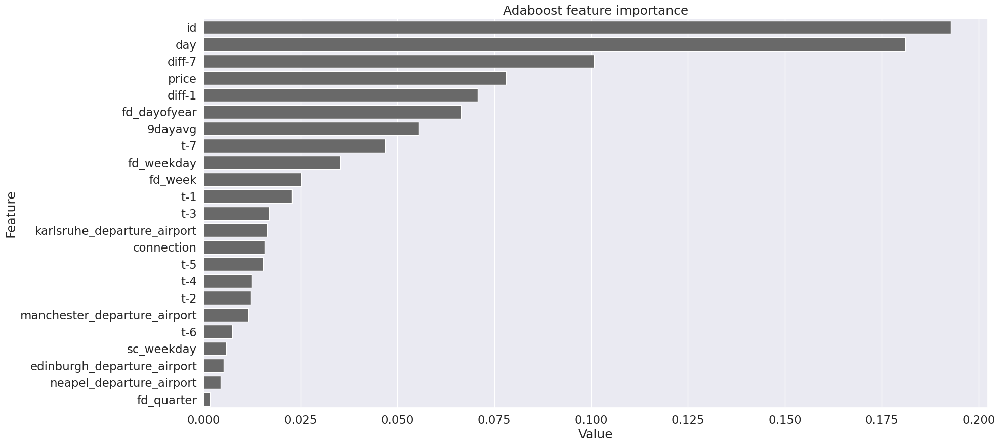

time: 686 ms (started: 2023-08-02 13:32:49 +00:00)


In [220]:
feature_imp = pd.DataFrame(sorted(zip(ada_clf.feature_importances_, used_columns), reverse=True),
                           columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.set(font_scale=1.5)
sns.barplot(x="Value", y="Feature",
            data=feature_imp[feature_imp["Value"]>0].sort_values(by="Value", ascending=False),
            color="dimgray")
plt.title('Adaboost feature importance')
#plt.tight_layout()
plt.show()

In [221]:
# Precision
f"Precision: {precision_score(y_test, ada_clf.predict(X_test))}"

'Precision: 0.250936329588015'

time: 689 ms (started: 2023-08-02 13:32:49 +00:00)


In [222]:
# Recall
f"Recall: {recall_score(y_test, ada_clf.predict(X_test))}"

'Recall: 0.25475285171102663'

time: 643 ms (started: 2023-08-02 13:32:50 +00:00)


In [223]:
# F1 Score
f"F1-Score: {f1_score(y_test, ada_clf.predict(X_test))}"

'F1-Score: 0.2528301886792453'

time: 722 ms (started: 2023-08-02 13:32:51 +00:00)


In [224]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, ada_clf.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.2516904583020286'

time: 658 ms (started: 2023-08-02 13:32:51 +00:00)


In [225]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, ada_clf.predict(X_test))}"

'MCC: 0.24894154857696946'

time: 641 ms (started: 2023-08-02 13:32:52 +00:00)


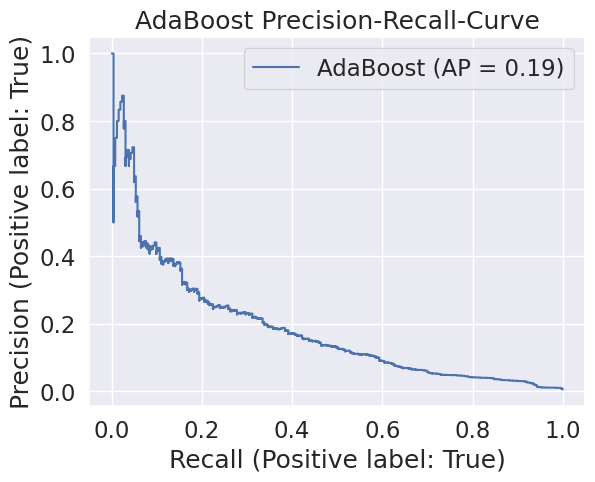

time: 1.01 s (started: 2023-08-02 13:32:53 +00:00)


In [226]:
# Precision/ Recall Trade-Off
fig, ax = plt.subplots()
PrecisionRecallDisplay.from_estimator(
    ada_clf, X_test, y_test, name="AdaBoost", ax=ax)
ax.set_title("AdaBoost Precision-Recall-Curve")
plt.legend(loc='upper right')
plt.show()

In [227]:
precision, recall, thresholds = precision_recall_curve(y_test, ada_clf.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
print('Best threshold: ', thresholds[np.argmax(f05_scores)])
print('Best F05-Score: ', np.max(f05_scores))

Best threshold:  0.5038789291088988
Best F05-Score:  0.29282576866764276
time: 790 ms (started: 2023-08-02 13:32:54 +00:00)


In [228]:
results_clf.loc[len(results_clf.index)] = ['Adaboost',
                                           precision_score(y_test, ada_clf.predict(X_test)),
                                           recall_score(y_test, ada_clf.predict(X_test)),
                                           f1_score(y_test, ada_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, ada_clf.predict(X_test)),
                                           fbeta_score(y_train_full, ada_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, ada_clf.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, ada_clf.predict(X_test))
                                           ]

time: 16.3 s (started: 2023-08-02 13:32:55 +00:00)


In [229]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy
0,Dummy- Classifier 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy-Classifier-Stratified,0.007109,0.003802,0.008671,0.002282,0.008492,0.007784,0.002472,0.986258
2,Decision Tree,0.500000,0.098859,0.165079,0.220720,0.394971,0.276008,0.286285,0.994852
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.318979,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.292826,0.992248


time: 20.3 ms (started: 2023-08-02 13:33:11 +00:00)


### XGBoost

In [ ]:
import xgboost as xgb

#### Optimierung der Hyperparameter für XGBoost

1. Iteration: 12min

In [ ]:
parameters = {"n_estimators":(20,50,100),
              "scale_pos_weight":(5, 10)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_xgb = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                 eval_metric = "auc"),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb.fit(X_train, y_train)

cvres = grid_search_xgb.cv_results_
for mean_score, params in zip(cvres['mean_test_score'], cvres['params']):
  print(mean_score, params)

0.23705492304246967 {'n_estimators': 20, 'scale_pos_weight': 5}
0.17532632747744348 {'n_estimators': 20, 'scale_pos_weight': 10}
0.264562766022278 {'n_estimators': 50, 'scale_pos_weight': 5}
0.20118305006352086 {'n_estimators': 50, 'scale_pos_weight': 10}
0.2654101762573926 {'n_estimators': 100, 'scale_pos_weight': 5}
0.2136304052141628 {'n_estimators': 100, 'scale_pos_weight': 10}
time: 25min 37s (started: 2023-07-28 22:41:23 +00:00)


In [ ]:
scale_pos_weight = (~y_test).values.sum()/y_test.values.sum()
scale_pos_weight

193.24334600760457

time: 4.26 ms (started: 2023-07-28 23:07:01 +00:00)


2. Iteration: 7 min

In [ ]:
parameters = {"eta":(0.2,0.3, 0.4,0.5)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eval_metric = "auc",
                                                  scale_pos_weight=scale_pos_weight,
                                                  n_estimators= 50),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.136 {'eta': 0.2}
0.154 {'eta': 0.3}
0.154 {'eta': 0.4}
0.17 {'eta': 0.5}
time: 14min 25s (started: 2023-07-28 23:07:01 +00:00)


3. Iteration: 12 min

In [ ]:
parameters = {"max_depth":(5,7,9,10,11)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eval_metric = "aucpr",
                                                  scale_pos_weight=scale_pos_weight,
                                                  n_estimators= 70,
                                                  eta = 0.4),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.131 {'max_depth': 5}
0.238 {'max_depth': 7}
0.293 {'max_depth': 9}
0.302 {'max_depth': 10}
0.314 {'max_depth': 11}
time: 37min 53s (started: 2023-07-28 23:21:26 +00:00)


In [ ]:
parameters = {"max_depth":(11,13,15)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eval_metric = "aucpr",
                                                  scale_pos_weight=scale_pos_weight,
                                                  n_estimators= 70,
                                                  eta = 0.4),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.314 {'max_depth': 11}
0.337 {'max_depth': 13}
0.334 {'max_depth': 15}
time: 38min 57s (started: 2023-07-28 23:59:19 +00:00)


4. Iteration: 23 min

In [ ]:
parameters = {"eval_metric":("rmse","mae", "aucpr","auc")}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_test).values.sum()/y_test.values.sum()
grid_search_xgb2 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eta = 0.4,
                                                  scale_pos_weight=scale_pos_weight,
                                                  max_depth=10,
                                                  n_estimators= 100),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb2.fit(X_train, y_train)

cvres = grid_search_xgb2.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.332 {'eval_metric': 'rmse'}
0.332 {'eval_metric': 'mae'}
0.332 {'eval_metric': 'aucpr'}
0.332 {'eval_metric': 'auc'}
time: 51min 25s (started: 2023-07-29 00:38:17 +00:00)


5. Iteration

In [ ]:
parameters = {"n_estimators":(30, 40, 50, 60, 70, 80)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eta = 0.4,
                                                  scale_pos_weight=scale_pos_weight,
                                                  max_depth=9,
                                                  eval_metric= "aucpr"),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.243 {'n_estimators': 30}
0.258 {'n_estimators': 40}
0.272 {'n_estimators': 50}
0.282 {'n_estimators': 60}
0.293 {'n_estimators': 70}
0.293 {'n_estimators': 80}
time: 38min 25s (started: 2023-07-29 01:29:43 +00:00)


In [ ]:
parameters = {"scale_pos_weight":(1,2,3,4,5,6,7,8,9,10)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  eta = 0.4,
                                                  n_estimators=50,
                                                  max_depth=8,
                                                  eval_metric= "aucpr"),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  print(mean_score, params)

0.303 {'scale_pos_weight': 1}
0.315 {'scale_pos_weight': 2}
0.298 {'scale_pos_weight': 3}
0.305 {'scale_pos_weight': 4}
0.245 {'scale_pos_weight': 5}
0.248 {'scale_pos_weight': 6}
0.288 {'scale_pos_weight': 7}
0.293 {'scale_pos_weight': 8}
0.27 {'scale_pos_weight': 9}
0.241 {'scale_pos_weight': 10}
time: 46min 35s (started: 2023-07-29 02:08:08 +00:00)


In [ ]:
parameters = {"random_state":(100,101,102,103,104,105,106,107)}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
scale_pos_weight = (~y_train).values.sum()/y_train.values.sum()
grid_search_xgb1 = GridSearchCV(xgb.XGBClassifier(random_state = 42,
                                                  scale_pos_weight=2,
                                                  eta = 0.4,
                                                  n_estimators=50,
                                                  max_depth=8,
                                                  eval_metric= "aucpr"),
                               parameters,
                               cv = tscv,
                               scoring = fbeta_scorer)
grid_search_xgb1.fit(X_train, y_train)

cvres = grid_search_xgb1.cv_results_
score_lst3=[]
for mean_score, params in zip(cvres['mean_test_score'].round(3), cvres['params']):
  score_lst3.append(mean_score)
  print(mean_score, params)
print(np.average(score_lst3)) # average score
print(np.std(score_lst3))     # standard deviation of score

0.315 {'random_state': 100}
0.315 {'random_state': 101}
0.315 {'random_state': 102}
0.315 {'random_state': 103}
0.315 {'random_state': 104}
0.315 {'random_state': 105}
0.315 {'random_state': 106}
0.315 {'random_state': 107}
0.315
0.0
time: 1h 8min 10s (started: 2023-08-01 16:52:28 +00:00)


#### Training des finalen Models für XGBoost

(random_state = 42,
eval_metric = "aucpr",
scale_pos_weight=scale_pos_weight,
n_estimators= 50,
eta= 0.4,
max_depth = 8)


In [230]:
scale_pos_weight = (~y_train_full).values.sum()/y_train_full.values.sum()

xgb_clf = xgb.XGBClassifier(random_state = 42,
                            eval_metric = "aucpr",
                            scale_pos_weight=2,
                            n_estimators= 70,
                            eta= 0.4,
                            max_depth = 10)
xgb_clf.fit(X_train_full, y_train_full).score(X_test, y_test)

0.9917002701327173

time: 6min 1s (started: 2023-08-02 13:33:11 +00:00)


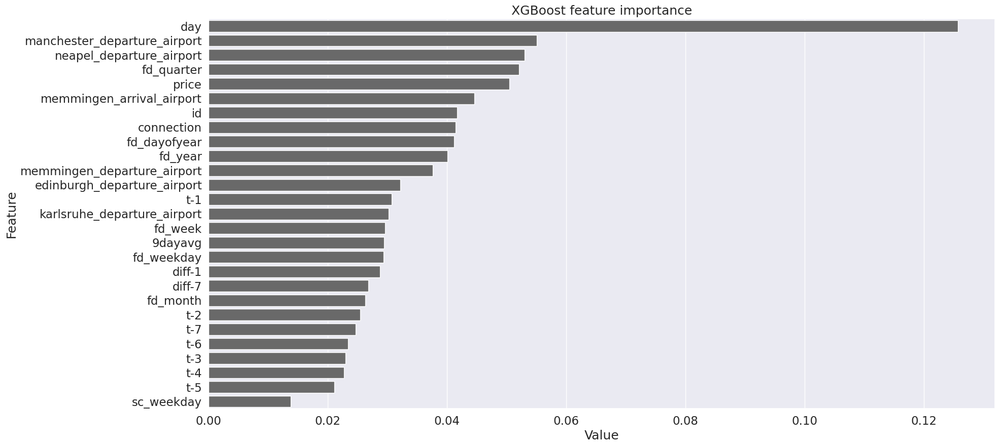

time: 647 ms (started: 2023-08-02 13:39:13 +00:00)


In [231]:
feature_imp = pd.DataFrame(sorted(zip(xgb_clf.feature_importances_, used_columns), reverse=True),
                           columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.set(font_scale=1.5)
sns.barplot(x="Value", y="Feature",
            data=feature_imp[feature_imp["Value"]>0].sort_values(by="Value", ascending=False),
            color="dimgray")
plt.title('XGBoost feature importance')
#plt.tight_layout()
plt.show()

In [232]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, xgb_clf.predict(X_test))

array([[50562,   261],
       [  163,   100]])

time: 247 ms (started: 2023-08-02 13:39:13 +00:00)


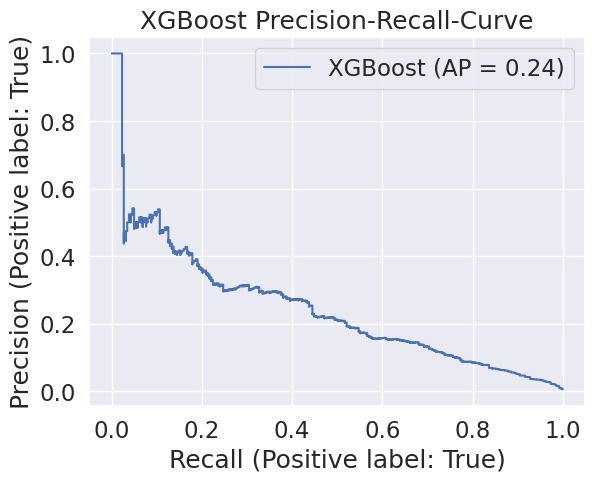

time: 563 ms (started: 2023-08-02 13:39:14 +00:00)


In [233]:
# Precision/ Recall Trade-Off
fig, ax = plt.subplots()
PrecisionRecallDisplay.from_estimator(
    xgb_clf, X_test, y_test, name="XGBoost", ax=ax)
ax.set_title("XGBoost Precision-Recall-Curve")
plt.legend(loc='upper right')
plt.show()

In [234]:
precision, recall, thresholds = precision_recall_curve(y_test, xgb_clf.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
print('Best threshold: ', thresholds[np.argmax(f05_scores)])
print('Best F05-Score: ', np.max(f05_scores))

Best threshold:  0.879205
Best F05-Score:  0.3259259259259259
time: 249 ms (started: 2023-08-02 13:39:14 +00:00)


In [235]:
results_clf.loc[len(results_clf.index)] = ['XGBoost',
                                           precision_score(y_test, xgb_clf.predict(X_test)),
                                           recall_score(y_test, xgb_clf.predict(X_test)),
                                           f1_score(y_test, xgb_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, xgb_clf.predict(X_test)),
                                           fbeta_score(y_train_full, xgb_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, xgb_clf.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, xgb_clf.predict(X_test))
                                           ]

time: 5.6 s (started: 2023-08-02 13:39:14 +00:00)


In [236]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,F0.5-Score_opti,Accuracy
0,Dummy- Classifier 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy-Classifier-Stratified,0.007109,0.003802,0.008671,0.002282,0.008492,0.007784,0.002472,0.986258
2,Decision Tree,0.500000,0.098859,0.165079,0.220720,0.394971,0.276008,0.286285,0.994852
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.318979,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.292826,0.992248
5,XGBoost,0.277008,0.380228,0.320513,0.320466,0.991346,0.292912,0.325926,0.991700


time: 32.4 ms (started: 2023-08-02 13:39:20 +00:00)


### LightGBM (nicht implementiert)

In [237]:
import lightgbm as lgb

time: 1.45 s (started: 2023-08-02 13:39:20 +00:00)


#### Optimierung der Hyperparameter für LightGBM

In [ ]:
parameters = {"n_estimators":(20,50,100,200),
              "max_features":()}
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)
grid_search_lgb = GridSearchCV(lgb.LGBMClassifier(random_state = 42), parameters, cv = tscv, scoring = fbeta_scorer)
grid_search_lgb.fit(X_train, y_train)

#### Training des finalen Models für LightGBM

In [ ]:
lgbm_clf = lgb.LGBMClassifier(num_leaves=16,
                        learning_rate=0.05,
                        n_estimators=20)
lgbm_clf.fit(X_train_full, y_train_full,
        eval_set=[(X_test, y_test)],
        eval_metric='l1',
        callbacks=[lgb.early_stopping(5)]).score(X_test, y_test)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, lgbm_clf.predict(X_test))

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(rnd_clf.feature_importances_, used_columns), reverse=True),
                           columns=['Wert','Feature'])
plt.figure(figsize=(20, 10))
sns.barplot(x="Wert", y="Feature", data=feature_imp[feature_imp["Wert"]>0].sort_values(by="Wert", ascending=False))
plt.title('Decision tree feature importance')
#plt.tight_layout()
plt.show()

In [ ]:
# Precision
f"Precision: {precision_score(y_test, lgbm_clf.predict(X_test))}"

In [ ]:
# Recall
f"Recall: {recall_score(y_test, lgbm_clf.predict(X_test))}"

In [ ]:
# F1 Score
f"F1-Score: {f1_score(y_test, lgbm_clf.predict(X_test))}"

In [ ]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, lgbm_clf.predict(X_test), beta=0.5)}"

In [ ]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, lgbm_clf.predict(X_test))}"

In [ ]:
results_clf.loc[len(results_clf.index)] = ['LightGBM',
                                           precision_score(y_test, lgbm_clf.predict(X_test)),
                                           recall_score(y_test, lgbm_clf.predict(X_test)),
                                           f1_score(y_test, lgbm_clf.predict(X_test)),
                                           fbeta_score(y_test, lgbm_clf.predict(X_test), beta=0.5),
                                           matthews_corrcoef(y_test, lgbm_clf.predict(X_test))
                                           ]

### Stacking der Algorithmen

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

#### Logistic Regression

58 min

In [ ]:
stacking_clf_lr = StackingClassifier(
    estimators=[
        ('dt', DecisionTreeClassifier(max_depth=5, min_samples_leaf=60)),
        ('rf', RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)),
        ('ada', AdaBoostClassifier(DecisionTreeClassifier(max_depth = 2),
                                   random_state = 42,
                                   n_estimators = 50,
                                   learning_rate = 1)),
        ('xgb', xgb.XGBClassifier(random_state = 42,
                                  eval_metric = "aucpr",
                                  scale_pos_weight=2,
                                  n_estimators= 80,
                                  eta= 0.4,
                                  max_depth = 9)),
    ],
    final_estimator = LogisticRegression(class_weight='balanced',random_state = 42),
    stack_method="predict_proba"
)

stacking_clf_lr.fit(X_train_full, y_train_full).score(X_test, y_test)

0.9537055161883882

time: 1h 12min 50s (started: 2023-08-01 21:19:24 +00:00)


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, stacking_clf_lr.predict(X_test))

array([[48505,  2318],
       [   47,   216]])

time: 957 ms (started: 2023-08-01 22:32:14 +00:00)


In [ ]:
# Precision
f"Precision: {precision_score(y_test, stacking_clf_lr.predict(X_test))}"

'Precision: 0.08524072612470403'

time: 956 ms (started: 2023-08-01 22:32:15 +00:00)


In [ ]:
# Recall
f"Recall: {recall_score(y_test, stacking_clf_lr.predict(X_test))}"

'Recall: 0.8212927756653993'

time: 927 ms (started: 2023-08-01 22:32:16 +00:00)


In [ ]:
# F1 Score
f"F1-Score: {f1_score(y_test, stacking_clf_lr.predict(X_test))}"

'F1-Score: 0.1544511977118341'

time: 937 ms (started: 2023-08-01 22:32:17 +00:00)


In [ ]:
# F0.5 Score (beta = 0,5)
f"F0.5-Score: {fbeta_score(y_test, stacking_clf_lr.predict(X_test), beta=0.5)}"

'F0.5-Score: 0.10385614001346283'

time: 972 ms (started: 2023-08-01 22:32:18 +00:00)


In [ ]:
# Matthews correlation coeffient
f"MCC: {matthews_corrcoef(y_test, stacking_clf_lr.predict(X_test))}"

'MCC: 0.2556734967304416'

time: 975 ms (started: 2023-08-01 22:32:19 +00:00)


In [ ]:
precision, recall, thresholds = precision_recall_curve(y_test, stacking_clf_lr.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
print('Best threshold: ', thresholds[np.argmax(f05_scores)])
print('Best F05-Score: ', np.max(f05_scores))

Best threshold:  0.7455268038823475
Best F05-Score:  0.32974427994616423
time: 1.37 s (started: 2023-08-01 22:32:20 +00:00)


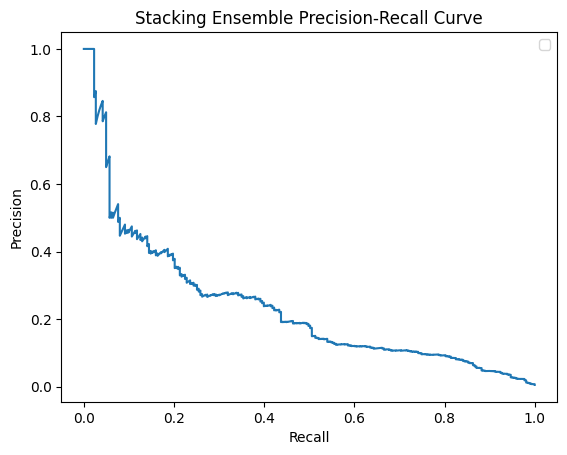

time: 568 ms (started: 2023-08-01 22:32:21 +00:00)


In [ ]:
fig, ax = plt.subplots()
ax.plot(recall, precision)
ax.set_title('Stacking Ensemble Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
plt.legend(loc='upper right')
plt.show()

In [ ]:
results_clf.loc[len(results_clf.index)] = ['Stacking Classifier LogR',
                                           precision_score(y_test, stacking_clf_lr.predict(X_test)),
                                           recall_score(y_test, stacking_clf_lr.predict(X_test)),
                                           f1_score(y_test, stacking_clf_lr.predict(X_test)),
                                           matthews_corrcoef(y_test, stacking_clf_lr.predict(X_test)),
                                           fbeta_score(y_train_full, stacking_clf_lr.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, stacking_clf_lr.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, stacking_clf_lr.predict(X_test))
                                           ]

In [ ]:
results_clf

#### Decision Tree

1h10min

In [ ]:
stacking_clf_dt = StackingClassifier(
    estimators=[
        ('dt', DecisionTreeClassifier(max_depth=5,
                                      min_samples_leaf=60)),
        ('rf', RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)),
        ('ada', AdaBoostClassifier(DecisionTreeClassifier(max_depth=2),
                                   random_state=42,
                                   n_estimators=50,
                                   learning_rate = 1)),
        ('xgb', xgb.XGBClassifier(random_state = 42,
                                  eval_metric = "aucpr",
                                  scale_pos_weight=2,
                                  n_estimators= 80,
                                  eta= 0.4,
                                  max_depth = 9))
    ],
    final_estimator = DecisionTreeClassifier(max_depth=5),
    stack_method="predict_proba"
)

stacking_clf_dt.fit(X_train_full, y_train_full).score(X_test, y_test)

0.9942841482989468

time: 1h 18min 38s (started: 2023-08-01 22:32:22 +00:00)


In [ ]:
precision, recall, thresholds = precision_recall_curve(y_test, stacking_clf_dt.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))

time: 885 ms (started: 2023-08-01 23:51:00 +00:00)


In [ ]:
results_clf.loc[len(results_clf.index)] = ['Stacking Classifier DT',
                                           precision_score(y_test, stacking_clf_dt.predict(X_test)),
                                           recall_score(y_test, stacking_clf_dt.predict(X_test)),
                                           f1_score(y_test, stacking_clf_dt.predict(X_test)),
                                           matthews_corrcoef(y_test, stacking_clf_dt.predict(X_test)),
                                           fbeta_score(y_train_full, stacking_clf_dt.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, stacking_clf_dt.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, stacking_clf_dt.predict(X_test))
                                           ]

#### Random Forest

1h7min

In [ ]:
stacking_clf_rf = StackingClassifier(
    estimators=[
        ('dt', DecisionTreeClassifier(max_depth=5,
                                      min_samples_leaf=60)),
        ('rf', RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)),
        ('ada', AdaBoostClassifier(DecisionTreeClassifier(max_depth=2),
                                   random_state=42,
                                   n_estimators=50,
                                   learning_rate = 1)),
        ('xgb', xgb.XGBClassifier(random_state = 42,
                                  eval_metric = "aucpr",
                                  scale_pos_weight=2,
                                  n_estimators= 80,
                                  eta= 0.4,
                                  max_depth = 9)),

    ],
    final_estimator = RandomForestClassifier(n_estimators=30,
                                             max_depth=5,
                                             max_features=None),
    stack_method="predict_proba"
)

stacking_clf_rf.fit(X_train_full, y_train_full).score(X_test, y_test)

In [ ]:
precision, recall, thresholds = precision_recall_curve(y_test, stacking_clf_rf.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))

In [ ]:
results_clf.loc[len(results_clf.index)] = ['Stacking Classifier RF',
                                           precision_score(y_test, stacking_clf_rf.predict(X_test)),
                                           recall_score(y_test, stacking_clf_rf.predict(X_test)),
                                           f1_score(y_test, stacking_clf_rf.predict(X_test)),
                                           matthews_corrcoef(y_test, stacking_clf_rf.predict(X_test)),
                                           fbeta_score(y_train_full, stacking_clf_rf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, stacking_clf_rf.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, stacking_clf_rf.predict(X_test))
                                           ]

In [ ]:
results_clf

### Voting Classifier mit Soft Voting

13 min

In [ ]:
from sklearn.ensemble import VotingClassifier
voting_clf = VotingClassifier(
    estimators=[
        ('dt', DecisionTreeClassifier(max_depth=5,
                                      min_samples_leaf=15)),
        ('rf', RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)),
        ('ada', AdaBoostClassifier(DecisionTreeClassifier(max_depth=2),
                                   random_state=42,
                                   n_estimators=50,
                                   learning_rate = 1)),
        ('xgb', xgb.XGBClassifier(random_state = 42,
                                  eval_metric = "aucpr",
                                  scale_pos_weight=2,
                                  n_estimators= 80,
                                  eta= 0.4,
                                  max_depth = 9))
        ],
    voting="soft"
)

voting_clf.fit(X_train_full, y_train_full).score(X_test, y_test)

In [ ]:
precision, recall, thresholds = precision_recall_curve(y_test, voting_clf.predict_proba(X_test)[:,1])
f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))

In [ ]:
fig, ax = plt.subplots()
ax.plot(recall, precision)
ax.set_title('Voting Ensemble Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')
plt.legend(loc='upper right')
plt.show()

In [ ]:
results_clf.loc[len(results_clf.index)] = ['Voting Classifier',
                                           precision_score(y_test, voting_clf.predict(X_test)),
                                           recall_score(y_test, voting_clf.predict(X_test)),
                                           f1_score(y_test, voting_clf.predict(X_test)),
                                           matthews_corrcoef(y_test, voting_clf.predict(X_test)),
                                           fbeta_score(y_train_full, voting_clf.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, voting_clf.predict(X_test), beta=0.5),
                                           np.max(f05_scores),
                                           accuracy_score(y_test, voting_clf.predict(X_test))
                                           ]

In [ ]:
results_clf

## ! All in one !

Hier sind die vorhergehenden Algorithmen nochmals zusammengefasst, damit man sie schneller ausführen und bei der Evaluation vergleichen kann.

In [238]:
fbeta_scorer = make_scorer(fbeta_score, beta=0.5)

time: 621 µs (started: 2023-08-02 13:39:22 +00:00)


In [239]:
# Erstelle Dataframe mit Ergebnissen
results_clf = pd.DataFrame(columns=['Classifier',
                                    'Precision',
                                    'Recall',
                                    'F1-Score',
                                    'Matthews Correlation',
                                    'F0.5-Score_train',
                                    'F0.5-Score_test',
                                    'Accuracy'
                                    ])

time: 4.1 ms (started: 2023-08-02 13:39:22 +00:00)


In [240]:
def write_to_results(model, model_name, X_test, y_test):
  results_clf.loc[len(results_clf.index)]= [model_name,
                                           precision_score(y_test, model.predict(X_test)),
                                           recall_score(y_test, model.predict(X_test)),
                                           f1_score(y_test, model.predict(X_test)),
                                           matthews_corrcoef(y_test, model.predict(X_test)),
                                           fbeta_score(y_train_full, model.predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, model.predict(X_test), beta=0.5),
                                           accuracy_score(y_test, model.predict(X_test))
                                           ]


time: 1.01 ms (started: 2023-08-02 13:39:22 +00:00)


In [241]:
dummy_clf_most_freq = DummyClassifier(strategy="most_frequent")
dummy_clf_most_freq.fit(X_train, y_train)
write_to_results(dummy_clf_most_freq, "Dummy 1", X_test, y_test)

dummy_clf = DummyClassifier(strategy="stratified")
dummy_clf.fit(X_train,y_train)
write_to_results(dummy_clf, "Dummy 1", X_test, y_test)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time: 826 ms (started: 2023-08-02 13:39:22 +00:00)


In [242]:
tree_clf = DecisionTreeClassifier(max_depth=8, min_samples_leaf=60)
tree_clf.fit(X_train_full,y_train_full).score(X_test, y_test)
write_to_results(tree_clf, "Decision Tree", X_test, y_test)

time: 12.8 s (started: 2023-08-02 13:39:22 +00:00)


In [243]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy 1,0.004751,0.007605,0.002941,-0.006447,0.008758,0.000000,0.987081
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911


time: 15.4 ms (started: 2023-08-02 13:39:35 +00:00)


In [244]:
rnd_clf = RandomForestClassifier(random_state = 42,
                                 max_depth=8,
                                 max_features=None,
                                 n_estimators=45,
                                 class_weight= None,
                                 min_samples_leaf= 22,
                                 max_leaf_nodes=150)
rnd_clf.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(rnd_clf, "Random Forest", X_test, y_test)

time: 6min 12s (started: 2023-08-02 13:39:35 +00:00)


In [245]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy 1,0.004751,0.007605,0.002941,-0.006447,0.008758,0.000000,0.987081
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.994774


time: 19.3 ms (started: 2023-08-02 13:45:48 +00:00)


In [246]:
ada_clf = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth = 2),
    random_state = 42,
    n_estimators = 60,
    learning_rate = 1
)
ada_clf.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(ada_clf, "Adaboost", X_test, y_test)

time: 3min 39s (started: 2023-08-02 13:45:48 +00:00)


In [247]:
scale_pos_weight = (~y_train_full).values.sum()/y_train_full.values.sum()
xgb_clf = xgb.XGBClassifier(random_state = 42,
                            eval_metric = "aucpr",
                            scale_pos_weight=2,
                            n_estimators= 70,
                            eta= 0.4,
                            max_depth = 10)
xgb_clf.fit(X_train_full, y_train_full)
write_to_results(xgb_clf, "XGBoost", X_test, y_test)

time: 5min 55s (started: 2023-08-02 13:49:28 +00:00)


In [248]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy 1,0.004751,0.007605,0.002941,-0.006447,0.008758,0.000000,0.987081
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.992248
5,XGBoost,0.277008,0.380228,0.320513,0.320466,0.991346,0.292912,0.991700


time: 16 ms (started: 2023-08-02 13:55:24 +00:00)


In [249]:
from sklearn.ensemble import StackingClassifier
stacking_clf_lr= StackingClassifier(estimators=[("dt", tree_clf), ("rf", rnd_clf), ("ada", ada_clf), ("xgb", xgb_clf)],
                                  final_estimator = LogisticRegression(class_weight='balanced',random_state = 42),
                                  stack_method="predict_proba",
                                  cv="prefit")
stacking_clf_lr.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(stacking_clf_lr, "Stacking Classifier Logreg", X_test, y_test)

time: 48.5 s (started: 2023-08-02 13:55:24 +00:00)


In [250]:
from sklearn.ensemble import StackingClassifier
stacking_clf_dt= StackingClassifier(estimators=[("dt", tree_clf), ("rf", rnd_clf), ("ada", ada_clf), ("xgb", xgb_clf)],
                                  final_estimator = DecisionTreeClassifier(max_depth=3),
                                  stack_method="predict_proba",
                                  cv="prefit")
stacking_clf_dt.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(stacking_clf_dt, "Stacking Classifier Tree", X_test, y_test)

time: 45.4 s (started: 2023-08-02 13:56:12 +00:00)


In [251]:
from sklearn.ensemble import StackingClassifier
stacking_clf_rf= StackingClassifier(estimators=[("dt", tree_clf), ("rf", rnd_clf), ("ada", ada_clf), ("xgb", xgb_clf)],
                                  final_estimator = RandomForestClassifier(n_estimators=30,
                                                                           max_depth=5,
                                                                           max_features=None),
                                  stack_method="predict_proba",
                                    cv="prefit")
stacking_clf_rf.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(stacking_clf_rf, "Stacking Classifier RF", X_test, y_test)

time: 1min 45s (started: 2023-08-02 13:56:58 +00:00)


In [252]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy 1,0.004751,0.007605,0.002941,-0.006447,0.008758,0.000000,0.987081
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.992248
5,XGBoost,0.277008,0.380228,0.320513,0.320466,0.991346,0.292912,0.991700
6,Stacking Classifier Logreg,0.249453,0.433460,0.316667,0.324328,0.910807,0.272597,0.990369
7,Stacking Classifier Tree,0.288525,0.334601,0.309859,0.306872,0.992872,0.296696,0.992327
8,Stacking Classifier RF,0.287879,0.361217,0.320405,0.318552,0.992203,0.300063,0.992111


time: 17.2 ms (started: 2023-08-02 13:58:43 +00:00)


In [253]:
from sklearn.ensemble import VotingClassifier
v_clf_list = [ tree_clf, rnd_clf, ada_clf, xgb_clf]
voting_clf_soft= VotingClassifier([("dt", tree_clf), ("rf", rnd_clf), ("ada", ada_clf), ("xgb", xgb_clf)],
                                  voting = "soft")
voting_clf_soft.estimators_ = v_clf_list
voting_clf_soft.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(voting_clf_soft, "Voting Classifier Soft", X_test, y_test)

time: 18min 41s (started: 2023-08-02 13:58:43 +00:00)


In [254]:
from sklearn.ensemble import VotingClassifier
v_clf_list = [ tree_clf, rnd_clf, ada_clf, xgb_clf]
voting_clf_hard= VotingClassifier([("dt", tree_clf), ("rf", rnd_clf), ("ada", ada_clf), ("xgb", xgb_clf)],
                                  voting = "hard")
voting_clf_hard.estimators_ = v_clf_list
voting_clf_hard.fit(X_train_full, y_train_full).score(X_test, y_test)
write_to_results(voting_clf_hard, "Voting Classifier Hard", X_test, y_test)

time: 18min 36s (started: 2023-08-02 14:17:25 +00:00)


In [255]:
results_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.994852
1,Dummy 1,0.004751,0.007605,0.002941,-0.006447,0.008758,0.000000,0.987081
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.992248
5,XGBoost,0.277008,0.380228,0.320513,0.320466,0.991346,0.292912,0.991700
6,Stacking Classifier Logreg,0.249453,0.433460,0.316667,0.324328,0.910807,0.272597,0.990369
7,Stacking Classifier Tree,0.288525,0.334601,0.309859,0.306872,0.992872,0.296696,0.992327
8,Stacking Classifier RF,0.287879,0.361217,0.320405,0.318552,0.992203,0.300063,0.992111
9,Voting Classifier Soft,0.348958,0.254753,0.294505,0.295073,0.664210,0.324927,0.993716


time: 19.9 ms (started: 2023-08-02 14:36:02 +00:00)


#### Test auf Testset mit neuen Flugverbindungen

In [256]:
#X_test_2, y_test_2
# Erstelle Dataframe mit Ergebnissen
results_new_clf = pd.DataFrame(columns=['Classifier',
                                    'Precision',
                                    'Recall',
                                    'F1-Score',
                                    'Matthews Correlation',
                                    'F0.5-Score_train',
                                    'F0.5-Score_test',
                                    'Accuracy'
                                    ])

time: 4.55 ms (started: 2023-08-02 14:36:02 +00:00)


In [257]:
def write_to_results_2(model, X_test, y_test):
  results_new_clf.loc[len(results_new_clf.index)]= [model[1],
                                           precision_score(y_test, model[0].predict(X_test)),
                                           recall_score(y_test, model[0].predict(X_test)),
                                           f1_score(y_test, model[0].predict(X_test)),
                                           matthews_corrcoef(y_test, model[0].predict(X_test)),
                                           fbeta_score(y_train_full, model[0].predict(X_train_full), beta=0.5),
                                           fbeta_score(y_test, model[0].predict(X_test), beta=0.5),
                                           accuracy_score(y_test, model[0].predict(X_test))
                                           ]


time: 1.2 ms (started: 2023-08-02 14:36:02 +00:00)


In [258]:
clf_list = [ (dummy_clf_most_freq,"Dummy"), (dummy_clf,"Dummy Strat"), (tree_clf,"Decision Tree"),
            (rnd_clf,"Random Forest"), (ada_clf,"AdaBoost"), (xgb_clf,"XGBoost")]
  #          (stacking_clf_lr), (stacking_clf_dt),(stacking_clf_rf),
  #          (voting_clf_soft,"Soft Voting"), (voting_clf_hard,"Hard Voting")]


time: 890 µs (started: 2023-08-02 14:36:02 +00:00)


In [259]:
X_test_2

,price,day,fd_year,fd_quarter,fd_month,fd_week,fd_weekday,sc_weekday,fd_dayofyear,9dayavg,id,connection,diff-1,diff-7,t-1,t-2,t-3,t-4,t-5,t-6,t-7,bremen_departure_airport,bristol_departure_airport,dublin_departure_airport,edinburgh_departure_airport,karlsruhe_departure_airport,köln_departure_airport,malaga_departure_airport,malta_departure_airport,manchester_departure_airport,memmingen_departure_airport,neapel_departure_airport,warschau_departure_airport,bremen_arrival_airport,bristol_arrival_airport,dublin_arrival_airport,edinburgh_arrival_airport,karlsruhe_arrival_airport,köln_arrival_airport,malaga_arrival_airport,malta_arrival_airport,manchester_arrival_airport,memmingen_arrival_airport
856672,84.99,150,2023,3,9,39,5,2,273,57.767838,20230930100109,1100109.0,5.32,-11.00,90.31,89.31,89.31,83.990,79.49,74.99,73.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
856675,78.79,146,2023,3,9,39,1,2,269,40.785025,20230926100109,1100109.0,-0.00,-19.19,78.79,63.99,68.26,55.990,55.99,55.99,59.60,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
856677,54.05,147,2023,3,9,39,2,2,270,42.440867,20230927100109,1100109.0,-0.00,-1.84,54.05,54.05,54.13,54.130,54.13,54.13,52.21,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
856682,108.99,319,2024,1,3,11,6,2,77,86.950208,20240317100109,1100109.0,-0.00,-0.00,108.99,108.99,108.99,108.990,108.99,108.99,108.99,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
856692,93.49,152,2023,4,10,40,0,2,275,39.933129,20231002100109,1100109.0,1.00,-0.00,94.49,93.49,94.49,92.350,93.42,94.49,93.49,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017834,98.56,99,2023,3,9,39,5,4,273,57.767838,20230930111103,1111103.0,-0.00,-14.43,98.56,98.56,98.56,91.345,84.13,84.13,84.13,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1017835,51.37,98,2023,3,9,39,4,4,272,34.610882,20230929111103,1111103.0,-0.00,-15.15,51.37,51.37,51.37,46.575,41.78,41.78,36.22,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1017836,24.99,97,2023,3,9,39,3,4,271,45.092364,20230928111103,1111103.0,-1.00,-1.00,23.99,23.99,23.99,23.990,23.99,23.99,23.99,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1017838,23.99,110,2023,4,10,41,2,4,284,58.143084,20231011111103,1111103.0,-0.00,5.98,23.99,23.99,23.99,25.990,27.99,27.99,29.97,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


time: 122 ms (started: 2023-08-02 14:36:02 +00:00)


In [260]:
for clf in clf_list:
  write_to_results_2(clf,X_test_2,y_test_2)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time: 34.5 s (started: 2023-08-02 14:36:02 +00:00)


In [261]:
results_new_clf

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.987108
1,Dummy Strat,0.009081,0.010885,0.012243,-0.002720,0.007766,0.010465,0.979006
2,Decision Tree,0.402556,0.091437,0.149024,0.187194,0.394971,0.239544,0.986538
3,Random Forest,0.425000,0.111030,0.176064,0.212368,0.396009,0.271469,0.986603
4,AdaBoost,0.334694,0.178520,0.232844,0.237369,0.401151,0.284854,0.984835
5,XGBoost,0.281755,0.265602,0.273440,0.264353,0.991346,0.278369,0.981804


time: 16.2 ms (started: 2023-08-02 14:36:36 +00:00)


## Threshold optimization

In [262]:
results_t_opt = pd.DataFrame(columns=['Classifier',
                                    'Precision',
                                    'Recall',
                                    'F0.5-Score',
                                    'Precision opt',
                                    'Recall opt',
                                    'F0.5-Score opt',
                                    'Threshold'
                                    ])
clf_list = [ (dummy_clf_most_freq,"Dummy"), (dummy_clf,"Dummy Strat"), (tree_clf,"Decision Tree"),
            (rnd_clf,"Random Forest"), (ada_clf,"AdaBoost"), (xgb_clf,"XGBoost")]

def closest_value(input_list, input_value):
  arr = np.asarray(input_list)
  i = (np.abs(arr - input_value)).argmin()
  return arr[i]

for model in clf_list:
  precision, recall, thresholds = precision_recall_curve(y_train, model[0].predict_proba(X_train)[:,1])
  f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))
  threshold = thresholds[np.argmax(f05_scores)]

  precision, recall, thresholds = precision_recall_curve(y_test, model[0].predict_proba(X_test)[:,1])
  f05_scores = (1+0.5**2)*recall*precision/(recall+(precision*0.5**2))

  best_threshold = closest_value(thresholds, threshold)
  t_idx = np.where(thresholds==best_threshold)

  results_t_opt.loc[len(results_t_opt.index)]= [model[1],
                                                precision_score(y_test, model[0].predict(X_test)),
                                                recall_score(y_test, model[0].predict(X_test)),
                                                fbeta_score(y_test, model[0].predict(X_test),beta=0.5),
                                                precision[t_idx],
                                                recall[t_idx],
                                                f05_scores[t_idx],
                                                best_threshold
                                              ]

results_t_opt.round(3)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Classifier,Precision,Recall,F0.5-Score,Precision opt,Recall opt,F0.5-Score opt,Threshold
0,Dummy,0.000,0.000,0.000,[0.005148181497866343],[1.0],[0.006426955089513066],0.000
1,Dummy Strat,0.005,0.008,0.002,[0.005148181497866343],[1.0],[0.006426955089513066],0.000
2,Decision Tree,0.531,0.099,0.283,[0.10046573519627412],[0.5741444866920152],[0.12031872509960159],0.355
3,Random Forest,0.470,0.118,0.294,[0.1266025641025641],[0.6007604562737643],[0.15033301617507136],0.304
4,AdaBoost,0.251,0.255,0.252,[0.23174603174603176],[0.27756653992395436],[0.2396585686145765],0.499
5,XGBoost,0.277,0.380,0.293,[0.2877906976744186],[0.376425855513308],[0.30201342281879195],0.525


time: 22.2 s (started: 2023-08-02 14:36:36 +00:00)


## Evaluierung der Algorithmen

In [263]:
results_clf.round(3)

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
0,Dummy 1,0.000,0.000,0.000,0.000,0.000,0.000,0.995
1,Dummy 1,0.005,0.008,0.003,-0.006,0.009,0.000,0.987
2,Decision Tree,0.531,0.099,0.167,0.228,0.395,0.283,0.995
3,Random Forest,0.470,0.118,0.188,0.233,0.396,0.294,0.995
4,Adaboost,0.251,0.255,0.253,0.249,0.401,0.252,0.992
5,XGBoost,0.277,0.380,0.321,0.320,0.991,0.293,0.992
6,Stacking Classifier Logreg,0.249,0.433,0.317,0.324,0.911,0.273,0.990
7,Stacking Classifier Tree,0.289,0.335,0.310,0.307,0.993,0.297,0.992
8,Stacking Classifier RF,0.288,0.361,0.320,0.319,0.992,0.300,0.992
9,Voting Classifier Soft,0.349,0.255,0.295,0.295,0.664,0.325,0.994


time: 28.1 ms (started: 2023-08-02 14:36:59 +00:00)


In [264]:
results_clf.loc[2:5, :]

,Classifier,Precision,Recall,F1-Score,Matthews Correlation,F0.5-Score_train,F0.5-Score_test,Accuracy
2,Decision Tree,0.530612,0.098859,0.166667,0.227506,0.394971,0.283224,0.994911
3,Random Forest,0.469697,0.117871,0.188450,0.233468,0.396009,0.294118,0.994774
4,Adaboost,0.250936,0.254753,0.252830,0.248942,0.401151,0.251690,0.992248
5,XGBoost,0.277008,0.380228,0.320513,0.320466,0.991346,0.292912,0.991700


time: 18.7 ms (started: 2023-08-02 14:36:59 +00:00)


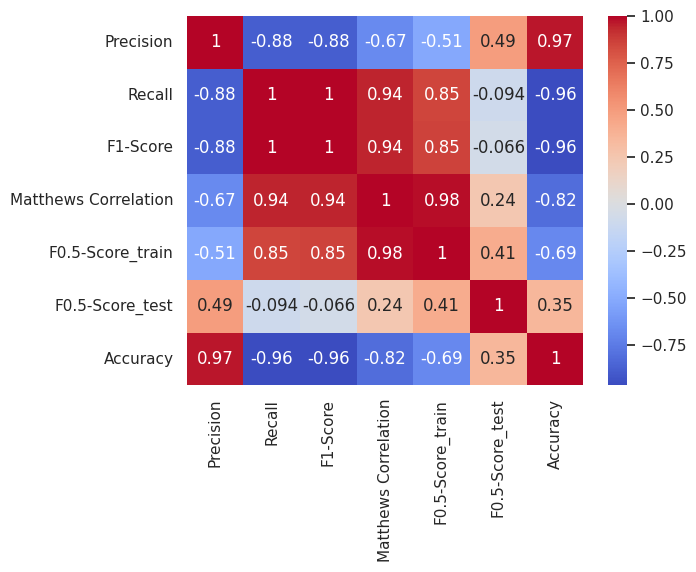

time: 621 ms (started: 2023-08-02 14:36:59 +00:00)


In [265]:
# Korrelation zwischen den Metriken
corr_matrix = results_clf.loc[2:5, results_clf.columns!='Classifier'].corr()
sns.set(font_scale=1)
sns.heatmap(corr_matrix, annot=True, cmap=sns.color_palette("coolwarm", as_cmap=True))
plt.show()

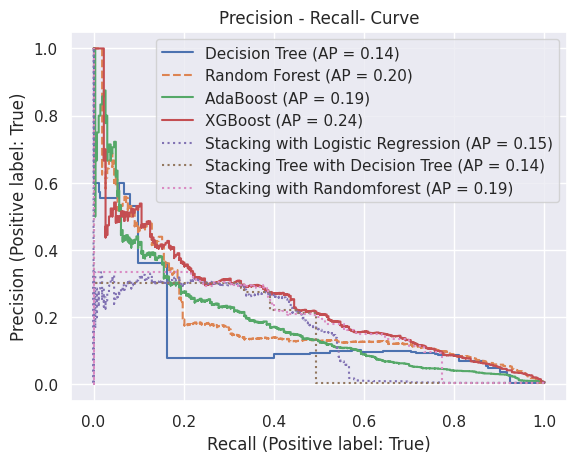

time: 6.08 s (started: 2023-08-02 14:36:59 +00:00)


In [266]:
# Precision/ Recall Curve
fig, ax = plt.subplots()
PrecisionRecallDisplay.from_estimator(
    tree_clf, X_test, y_test, name="Decision Tree", ax=ax)
PrecisionRecallDisplay.from_estimator(
    rnd_clf, X_test, y_test, name="Random Forest", ax=ax, ls='--')
PrecisionRecallDisplay.from_estimator(
    ada_clf, X_test, y_test, name="AdaBoost", ax=ax)
PrecisionRecallDisplay.from_estimator(
    xgb_clf, X_test, y_test, name="XGBoost", ax=ax)
PrecisionRecallDisplay.from_estimator(
    stacking_clf_lr, X_test, y_test, name="Stacking with Logistic Regression", ax=ax,linestyle='dotted')
PrecisionRecallDisplay.from_estimator(
    stacking_clf_dt, X_test, y_test, name="Stacking Tree with Decision Tree", ax=ax,linestyle='dotted')
PrecisionRecallDisplay.from_estimator(
    stacking_clf_rf, X_test, y_test, name="Stacking with Randomforest", ax=ax,linestyle='dotted')

'''PrecisionRecallDisplay.from_estimator(
    voting_clf_soft, X_test, y_test, name="Soft Voting Classifier", ax=ax)
PrecisionRecallDisplay.from_estimator(
    voting_clf_hard, X_test, y_test, name="Hard Voting Classifier", ax=ax)'''
plt.legend(loc='upper right')
ax.set_title("Precision - Recall- Curve")
plt.show()

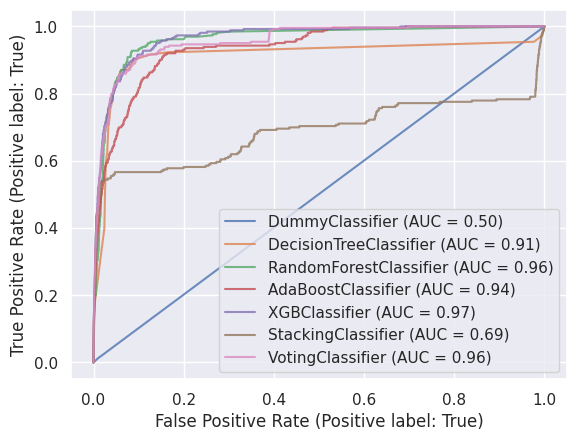

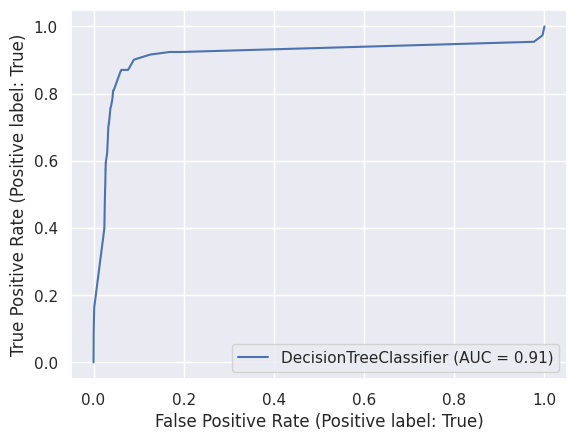

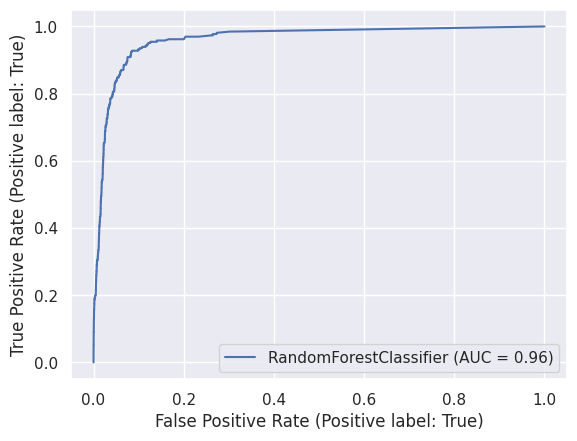

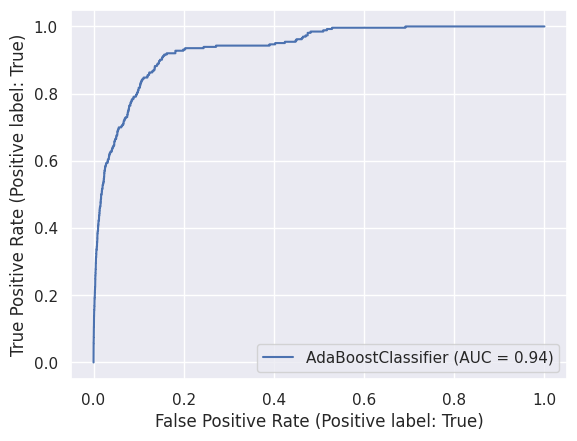

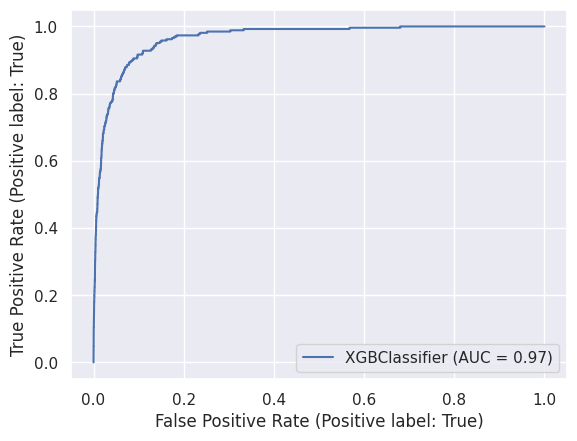

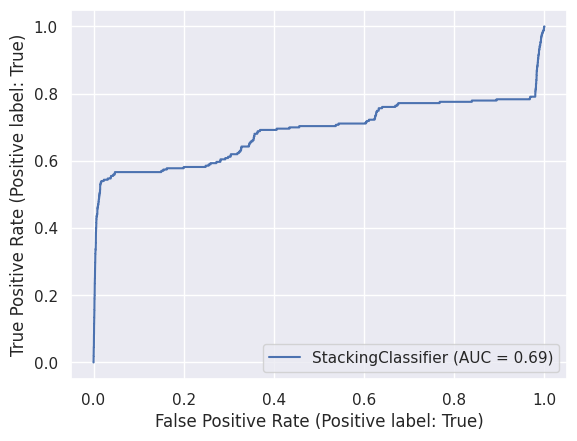

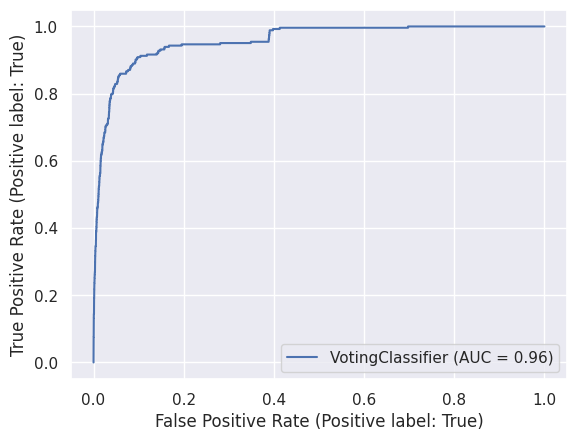

time: 5.38 s (started: 2023-08-02 14:37:05 +00:00)


In [267]:
from sklearn.metrics import RocCurveDisplay

ax = plt.gca()
dummy_disp = RocCurveDisplay.from_estimator(dummy_clf, X_test, y_test, ax=ax, alpha=0.8)
tree_disp = RocCurveDisplay.from_estimator(tree_clf, X_test, y_test)
tree_disp.plot(ax=ax, alpha=0.8)
rnd_disp = RocCurveDisplay.from_estimator(rnd_clf, X_test, y_test)
rnd_disp.plot(ax=ax, alpha=0.8)
ada_disp = RocCurveDisplay.from_estimator(ada_clf, X_test, y_test)
ada_disp.plot(ax=ax, alpha=0.8)
xgb_disp = RocCurveDisplay.from_estimator(xgb_clf, X_test, y_test)
xgb_disp.plot(ax=ax, alpha=0.8)
stack_disp = RocCurveDisplay.from_estimator(stacking_clf_lr, X_test, y_test)
stack_disp.plot(ax=ax, alpha=0.8)
'''stack_disp = RocCurveDisplay.from_estimator(stacking_clf_dt, X_test, y_test)
stack_disp.plot(ax=ax, alpha=0.8)
stack_disp = RocCurveDisplay.from_estimator(stacking_clf_rf, X_test, y_test)
stack_disp.plot(ax=ax, alpha=0.8)
stack_disp = RocCurveDisplay.from_estimator(voting_clf_hard, X_test, y_test)
stack_disp.plot(ax=ax, alpha=0.8)'''
stack_disp = RocCurveDisplay.from_estimator(voting_clf_soft, X_test, y_test)
stack_disp.plot(ax=ax, alpha=0.8)
plt.show()

Import und Export der trainierten Modelle

In [ ]:
# Modelle speichern
filename = 'dummy_clf.sav'
pickle.dump(dummy_clf, open(filename, 'wb'))
filename = 'tree_clf.sav'
pickle.dump(tree_clf, open(filename, 'wb'))
filename = 'rnd_clf.sav'
pickle.dump(rnd_clf, open(filename, 'wb'))
filename = 'ada_clf.sav'
pickle.dump(ada_clf, open(filename, 'wb'))
filename = 'xgb_clf.sav'<
pickle.dump(xgb_clf, open(filename, 'wb'))
filename = 'stacking_clf_lr.sav'
pickle.dump(stacking_clf_lr, open(filename, 'wb'))
filename = 'stacking_clf_dt.sav'
pickle.dump(stacking_clf_dt, open(filename, 'wb'))
filename = 'stacking_clf_rf.sav'
pickle.dump(stacking_clf_rf, open(filename, 'wb'))
filename = 'voting_clf_hard.sav'
pickle.dump(voting_clf_hard, open(filename, 'wb'))
filename = 'voting_clf_soft.sav'
pickle.dump(voting_clf_soft, open(filename, 'wb'))

In [ ]:
# Modelle laden
dummy_clf = pickle.load(open(dummy_clf.sav, 'rb'))
tree_clf = pickle.load(open(tree_clf.sav, 'rb'))
rnd_clf = pickle.load(open(rnd_clf.sav, 'rb'))
ada_clf = pickle.load(open(ada_clf.sav, 'rb'))
xgb_clf = pickle.load(open(xgb_clf.sav, 'rb'))
stacking_clf_lr = pickle.load(open(stacking_clf_lr.sav, 'rb'))
stacking_clf_dt = pickle.load(open(stacking_clf_dt.sav, 'rb'))
stacking_clf_rf = pickle.load(open(stacking_clf_rf.sav, 'rb'))
voting_clf_hard = pickle.load(open(voting_clf_hard.sav, 'rb'))
voting_clf_soft = pickle.load(open(voting_clf_soft.sav, 'rb'))
print("loaded")